In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import xarray as xr
import lightgbm as lgb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from lightgbm import LGBMRegressor, early_stopping, plot_metric, record_evaluation
from hyperopt import fmin, hp, partial, tpe, Trials
import sys
import warnings
sys.path.append('../..')
from pipeline.backtest import cross_validation
import pipeline.backtest_trading as bt
from portfolio import Portfolio
from visualization.trading_stat import analyze_stat, bear_market_suite

import itertools
import talib as ta

random_state = 42

In [3]:
base_ds = xr.open_dataset('../../data/nc_2round/base.nc')
fundamental_v0_ds = xr.open_dataset('../../data/nc_2round/fundamental_v0.nc')
market_ds = xr.open_dataset('../../data/nc_2round/market_brief.nc')

ds = xr.merge([base_ds, fundamental_v0_ds, market_ds])

In [4]:
## add feature
ds['return_0'] = ds['close_0']/ds['close_0'].shift(day=1) - 1
ds['close_moving_5'] = ds['close_0'].rolling(day=5).mean()
ds['close_moving_10'] = ds['close_0'].rolling(day=10).mean()
ds['close_moving_20'] = ds['close_0'].rolling(day=20).mean()
ds['close_ma_diff_5'] = ds['close_0'] - ds['close_moving_5']
ds['close_ma_diff_10'] = ds['close_0'] - ds['close_moving_10']
ds['close_ma_diff_20'] = ds['close_0'] - ds['close_moving_20']

In [5]:
start_day = 640
end_day = 1000
val_split_day = 900
lookback = 20
_ds = ds.sel(day=slice(start_day-lookback, end_day)).copy()

In [11]:
## add historical features
ds['return_0'] = ds['close_0']/ds['close_0'].shift(day=1) - 1
ds['close_moving_5'] = ds['close_0'].rolling(day=5).mean()
ds['close_moving_10'] = ds['close_0'].rolling(day=10).mean()
ds['close_moving_20'] = ds['close_0'].rolling(day=20).mean()
ds['close_ma_diff_5'] = ds['close_0'] - ds['close_moving_5']
ds['close_ma_diff_10'] = ds['close_0'] - ds['close_moving_10']
ds['close_ma_diff_20'] = ds['close_0'] - ds['close_moving_20']

In [6]:
## technical
from collections import defaultdict
technicals = defaultdict(list)
for asset in range(54):
    h = _ds['high_0'].to_numpy()[:, asset]
    o = _ds['open_0'].to_numpy()[:, asset]
    l = _ds['low_0'].to_numpy()[:, asset]
    c = _ds['close_0'].to_numpy()[:, asset]

    # technicals['sar'].append(ta.SAR(h, l))
    # technicals['sarext'].append(ta.SAREXT(h, l))
    technicals['rsi'].append(ta.RSI(c, timeperiod=14) - 50)
    technicals['ht_dcperiod'].append(ta.HT_DCPERIOD(c))
    technicals['ht_phasor_inphasse'].append(ta.HT_DCPHASE(c))
    sc, sl = ta.HT_SINE(c)
    technicals['ht_sine_sine'].append(sc)
    technicals['ht_sine_leadsine'].append(sl)
    technicals['awesome'].append(ta.ULTOSC(h, l, c, timeperiod1=5, timeperiod2=10, timeperiod3=20))

for k, l in technicals.items():
    _ds[k] = ('asset', 'day'), np.stack(l, axis=0)
    _ds[k].fillna(_ds[k].isel(day=1))


In [7]:
## adding intraday feature
_ds['volume_0'] = _ds['volume'].sum(dim='timeslot')

def add_bucket_return(_ds: xr.Dataset):
    close = _ds.stack({'bucket': ('day', 'timeslot')})['close']
    breturn = np.log(close / close.shift(bucket=1)).fillna(0)
    _ds['bucket_return'] = breturn.unstack('bucket')

add_bucket_return(_ds)

def add_boundary_intraday_feature(_ds, is_morning, slots):
    mstr = 'morning' if is_morning else 'tail'
    mslice = slice(slots) if is_morning else slice(-slots-1, -1)
    vs = _ds['volume'].isel(timeslot=mslice)
    brs = _ds['bucket_return'].isel(timeslot=mslice)
    _ds[f'{mstr}_volume_ratio{slots}'] = vs.sum(dim='timeslot') / _ds['volume_0']
    _ds[f'{mstr}_breturn{slots}'] = (vs * brs).sum(dim='timeslot') / _ds['volume_0']
    _ds[f'{mstr}_turnover{slots}'] = _ds[f'{mstr}_volume_ratio{slots}'] * _ds['turnoverRatio']

In [8]:
slots = 2, 5
for is_morning, slot in itertools.product((True, False), slots):
    add_boundary_intraday_feature(_ds, is_morning, slot)

In [23]:
_ds.head

<bound method Dataset.head of <xarray.Dataset>
Dimensions:                (day: 381, asset: 54, timeslot: 50)
Coordinates:
  * day                    (day) int32 620 621 622 623 624 ... 997 998 999 1000
  * asset                  (asset) int32 0 1 2 3 4 5 6 ... 47 48 49 50 51 52 53
  * timeslot               (timeslot) int32 1 2 3 4 5 6 7 ... 45 46 47 48 49 50
Data variables: (12/49)
    open                   (day, asset, timeslot) float64 21.0 21.01 ... 9.88
    close                  (day, asset, timeslot) float64 21.01 21.02 ... 9.905
    high                   (day, asset, timeslot) float64 21.01 21.05 ... 9.905
    low                    (day, asset, timeslot) float64 20.95 20.96 ... 9.88
    volume                 (day, asset, timeslot) float64 2.694e+04 ... 1.395...
    money                  (day, asset, timeslot) float64 5.653e+05 ... 1.381...
    ...                     ...
    tail_volume_ratio2     (day, asset) float64 0.03746 0.02643 ... 0.04314
    tail_breturn2         

In [9]:
## summarize all features:


fund_features = [
    'pe', 'pcf', 'turnoverRatio'
]
trad_features = [
    'return_0', 'close_moving_5','close_moving_10','close_moving_20',
'close_ma_diff_5','close_ma_diff_10','close_ma_diff_20'
]
technicals = [
 'rsi', 'ht_dcperiod', 'ht_phasor_inphasse', 'ht_sine_sine', 'ht_sine_leadsine', 'awesome'
]
market_cap_features = [
    'market_cap'
]
outstanding_features = [f'{mstr}_{t}{slot}' for mstr, t, slot in itertools.product(('morning', 'tail'), ('volume_ratio', 'breturn', 'turnover'), slots)]

categorical_feature = [
    'asset'
]


In [21]:
features = (fund_features + technicals + trad_features + outstanding_features
            + market_cap_features)
# categorical_feature = []

In [22]:
target = 'return'
_start = val_split_day - 50
_end = val_split_day + 1

In [37]:
enable_asset = 'asset' in categorical_feature
enable_day = False


train_df = _ds[features + [target]].sel(day=range(_start, val_split_day)).to_dataframe(dim_order=['day', 'asset'])
val_df = _ds[features + [target]].sel(day=slice(val_split_day, _end)).to_dataframe(dim_order=['day', 'asset'])
if enable_asset:
    train_df.reset_index(level='asset', inplace=True)
    val_df.reset_index(level='asset', inplace=True)
    # train_df['asset'] = train_df.get_level_values('asset')
    # val_df['asset'] = val_df.get_level_values('asset')
if enable_day:
    train_df['day'] = train_df.index.get_level_values('day')
    val_df['day'] = val_df.index.get_level_values('day')
    features+=['day']
train_X, train_y = train_df[features + (['asset'] if enable_asset else [])].copy(), train_df[target].copy()
train_y_binary = (train_y > 0).astype(int)
val_X, val_y = val_df[features + (['asset'] if enable_asset else [])].copy(), val_df[target].copy()
val_y_binary = (val_y > 0).astype(int)

In [38]:
val_X.index

Int64Index([900, 900, 900, 900, 900, 900, 900, 900, 900, 900,
            ...
            901, 901, 901, 901, 901, 901, 901, 901, 901, 901],
           dtype='int64', name='day', length=108)

In [42]:
val_X.head()

,pe,pcf,turnoverRatio,rsi,ht_dcperiod,ht_phasor_inphasse,ht_sine_sine,ht_sine_leadsine,awesome,return_0,...,morning_turnover2,morning_turnover5,tail_volume_ratio2,tail_volume_ratio5,tail_breturn2,tail_breturn5,tail_turnover2,tail_turnover5,market_cap,asset
day,,,,,,,,,,,,,,,,,,,,,
900,34.8218,-51.3855,0.2788,-6.981701,18.385691,73.684205,0.959728,0.877279,43.508676,0.004080,...,0.022520,0.041012,0.091662,0.141657,0.000075,0.000117,0.025555,0.039494,0.903192,0
900,24.5614,-1837.5347,0.7176,-12.079987,20.419533,270.494254,-0.999963,-0.700981,35.179791,-0.017684,...,0.033515,0.085494,0.121459,0.173851,-0.000294,-0.000260,0.087159,0.124756,1.757315,1
900,43.7163,-316.1593,0.6571,6.624377,19.184967,174.755235,0.091411,-0.639509,57.903148,0.026044,...,0.030354,0.083840,0.040359,0.118489,0.000062,0.000086,0.026520,0.077859,4.172932,2
900,12.1154,303.4596,0.2793,-12.324890,15.516572,119.436573,0.870900,0.268305,29.227547,-0.009835,...,0.011760,0.032266,0.049228,0.116228,0.000018,0.000045,0.013749,0.032463,0.572587,3
900,36.8920,-64.8190,6.2682,31.857114,28.115038,155.188068,0.419641,-0.345103,67.123418,0.099639,...,0.611630,1.660301,0.052871,0.146067,0.000000,0.000400,0.331409,0.915577,1.411983,4


In [24]:
## Process extreme value, not activated rn

def process_extreme_values(X, y):
    for col in X:
        if col == 'asset' or col == 'close_0':
            continue
        lq, uq = X[col].quantile(5e-3), X[col].quantile(1-5e-3)
        X[col] = np.clip(X[col], lq, uq)
    ylq, yuq = y.quantile(2e-4), y.quantile(1-2e-4)
    mask = (y > ylq) & (y < yuq)
    return X.loc[mask], y.loc[mask]

train_X, train_y = process_extreme_values(train_X, train_y)
val_X, val_y = process_extreme_values(val_X, val_y)

In [25]:
train_data = lgb.Dataset(data=train_X, label=train_y, categorical_feature=categorical_feature, free_raw_data=False)
val_data = lgb.Dataset(data=val_X, label=val_y, categorical_feature=categorical_feature, free_raw_data=False)

LightGBM auxillary functions

In [63]:
def mape(y_true, y_pred):
    y_true_np, y_pred_np = np.array(y_true), np.array(y_pred)
    mape_score = np.mean(np.abs(y_true_np - y_pred_np) / (np.abs(y_true_np) + 1e-4))
    return mape_score

def mape_lgbm(preds, train_data):
    labels = train_data.get_label()
    err = mape(labels, preds)
    return 'mape', err, False

def lgb_get_model_score_mape(model):
    prediction = model.predict(val_X, num_iteration = model.best_iteration)
    y_predicted = pd.Series(prediction)
    return mape(val_y, y_predicted)

def coerce_int(d):
    _d = {}
    for k, v in d.items():
        if isinstance(v, float):
            if np.isclose(v, int(v)):
                _d[k] = int(v)
                continue
        _d[k] = v
    return _d

def arg_aug(d, handle_int=False):
    num_boost_round = int(d['num_boost_round'])
    del d['num_boost_round']

    params = {
        'nthread': 4,
        'objective': 'regression',
        'feature_fraction': 0.8,
        'bagging_freq':3,
        # "bagging_fraction": 0.8,
        'bagging_seed': random_state,
        'verbosity': -1,
        'metric': ['mape', 'regression'],
        'early_stopping_rounds':10
    }
    params.update(coerce_int(d))
    return num_boost_round, params

def lightgbm_factory(argsDict,  train_data, val_data, X_val, y_val):
    num_boost_round, params = arg_aug(argsDict, handle_int=False)
    model_lgb = lgb.train(params=params, train_set=train_data, num_boost_round=num_boost_round,
                          valid_sets=[val_data],
                          categorical_feature=categorical_feature,
                          feval=mape_lgbm, #tailor-made metri
                          # callbacks=[early_stopping(50, verbose=False)]
                          )
    return mape(y_val, model_lgb.predict(X_val, num_iteration = model_lgb.best_iteration))

In [27]:
warnings.filterwarnings("ignore", category=UserWarning)
# Find a best model
lgb_space = {
    "max_depth": hp.uniformint("max_depth", 5, 15),
    "num_boost_round": hp.uniformint("num_boost_round", 5, 100),
    "learning_rate": hp.loguniform("learning_rate", -4, -1),
    "lambda_l1": hp.loguniform("lambda_l1", -3, 1),
    "lambda_l2": hp.loguniform("lambda_l2", -2, 2),
    'subsample': hp.uniform('subsample', 0.5, 1.0),
    "num_leaves": hp.uniformint("num_leaves", 10, 500),
    # "bagging_freq": hp.uniformint("bagging_freq", 1, 10),
}
algo = partial(tpe.suggest, n_startup_jobs=1)
lgb_best = fmin(fn=lightgbm_factory, space=lgb_space, algo=algo, max_evals=100, pass_expr_memo_ctrl=None)

evals = {}
num_boost_round, lgb_best = arg_aug(lgb_best, handle_int=True)
model = lgb.train(params=lgb_best, train_set=train_data, num_boost_round=num_boost_round,
                  valid_sets=[train_data, val_data], categorical_feature=categorical_feature,
                  callbacks=[early_stopping(50, verbose=False), record_evaluation(evals)])

[1]	valid_0's mape: 0.0191735	valid_0's l2: 0.0006298	valid_0's mape: 0.955493
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0192782	valid_0's l2: 0.000633481	valid_0's mape: 0.970447
[3]	valid_0's mape: 0.0192689	valid_0's l2: 0.000634414	valid_0's mape: 0.9711
[4]	valid_0's mape: 0.0192929	valid_0's l2: 0.000636309	valid_0's mape: 0.967344
[5]	valid_0's mape: 0.0192382	valid_0's l2: 0.000634002	valid_0's mape: 0.961288
[6]	valid_0's mape: 0.0191306	valid_0's l2: 0.000627127	valid_0's mape: 0.962098
[7]	valid_0's mape: 0.0192031	valid_0's l2: 0.000630884	valid_0's mape: 0.963972
[8]	valid_0's mape: 0.0192099	valid_0's l2: 0.000633082	valid_0's mape: 0.957044
[9]	valid_0's mape: 0.0192548	valid_0's l2: 0.000637972	valid_0's mape: 0.963298
[10]	valid_0's mape: 0.0193025	valid_0's l2: 0.000641671	valid_0's mape: 0.969665
[11]	valid_0's mape: 0.0192972	valid_0's l2: 0.000639787	valid_0's mape: 0.972678
Early stopping, best iteration is:                

<Axes: title={'center': 'Metric during training'}, xlabel='Iterations', ylabel='l2'>

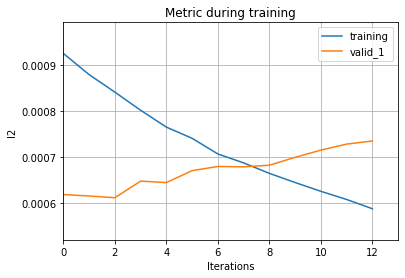

In [28]:
plot_metric(evals, 'l2')

<Axes: title={'center': 'Metric during training'}, xlabel='Iterations', ylabel='mape'>

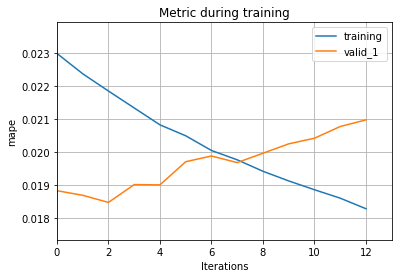

In [29]:
plot_metric(evals, 'mape')

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

<Figure size 432x288 with 0 Axes>

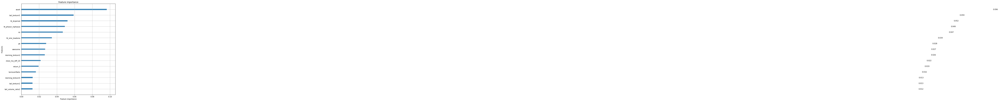

In [47]:
plt.figure(0)
lgb.plot_importance(model, max_num_features = 15,  figsize=(10, 10), importance_type = 'gain')

In [52]:
from sklearn.model_selection import TimeSeriesSplit, train_test_split
from tqdm import tqdm

In [65]:




num_days = end_day-start_day
# create a TimeSeriesSplit that predicts return for every trading day
test_fold = TimeSeriesSplit(n_splits=int(num_days/2)-1, max_train_size= 50, test_size=2)
target = 'return'
trange = np.arange(start_day, end_day) # create time range to split

importance = None
warnings.filterwarnings("ignore", category=UserWarning)
# variable to store performance stat
test_score = np.zeros(test_fold.get_n_splits(trange))
test_score_cum = np.zeros(test_fold.get_n_splits(trange))
y_true_cum = np.array([])
y_pred_cum = np.array([])
params_best_dict = {}

enable_asset = 'asset' in categorical_feature
enable_day = False



for fold, (train_day_idx, test_day_idx) in enumerate(tqdm(test_fold.split(trange), total = test_fold.get_n_splits(trange))):

    train_df = _ds[features + [target]].isel(day=train_day_idx).to_dataframe(dim_order=['day', 'asset'])
    test_df = _ds[features + [target]].isel(day=test_day_idx).to_dataframe(dim_order=['day', 'asset'])
    if enable_asset:
        train_df.reset_index(level='asset', inplace=True)
        test_df.reset_index(level='asset', inplace=True)
        # train_df['asset'] = train_df.get_level_values('asset')
        # val_df['asset'] = val_df.get_level_values('asset')
    if enable_day:
        train_df['day'] = train_df.index.get_level_values('day')
        test_df['day'] = test_df.index.get_level_values('day')
        features+=['day']
    train_X, train_y = train_df[features + (['asset'] if enable_asset else [])].copy(), train_df[target].copy()
    train_y_binary = (train_y > 0).astype(int)
    test_X, test_y = test_df[features + (['asset'] if enable_asset else [])].copy(), val_df[target].copy()
    test_y_binary = (test_y > 0).astype(int)

    X_train, X_val, y_train, y_val = train_test_split(train_X, train_y, test_size=0.33, random_state=42)

    train_data = lgb.Dataset(data=X_train, label=y_train, categorical_feature=categorical_feature, free_raw_data=False)
    val_data = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_feature, free_raw_data=False)


    lgb_space = {
        "max_depth": hp.uniformint("max_depth", 5, 15),
        "num_boost_round": hp.uniformint("num_boost_round", 5, 100),
        "learning_rate": hp.loguniform("learning_rate", -4, -1),
        "lambda_l1": hp.loguniform("lambda_l1", -3, 1),
        "lambda_l2": hp.loguniform("lambda_l2", -2, 2),
        'subsample': hp.uniform('subsample', 0.5, 1.0),
        "num_leaves": hp.uniformint("num_leaves", 10, 500),
        # "bagging_freq": hp.uniformint("bagging_freq", 1, 10),
    }

    algo = partial(tpe.suggest, n_startup_jobs=1)
    # lgb_best = fmin(fn=lightgbm_factory, space=lgb_space, algo=algo, max_evals=100, pass_expr_memo_ctrl=None)
    lgb_best = fmin(fn=lambda search_params:lightgbm_factory(search_params,train_data,val_data, X_val, y_val), space=lgb_space, algo=algo, max_evals=50, pass_expr_memo_ctrl=None, show_progressbar=False)

    params_best_dict[fold] = lgb_best #store best parameters

    num_boost_round, lgb_best = arg_aug(lgb_best, handle_int=True)
    model = lgb.train(params=lgb_best, train_set=train_data, num_boost_round=num_boost_round,
                  valid_sets=[train_data, val_data],
                  categorical_feature=categorical_feature,
                 feval=mape_lgbm, #tailor-made metric
                 callbacks=[early_stopping(50, verbose=False),record_evaluation(evals)])

    # record importance feature; if does not exist, create one.
    if importance is None:
        importance = pd.DataFrame({
            'feature_name': model.feature_name(),
            'importance_gain': model.feature_importance(importance_type='gain'),
            'importance_split': model.feature_importance(importance_type='split')
        }).set_index('feature_name')
    else:
        importance_df =pd.DataFrame({
            'feature_name': model.feature_name(),
            'importance_gain': model.feature_importance(importance_type='gain'),
            'importance_split': model.feature_importance(importance_type='split')
        }).set_index('feature_name')
        importance = (importance.add(importance_df))

    test_score[fold] = mape(test_y, model.predict(test_X, num_iteration = model.best_iteration))
    y_true_cum = np.concatenate((y_true_cum, test_y.to_numpy()))
    y_pred_cum= np.concatenate((y_pred_cum, model.predict(test_X, num_iteration = model.best_iteration)))
    test_score_cum[fold] = mape(y_true_cum, y_pred_cum)

  0%|          | 0/179 [00:00<?, ?it/s]

[1]	valid_0's mape: 0.0348796	valid_0's l2: 0.00179379	valid_0's mape: 1.02999
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0343246	valid_0's l2: 0.00174686	valid_0's mape: 0.984787
[3]	valid_0's mape: 0.032614	valid_0's l2: 0.00161607	valid_0's mape: 0.982627
[4]	valid_0's mape: 0.032614	valid_0's l2: 0.00161607	valid_0's mape: 0.982627
[5]	valid_0's mape: 0.0319763	valid_0's l2: 0.00156488	valid_0's mape: 1.00676
[6]	valid_0's mape: 0.0316966	valid_0's l2: 0.00154165	valid_0's mape: 0.976374
[7]	valid_0's mape: 0.0312406	valid_0's l2: 0.00150372	valid_0's mape: 1.00257
[8]	valid_0's mape: 0.0302678	valid_0's l2: 0.0014324	valid_0's mape: 0.955087
[9]	valid_0's mape: 0.0295069	valid_0's l2: 0.00137225	valid_0's mape: 0.918507
[10]	valid_0's mape: 0.0293195	valid_0's l2: 0.00134979	valid_0's mape: 0.931967
[11]	valid_0's mape: 0.0293195	valid_0's l2: 0.00134979	valid_0's mape: 0.931967
[12]	valid_0's mape: 0.0293982	valid_0's l2: 0.00134883	valid_0

  1%|          | 1/179 [00:02<06:40,  2.25s/it]

[1]	valid_0's mape: 0.0365631	valid_0's l2: 0.00198939	valid_0's mape: 1.11765
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0365631	valid_0's l2: 0.00198939	valid_0's mape: 1.11765
[3]	valid_0's mape: 0.0365631	valid_0's l2: 0.00198939	valid_0's mape: 1.11765
[4]	valid_0's mape: 0.0365631	valid_0's l2: 0.00198939	valid_0's mape: 1.11765
[5]	valid_0's mape: 0.0365631	valid_0's l2: 0.00198939	valid_0's mape: 1.11765
[6]	valid_0's mape: 0.0365631	valid_0's l2: 0.00198939	valid_0's mape: 1.11765
[7]	valid_0's mape: 0.0365631	valid_0's l2: 0.00198939	valid_0's mape: 1.11765
[8]	valid_0's mape: 0.0365631	valid_0's l2: 0.00198939	valid_0's mape: 1.11765
[9]	valid_0's mape: 0.0365631	valid_0's l2: 0.00198939	valid_0's mape: 1.11765
[10]	valid_0's mape: 0.0365631	valid_0's l2: 0.00198939	valid_0's mape: 1.11765
[11]	valid_0's mape: 0.0365631	valid_0's l2: 0.00198939	valid_0's mape: 1.11765
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0365631	val

  1%|          | 2/179 [00:03<05:09,  1.75s/it]

[1]	valid_0's mape: 0.0275985	valid_0's l2: 0.00156215	valid_0's mape: 2.61159
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.027506	valid_0's l2: 0.00155144	valid_0's mape: 2.6073
[3]	valid_0's mape: 0.0274206	valid_0's l2: 0.00154129	valid_0's mape: 2.60385
[4]	valid_0's mape: 0.0273343	valid_0's l2: 0.00153731	valid_0's mape: 2.55721
[5]	valid_0's mape: 0.0272496	valid_0's l2: 0.00153278	valid_0's mape: 2.51169
[6]	valid_0's mape: 0.0271756	valid_0's l2: 0.00152978	valid_0's mape: 2.4681
[7]	valid_0's mape: 0.0270986	valid_0's l2: 0.00152095	valid_0's mape: 2.40529
[8]	valid_0's mape: 0.026999	valid_0's l2: 0.00151181	valid_0's mape: 2.34557
[9]	valid_0's mape: 0.0269174	valid_0's l2: 0.00150457	valid_0's mape: 2.2843
[10]	valid_0's mape: 0.0268822	valid_0's l2: 0.00150014	valid_0's mape: 2.27817
[11]	valid_0's mape: 0.0268133	valid_0's l2: 0.00149046	valid_0's mape: 2.19639
[12]	valid_0's mape: 0.0267503	valid_0's l2: 0.00148499	valid_0's mape: 2

  2%|▏         | 3/179 [00:05<04:56,  1.69s/it]

[16]	valid_0's mape: 0.027835	valid_0's l2: 0.00154777	valid_0's mape: 3.4147
[17]	valid_0's mape: 0.0278108	valid_0's l2: 0.00154584	valid_0's mape: 3.3835
[18]	valid_0's mape: 0.0277466	valid_0's l2: 0.00154187	valid_0's mape: 3.34269
[19]	valid_0's mape: 0.02769	valid_0's l2: 0.00153851	valid_0's mape: 3.30657
[20]	valid_0's mape: 0.0276501	valid_0's l2: 0.00153627	valid_0's mape: 3.27984
[21]	valid_0's mape: 0.0276125	valid_0's l2: 0.00153418	valid_0's mape: 3.25468
[22]	valid_0's mape: 0.0275871	valid_0's l2: 0.00153278	valid_0's mape: 3.23443
[23]	valid_0's mape: 0.0274781	valid_0's l2: 0.00152599	valid_0's mape: 3.18024
[24]	valid_0's mape: 0.0273823	valid_0's l2: 0.00152033	valid_0's mape: 3.12946
[25]	valid_0's mape: 0.0272826	valid_0's l2: 0.00151459	valid_0's mape: 3.07496
[26]	valid_0's mape: 0.0272131	valid_0's l2: 0.00151071	valid_0's mape: 3.01471
[27]	valid_0's mape: 0.0271587	valid_0's l2: 0.00150762	valid_0's mape: 2.96765
[28]	valid_0's mape: 0.0270913	valid_0's l2: 

  2%|▏         | 4/179 [00:06<04:40,  1.60s/it]

[1]	valid_0's mape: 0.0272973	valid_0's l2: 0.00154535	valid_0's mape: 2.94254
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0272249	valid_0's l2: 0.00153953	valid_0's mape: 2.93008
[3]	valid_0's mape: 0.0271325	valid_0's l2: 0.00153365	valid_0's mape: 2.91592
[4]	valid_0's mape: 0.0270221	valid_0's l2: 0.00152638	valid_0's mape: 2.88819
[5]	valid_0's mape: 0.026941	valid_0's l2: 0.00152095	valid_0's mape: 2.82232
[6]	valid_0's mape: 0.026862	valid_0's l2: 0.00151544	valid_0's mape: 2.78172
[7]	valid_0's mape: 0.0268142	valid_0's l2: 0.00151149	valid_0's mape: 2.71835
[8]	valid_0's mape: 0.0266999	valid_0's l2: 0.00150581	valid_0's mape: 2.68406
[9]	valid_0's mape: 0.0266571	valid_0's l2: 0.00150286	valid_0's mape: 2.6758
[10]	valid_0's mape: 0.0265974	valid_0's l2: 0.00149724	valid_0's mape: 2.59237
[11]	valid_0's mape: 0.0265585	valid_0's l2: 0.00149482	valid_0's mape: 2.57517
[12]	valid_0's mape: 0.0264319	valid_0's l2: 0.00148795	valid_0's mape:

  3%|▎         | 5/179 [00:08<04:29,  1.55s/it]

[4]	valid_0's mape: 0.0263872	valid_0's l2: 0.00142826	valid_0's mape: 3.15545
[5]	valid_0's mape: 0.0263466	valid_0's l2: 0.00142433	valid_0's mape: 3.12047
[6]	valid_0's mape: 0.0263291	valid_0's l2: 0.00142236	valid_0's mape: 3.10903
[7]	valid_0's mape: 0.0262909	valid_0's l2: 0.00141935	valid_0's mape: 3.11582
[8]	valid_0's mape: 0.0262465	valid_0's l2: 0.00141662	valid_0's mape: 3.11679
[9]	valid_0's mape: 0.0262147	valid_0's l2: 0.0014141	valid_0's mape: 3.12625
[10]	valid_0's mape: 0.0262102	valid_0's l2: 0.00141375	valid_0's mape: 3.08888
[11]	valid_0's mape: 0.026201	valid_0's l2: 0.00141291	valid_0's mape: 3.05466
[12]	valid_0's mape: 0.0261708	valid_0's l2: 0.00141064	valid_0's mape: 3.02247
[13]	valid_0's mape: 0.0261678	valid_0's l2: 0.00141035	valid_0's mape: 3.00354
[14]	valid_0's mape: 0.0261429	valid_0's l2: 0.00140768	valid_0's mape: 3.03173
[15]	valid_0's mape: 0.0261303	valid_0's l2: 0.00140499	valid_0's mape: 3.075
[16]	valid_0's mape: 0.0261192	valid_0's l2: 0.001

  3%|▎         | 6/179 [00:10<04:55,  1.71s/it]

[1]	valid_0's mape: 0.0242351	valid_0's l2: 0.00127301	valid_0's mape: 1.65884
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0242182	valid_0's l2: 0.0012716	valid_0's mape: 1.64146
[3]	valid_0's mape: 0.0242149	valid_0's l2: 0.00127148	valid_0's mape: 1.63667
[4]	valid_0's mape: 0.0241938	valid_0's l2: 0.00126998	valid_0's mape: 1.5932
[5]	valid_0's mape: 0.0241753	valid_0's l2: 0.00126883	valid_0's mape: 1.55513
[6]	valid_0's mape: 0.0241717	valid_0's l2: 0.00126824	valid_0's mape: 1.54823
[7]	valid_0's mape: 0.024167	valid_0's l2: 0.00126696	valid_0's mape: 1.55772
[8]	valid_0's mape: 0.0241758	valid_0's l2: 0.00126621	valid_0's mape: 1.57261
[9]	valid_0's mape: 0.0241794	valid_0's l2: 0.00126434	valid_0's mape: 1.58141
[10]	valid_0's mape: 0.0241794	valid_0's l2: 0.00126434	valid_0's mape: 1.58141
[11]	valid_0's mape: 0.0241842	valid_0's l2: 0.00126369	valid_0's mape: 1.58416
[12]	valid_0's mape: 0.0241842	valid_0's l2: 0.00126344	valid_0's mape:

  4%|▍         | 7/179 [00:11<04:49,  1.68s/it]

[1]	valid_0's mape: 0.0257883	valid_0's l2: 0.00139746	valid_0's mape: 2.02096
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0257322	valid_0's l2: 0.00139308	valid_0's mape: 1.98929
[3]	valid_0's mape: 0.0256735	valid_0's l2: 0.00138907	valid_0's mape: 1.95231
[4]	valid_0's mape: 0.0256255	valid_0's l2: 0.00138528	valid_0's mape: 1.91868
[5]	valid_0's mape: 0.0255843	valid_0's l2: 0.00138207	valid_0's mape: 1.92593
[6]	valid_0's mape: 0.0255096	valid_0's l2: 0.0013757	valid_0's mape: 1.89353
[7]	valid_0's mape: 0.0254937	valid_0's l2: 0.00137416	valid_0's mape: 1.87786
[8]	valid_0's mape: 0.0254578	valid_0's l2: 0.00137171	valid_0's mape: 1.85564
[9]	valid_0's mape: 0.0253935	valid_0's l2: 0.00136602	valid_0's mape: 1.83509
[10]	valid_0's mape: 0.0253453	valid_0's l2: 0.00136106	valid_0's mape: 1.82052
[11]	valid_0's mape: 0.0253094	valid_0's l2: 0.00135929	valid_0's mape: 1.80113
[12]	valid_0's mape: 0.025304	valid_0's l2: 0.00135994	valid_0's mape

  4%|▍         | 8/179 [00:14<05:21,  1.88s/it]

[1]	valid_0's mape: 0.0257539	valid_0's l2: 0.00139432	valid_0's mape: 2.03144
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.025684	valid_0's l2: 0.00138806	valid_0's mape: 2.05819
[3]	valid_0's mape: 0.0256794	valid_0's l2: 0.00138675	valid_0's mape: 2.07304
[4]	valid_0's mape: 0.0256009	valid_0's l2: 0.00137874	valid_0's mape: 2.00503
[5]	valid_0's mape: 0.025521	valid_0's l2: 0.00136997	valid_0's mape: 1.95631
[6]	valid_0's mape: 0.0254481	valid_0's l2: 0.00136388	valid_0's mape: 1.89007
[7]	valid_0's mape: 0.0253839	valid_0's l2: 0.0013588	valid_0's mape: 1.87454
[8]	valid_0's mape: 0.0253293	valid_0's l2: 0.00135546	valid_0's mape: 1.86838
[9]	valid_0's mape: 0.0252897	valid_0's l2: 0.00135196	valid_0's mape: 1.83992
[10]	valid_0's mape: 0.0252737	valid_0's l2: 0.00135129	valid_0's mape: 1.8428
[11]	valid_0's mape: 0.0252501	valid_0's l2: 0.00134947	valid_0's mape: 1.83972
[12]	valid_0's mape: 0.0252141	valid_0's l2: 0.00134914	valid_0's mape: 

  5%|▌         | 9/179 [00:16<05:29,  1.94s/it]

[4]	valid_0's mape: 0.0272617	valid_0's l2: 0.00152298	valid_0's mape: 1.66594
[5]	valid_0's mape: 0.0272599	valid_0's l2: 0.00152229	valid_0's mape: 1.66903
[6]	valid_0's mape: 0.0272478	valid_0's l2: 0.00152011	valid_0's mape: 1.66048
[7]	valid_0's mape: 0.0272299	valid_0's l2: 0.00151827	valid_0's mape: 1.64958
[8]	valid_0's mape: 0.027229	valid_0's l2: 0.00151761	valid_0's mape: 1.64946
[9]	valid_0's mape: 0.0272191	valid_0's l2: 0.00151615	valid_0's mape: 1.64424
[10]	valid_0's mape: 0.0272011	valid_0's l2: 0.00151375	valid_0's mape: 1.63499
[11]	valid_0's mape: 0.0271882	valid_0's l2: 0.00151218	valid_0's mape: 1.62759
[12]	valid_0's mape: 0.0271792	valid_0's l2: 0.00151072	valid_0's mape: 1.62172
[13]	valid_0's mape: 0.0271561	valid_0's l2: 0.0015088	valid_0's mape: 1.61121
[14]	valid_0's mape: 0.0271478	valid_0's l2: 0.00150732	valid_0's mape: 1.60215
[15]	valid_0's mape: 0.0271377	valid_0's l2: 0.00150576	valid_0's mape: 1.59147
[16]	valid_0's mape: 0.0271287	valid_0's l2: 0.0

  6%|▌         | 10/179 [00:18<05:28,  1.94s/it]

[1]	valid_0's mape: 0.026317	valid_0's l2: 0.00140603	valid_0's mape: 1.6451
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0262101	valid_0's l2: 0.00139245	valid_0's mape: 1.66522
[3]	valid_0's mape: 0.0261092	valid_0's l2: 0.00137826	valid_0's mape: 1.67334
[4]	valid_0's mape: 0.0260944	valid_0's l2: 0.00137397	valid_0's mape: 1.69873
[5]	valid_0's mape: 0.0260807	valid_0's l2: 0.00136924	valid_0's mape: 1.68973
[6]	valid_0's mape: 0.0259655	valid_0's l2: 0.0013617	valid_0's mape: 1.67998
[7]	valid_0's mape: 0.025885	valid_0's l2: 0.00135333	valid_0's mape: 1.62783
[8]	valid_0's mape: 0.0258736	valid_0's l2: 0.00135458	valid_0's mape: 1.61662
[9]	valid_0's mape: 0.0258308	valid_0's l2: 0.00135063	valid_0's mape: 1.65682
[10]	valid_0's mape: 0.0257912	valid_0's l2: 0.001345	valid_0's mape: 1.6947
[11]	valid_0's mape: 0.025786	valid_0's l2: 0.00134274	valid_0's mape: 1.64432
[12]	valid_0's mape: 0.0258013	valid_0's l2: 0.00133929	valid_0's mape: 1.62

  6%|▌         | 11/179 [00:19<05:11,  1.85s/it]

[1]	valid_0's mape: 0.0258498	valid_0's l2: 0.00133164	valid_0's mape: 2.55376
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0255582	valid_0's l2: 0.00130802	valid_0's mape: 2.48362
[3]	valid_0's mape: 0.0253837	valid_0's l2: 0.00129136	valid_0's mape: 2.72107
[4]	valid_0's mape: 0.0253385	valid_0's l2: 0.00128657	valid_0's mape: 2.74364
[5]	valid_0's mape: 0.0251635	valid_0's l2: 0.00126904	valid_0's mape: 2.70583
[6]	valid_0's mape: 0.0249665	valid_0's l2: 0.00125922	valid_0's mape: 2.73708
[7]	valid_0's mape: 0.0250393	valid_0's l2: 0.00126128	valid_0's mape: 3.07153
[8]	valid_0's mape: 0.0251543	valid_0's l2: 0.00126696	valid_0's mape: 3.20802
[9]	valid_0's mape: 0.0251057	valid_0's l2: 0.00126524	valid_0's mape: 3.2227
[10]	valid_0's mape: 0.0250542	valid_0's l2: 0.0012624	valid_0's mape: 3.20638
[11]	valid_0's mape: 0.025037	valid_0's l2: 0.00125811	valid_0's mape: 3.31369
[12]	valid_0's mape: 0.0251352	valid_0's l2: 0.00125925	valid_0's mape:

  7%|▋         | 12/179 [00:21<04:56,  1.78s/it]

[4]	valid_0's mape: 0.0231706	valid_0's l2: 0.0011486	valid_0's mape: 1.6706
[5]	valid_0's mape: 0.0231592	valid_0's l2: 0.00114771	valid_0's mape: 1.66516
[6]	valid_0's mape: 0.0231532	valid_0's l2: 0.00114637	valid_0's mape: 1.66516
[7]	valid_0's mape: 0.0231433	valid_0's l2: 0.00114606	valid_0's mape: 1.66663
[8]	valid_0's mape: 0.0231386	valid_0's l2: 0.00114606	valid_0's mape: 1.65949
[9]	valid_0's mape: 0.0231256	valid_0's l2: 0.00114534	valid_0's mape: 1.66165
[10]	valid_0's mape: 0.0231126	valid_0's l2: 0.00114459	valid_0's mape: 1.65902
[11]	valid_0's mape: 0.0231077	valid_0's l2: 0.0011438	valid_0's mape: 1.65861
[12]	valid_0's mape: 0.023103	valid_0's l2: 0.00114306	valid_0's mape: 1.65822
[13]	valid_0's mape: 0.0230957	valid_0's l2: 0.00114248	valid_0's mape: 1.65153
[14]	valid_0's mape: 0.0230963	valid_0's l2: 0.00114216	valid_0's mape: 1.65456
[15]	valid_0's mape: 0.0230874	valid_0's l2: 0.00114158	valid_0's mape: 1.64865
[16]	valid_0's mape: 0.0230915	valid_0's l2: 0.001

  7%|▋         | 13/179 [00:23<05:05,  1.84s/it]

[1]	valid_0's mape: 0.0225914	valid_0's l2: 0.00106248	valid_0's mape: 1.93321
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0225788	valid_0's l2: 0.00106167	valid_0's mape: 1.92682
[3]	valid_0's mape: 0.0225704	valid_0's l2: 0.00106119	valid_0's mape: 1.9223
[4]	valid_0's mape: 0.0225523	valid_0's l2: 0.00105967	valid_0's mape: 1.89027
[5]	valid_0's mape: 0.0225395	valid_0's l2: 0.00105899	valid_0's mape: 1.86398
[6]	valid_0's mape: 0.0225349	valid_0's l2: 0.00105827	valid_0's mape: 1.85247
[7]	valid_0's mape: 0.0225395	valid_0's l2: 0.00105823	valid_0's mape: 1.85061
[8]	valid_0's mape: 0.0225503	valid_0's l2: 0.0010585	valid_0's mape: 1.85005
[9]	valid_0's mape: 0.0225514	valid_0's l2: 0.00105794	valid_0's mape: 1.83718
[10]	valid_0's mape: 0.022544	valid_0's l2: 0.00105773	valid_0's mape: 1.83197
[11]	valid_0's mape: 0.0225338	valid_0's l2: 0.00105741	valid_0's mape: 1.82145
[12]	valid_0's mape: 0.0225262	valid_0's l2: 0.00105723	valid_0's mape:

  8%|▊         | 14/179 [00:25<04:58,  1.81s/it]

[1]	valid_0's mape: 0.0231001	valid_0's l2: 0.00107155	valid_0's mape: 3.15899
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0229798	valid_0's l2: 0.00106555	valid_0's mape: 3.03665
[3]	valid_0's mape: 0.0228717	valid_0's l2: 0.00105989	valid_0's mape: 2.95101
[4]	valid_0's mape: 0.0227665	valid_0's l2: 0.00105445	valid_0's mape: 2.85128
[5]	valid_0's mape: 0.0226599	valid_0's l2: 0.00104837	valid_0's mape: 2.76088
[6]	valid_0's mape: 0.022551	valid_0's l2: 0.00104228	valid_0's mape: 2.66327
[7]	valid_0's mape: 0.0224792	valid_0's l2: 0.00103818	valid_0's mape: 2.59123
[8]	valid_0's mape: 0.022464	valid_0's l2: 0.00103744	valid_0's mape: 2.57874
[9]	valid_0's mape: 0.0224397	valid_0's l2: 0.00103634	valid_0's mape: 2.55549
[10]	valid_0's mape: 0.0224186	valid_0's l2: 0.00103538	valid_0's mape: 2.53486
[11]	valid_0's mape: 0.0223676	valid_0's l2: 0.00103258	valid_0's mape: 2.48891
[12]	valid_0's mape: 0.0223224	valid_0's l2: 0.00103014	valid_0's mape

  8%|▊         | 15/179 [00:26<04:46,  1.74s/it]

[2]	valid_0's mape: 0.0224067	valid_0's l2: 0.00109448	valid_0's mape: 1.47451
[3]	valid_0's mape: 0.0223677	valid_0's l2: 0.00109067	valid_0's mape: 1.44276
[4]	valid_0's mape: 0.0223428	valid_0's l2: 0.00108765	valid_0's mape: 1.50624
[5]	valid_0's mape: 0.0223061	valid_0's l2: 0.00108634	valid_0's mape: 1.4917
[6]	valid_0's mape: 0.0222657	valid_0's l2: 0.00108433	valid_0's mape: 1.51318
[7]	valid_0's mape: 0.0222474	valid_0's l2: 0.00108472	valid_0's mape: 1.52832
[8]	valid_0's mape: 0.0222339	valid_0's l2: 0.00108488	valid_0's mape: 1.53668
[9]	valid_0's mape: 0.0221965	valid_0's l2: 0.00108247	valid_0's mape: 1.5392
[10]	valid_0's mape: 0.0221554	valid_0's l2: 0.00107808	valid_0's mape: 1.58318
[11]	valid_0's mape: 0.0221062	valid_0's l2: 0.00107243	valid_0's mape: 1.63203
[12]	valid_0's mape: 0.0220861	valid_0's l2: 0.00106817	valid_0's mape: 1.66677
[13]	valid_0's mape: 0.0220436	valid_0's l2: 0.00106379	valid_0's mape: 1.68111
Early stopping, best iteration is:
[3]	valid_0's m

  9%|▉         | 16/179 [00:28<04:33,  1.68s/it]

[1]	valid_0's mape: 0.0219429	valid_0's l2: 0.00103996	valid_0's mape: 1.44835
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0219193	valid_0's l2: 0.0010395	valid_0's mape: 1.41653
[3]	valid_0's mape: 0.0219069	valid_0's l2: 0.00103561	valid_0's mape: 1.49489
[4]	valid_0's mape: 0.0218857	valid_0's l2: 0.00103254	valid_0's mape: 1.60483
[5]	valid_0's mape: 0.0218773	valid_0's l2: 0.00102763	valid_0's mape: 1.61789
[6]	valid_0's mape: 0.0218447	valid_0's l2: 0.00102654	valid_0's mape: 1.62268
[7]	valid_0's mape: 0.0218049	valid_0's l2: 0.00102367	valid_0's mape: 1.59756
[8]	valid_0's mape: 0.0217516	valid_0's l2: 0.00101979	valid_0's mape: 1.60675
[9]	valid_0's mape: 0.0217015	valid_0's l2: 0.00101134	valid_0's mape: 1.6933
[10]	valid_0's mape: 0.0216539	valid_0's l2: 0.00100955	valid_0's mape: 1.74567
[11]	valid_0's mape: 0.0216347	valid_0's l2: 0.00100927	valid_0's mape: 1.76691
[12]	valid_0's mape: 0.0215881	valid_0's l2: 0.00100787	valid_0's mape

  9%|▉         | 17/179 [00:29<04:33,  1.69s/it]

[4]	valid_0's mape: 0.0216708	valid_0's l2: 0.00102011	valid_0's mape: 2.58273
[5]	valid_0's mape: 0.0215514	valid_0's l2: 0.00100839	valid_0's mape: 2.90341
[6]	valid_0's mape: 0.021584	valid_0's l2: 0.00100696	valid_0's mape: 2.93543
[7]	valid_0's mape: 0.0214564	valid_0's l2: 0.00100426	valid_0's mape: 2.90158
[8]	valid_0's mape: 0.021447	valid_0's l2: 0.0010037	valid_0's mape: 2.92565
[9]	valid_0's mape: 0.021329	valid_0's l2: 0.000998325	valid_0's mape: 3.1224
[10]	valid_0's mape: 0.0214357	valid_0's l2: 0.000995682	valid_0's mape: 3.13937
[11]	valid_0's mape: 0.0215099	valid_0's l2: 0.00099613	valid_0's mape: 3.13668
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0215143	valid_0's l2: 0.0010031	valid_0's mape: 1.96364
[1]	valid_0's mape: 0.0215826	valid_0's l2: 0.00100468	valid_0's mape: 2.00252
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0216316	valid_0's l2: 0.00100773	valid_0's mape: 2.03782
[3]	valid_0's mape: 0.0216904	valid_0

 10%|█         | 18/179 [00:31<04:19,  1.61s/it]

[1]	valid_0's mape: 0.0224899	valid_0's l2: 0.00108037	valid_0's mape: 1.70428
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0224641	valid_0's l2: 0.00107747	valid_0's mape: 1.70297
[3]	valid_0's mape: 0.0224415	valid_0's l2: 0.00107461	valid_0's mape: 1.69985
[4]	valid_0's mape: 0.0224323	valid_0's l2: 0.00107297	valid_0's mape: 1.71116
[5]	valid_0's mape: 0.0224128	valid_0's l2: 0.00107134	valid_0's mape: 1.71903
[6]	valid_0's mape: 0.0223967	valid_0's l2: 0.00106966	valid_0's mape: 1.72083
[7]	valid_0's mape: 0.022384	valid_0's l2: 0.00106774	valid_0's mape: 1.74348
[8]	valid_0's mape: 0.0223797	valid_0's l2: 0.00106689	valid_0's mape: 1.74879
[9]	valid_0's mape: 0.0223723	valid_0's l2: 0.00106537	valid_0's mape: 1.76464
[10]	valid_0's mape: 0.0223611	valid_0's l2: 0.00106401	valid_0's mape: 1.77383
[11]	valid_0's mape: 0.0223497	valid_0's l2: 0.00106277	valid_0's mape: 1.78461
[12]	valid_0's mape: 0.0223439	valid_0's l2: 0.0010621	valid_0's mape

 11%|█         | 19/179 [00:32<04:14,  1.59s/it]

[1]	valid_0's mape: 0.0213345	valid_0's l2: 0.00100509	valid_0's mape: 1.89728
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0212705	valid_0's l2: 0.000990997	valid_0's mape: 2.03112
[3]	valid_0's mape: 0.0212675	valid_0's l2: 0.000989479	valid_0's mape: 2.18919
[4]	valid_0's mape: 0.0211463	valid_0's l2: 0.0009832	valid_0's mape: 2.30389
[5]	valid_0's mape: 0.0211017	valid_0's l2: 0.000980435	valid_0's mape: 2.46726
[6]	valid_0's mape: 0.0210331	valid_0's l2: 0.000971517	valid_0's mape: 2.5741
[7]	valid_0's mape: 0.020988	valid_0's l2: 0.000975586	valid_0's mape: 2.73195
[8]	valid_0's mape: 0.0209998	valid_0's l2: 0.000976842	valid_0's mape: 2.86204
[9]	valid_0's mape: 0.021042	valid_0's l2: 0.00098499	valid_0's mape: 2.97404
[10]	valid_0's mape: 0.0211694	valid_0's l2: 0.000991977	valid_0's mape: 3.01108
[11]	valid_0's mape: 0.0211843	valid_0's l2: 0.000989992	valid_0's mape: 3.09899
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0213345

 11%|█         | 20/179 [00:34<04:14,  1.60s/it]

[1]	valid_0's mape: 0.0213446	valid_0's l2: 0.00100374	valid_0's mape: 1.77781
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0213118	valid_0's l2: 0.000999299	valid_0's mape: 1.90736
[3]	valid_0's mape: 0.021243	valid_0's l2: 0.000995298	valid_0's mape: 1.89908
[4]	valid_0's mape: 0.021194	valid_0's l2: 0.000989957	valid_0's mape: 1.85308
[5]	valid_0's mape: 0.0211659	valid_0's l2: 0.000984372	valid_0's mape: 1.89966
[6]	valid_0's mape: 0.0210958	valid_0's l2: 0.000980042	valid_0's mape: 1.94539
[7]	valid_0's mape: 0.0210266	valid_0's l2: 0.000969644	valid_0's mape: 1.98627
[8]	valid_0's mape: 0.0209381	valid_0's l2: 0.000962234	valid_0's mape: 2.0066
Did not meet early stopping. Best iteration is:
[8]	valid_0's mape: 0.0209381	valid_0's l2: 0.000962234	valid_0's mape: 2.0066
[1]	valid_0's mape: 0.02138	valid_0's l2: 0.00100125	valid_0's mape: 1.93991
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0212693	valid_0'

 12%|█▏        | 21/179 [00:36<04:21,  1.65s/it]

[1]	valid_0's mape: 0.021742	valid_0's l2: 0.00104427	valid_0's mape: 1.71514
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.021684	valid_0's l2: 0.00103704	valid_0's mape: 1.74606
[3]	valid_0's mape: 0.0216372	valid_0's l2: 0.00102615	valid_0's mape: 1.75934
[4]	valid_0's mape: 0.0216192	valid_0's l2: 0.00102176	valid_0's mape: 1.85602
[5]	valid_0's mape: 0.0215801	valid_0's l2: 0.00101769	valid_0's mape: 1.87896
[6]	valid_0's mape: 0.0214961	valid_0's l2: 0.00101273	valid_0's mape: 1.99793
[7]	valid_0's mape: 0.0214605	valid_0's l2: 0.00100345	valid_0's mape: 2.12701
[8]	valid_0's mape: 0.0213626	valid_0's l2: 0.00100025	valid_0's mape: 2.09922
[9]	valid_0's mape: 0.0214466	valid_0's l2: 0.00100945	valid_0's mape: 2.20528
[10]	valid_0's mape: 0.0215501	valid_0's l2: 0.00101717	valid_0's mape: 2.31956
[11]	valid_0's mape: 0.0216514	valid_0's l2: 0.00102383	valid_0's mape: 2.43837
Early stopping, best iteration is:
[1]	valid_0's mape: 0.021742	valid_

 12%|█▏        | 22/179 [00:37<04:18,  1.64s/it]

[1]	valid_0's mape: 0.0218878	valid_0's l2: 0.00105534	valid_0's mape: 1.7988
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0218778	valid_0's l2: 0.00105528	valid_0's mape: 1.76677
[3]	valid_0's mape: 0.0218701	valid_0's l2: 0.00105509	valid_0's mape: 1.73958
[4]	valid_0's mape: 0.0218782	valid_0's l2: 0.00105407	valid_0's mape: 1.76997
[5]	valid_0's mape: 0.0218845	valid_0's l2: 0.00105312	valid_0's mape: 1.79638
[6]	valid_0's mape: 0.0218937	valid_0's l2: 0.00105251	valid_0's mape: 1.81981
[7]	valid_0's mape: 0.0218976	valid_0's l2: 0.00105234	valid_0's mape: 1.82634
[8]	valid_0's mape: 0.0218976	valid_0's l2: 0.00105234	valid_0's mape: 1.82634
[9]	valid_0's mape: 0.0219012	valid_0's l2: 0.00105221	valid_0's mape: 1.83198
[10]	valid_0's mape: 0.0219042	valid_0's l2: 0.0010521	valid_0's mape: 1.83683
[11]	valid_0's mape: 0.0219271	valid_0's l2: 0.00105278	valid_0's mape: 1.85482
[12]	valid_0's mape: 0.0219423	valid_0's l2: 0.00105331	valid_0's mape

 13%|█▎        | 23/179 [00:39<04:29,  1.73s/it]

[1]	valid_0's mape: 0.0225674	valid_0's l2: 0.00115378	valid_0's mape: 1.57526
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0225476	valid_0's l2: 0.00115165	valid_0's mape: 1.58299
[3]	valid_0's mape: 0.0225288	valid_0's l2: 0.00114938	valid_0's mape: 1.58893
[4]	valid_0's mape: 0.0225096	valid_0's l2: 0.00114735	valid_0's mape: 1.58933
[5]	valid_0's mape: 0.0224898	valid_0's l2: 0.00114517	valid_0's mape: 1.59285
[6]	valid_0's mape: 0.0224816	valid_0's l2: 0.00114383	valid_0's mape: 1.5972
[7]	valid_0's mape: 0.0224721	valid_0's l2: 0.00114203	valid_0's mape: 1.60899
[8]	valid_0's mape: 0.0224684	valid_0's l2: 0.00114163	valid_0's mape: 1.60351
[9]	valid_0's mape: 0.0224539	valid_0's l2: 0.00114004	valid_0's mape: 1.61203
[10]	valid_0's mape: 0.0224435	valid_0's l2: 0.0011378	valid_0's mape: 1.61661
[11]	valid_0's mape: 0.0224252	valid_0's l2: 0.00113519	valid_0's mape: 1.61681
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0225674	valid

 13%|█▎        | 24/179 [00:41<04:21,  1.68s/it]

[1]	valid_0's mape: 0.0212188	valid_0's l2: 0.00099121	valid_0's mape: 1.5351
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0212015	valid_0's l2: 0.000987384	valid_0's mape: 1.57986
[3]	valid_0's mape: 0.0211607	valid_0's l2: 0.00098104	valid_0's mape: 1.60832
[4]	valid_0's mape: 0.0211578	valid_0's l2: 0.000980679	valid_0's mape: 1.6417
[5]	valid_0's mape: 0.0211481	valid_0's l2: 0.000980339	valid_0's mape: 1.69042
[6]	valid_0's mape: 0.02115	valid_0's l2: 0.000978691	valid_0's mape: 1.70646
[7]	valid_0's mape: 0.021139	valid_0's l2: 0.000977402	valid_0's mape: 1.7194
[8]	valid_0's mape: 0.021133	valid_0's l2: 0.000975431	valid_0's mape: 1.76021
[9]	valid_0's mape: 0.0211373	valid_0's l2: 0.000976893	valid_0's mape: 1.7896
[10]	valid_0's mape: 0.0211111	valid_0's l2: 0.000972777	valid_0's mape: 1.82162
[11]	valid_0's mape: 0.021098	valid_0's l2: 0.000971578	valid_0's mape: 1.87679
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0212188	val

 14%|█▍        | 25/179 [00:43<04:23,  1.71s/it]

[1]	valid_0's mape: 0.0212514	valid_0's l2: 0.000998631	valid_0's mape: 1.48934
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0212472	valid_0's l2: 0.000998346	valid_0's mape: 1.48455
[3]	valid_0's mape: 0.0212425	valid_0's l2: 0.000997814	valid_0's mape: 1.48581
[4]	valid_0's mape: 0.0212504	valid_0's l2: 0.000997848	valid_0's mape: 1.46766
[5]	valid_0's mape: 0.0212598	valid_0's l2: 0.000998066	valid_0's mape: 1.45638
[6]	valid_0's mape: 0.0212667	valid_0's l2: 0.00099853	valid_0's mape: 1.45814
[7]	valid_0's mape: 0.0212595	valid_0's l2: 0.000997814	valid_0's mape: 1.44924
[8]	valid_0's mape: 0.0212594	valid_0's l2: 0.000997633	valid_0's mape: 1.45251
[9]	valid_0's mape: 0.0212522	valid_0's l2: 0.00099678	valid_0's mape: 1.44092
[10]	valid_0's mape: 0.0212365	valid_0's l2: 0.000995493	valid_0's mape: 1.46354
[11]	valid_0's mape: 0.0212295	valid_0's l2: 0.000995081	valid_0's mape: 1.4664
[12]	valid_0's mape: 0.0212139	valid_0's l2: 0.000993862	val

 15%|█▍        | 26/179 [00:45<04:25,  1.74s/it]

[1]	valid_0's mape: 0.0195295	valid_0's l2: 0.000792765	valid_0's mape: 1.63517
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0195112	valid_0's l2: 0.000791016	valid_0's mape: 1.62787
[3]	valid_0's mape: 0.0195031	valid_0's l2: 0.000790559	valid_0's mape: 1.62464
[4]	valid_0's mape: 0.0194805	valid_0's l2: 0.00078827	valid_0's mape: 1.63743
[5]	valid_0's mape: 0.0194508	valid_0's l2: 0.000785993	valid_0's mape: 1.65229
[6]	valid_0's mape: 0.0194398	valid_0's l2: 0.000784778	valid_0's mape: 1.64938
[7]	valid_0's mape: 0.019423	valid_0's l2: 0.000784213	valid_0's mape: 1.6282
[8]	valid_0's mape: 0.0194144	valid_0's l2: 0.00078323	valid_0's mape: 1.62885
[9]	valid_0's mape: 0.0194022	valid_0's l2: 0.000782603	valid_0's mape: 1.63107
[10]	valid_0's mape: 0.0193789	valid_0's l2: 0.000781378	valid_0's mape: 1.626
[11]	valid_0's mape: 0.0193562	valid_0's l2: 0.000779209	valid_0's mape: 1.61889
[12]	valid_0's mape: 0.0193403	valid_0's l2: 0.00077769	valid_0

 15%|█▌        | 27/179 [00:46<04:21,  1.72s/it]

[8]	valid_0's mape: 0.0206751	valid_0's l2: 0.000925308	valid_0's mape: 1.64704
[9]	valid_0's mape: 0.0206666	valid_0's l2: 0.000924566	valid_0's mape: 1.65414
[10]	valid_0's mape: 0.0206647	valid_0's l2: 0.000924079	valid_0's mape: 1.65846
[11]	valid_0's mape: 0.0206654	valid_0's l2: 0.000923891	valid_0's mape: 1.66048
[12]	valid_0's mape: 0.0206726	valid_0's l2: 0.000924265	valid_0's mape: 1.66685
Early stopping, best iteration is:
[2]	valid_0's mape: 0.0207273	valid_0's l2: 0.000928239	valid_0's mape: 1.61666
[1]	valid_0's mape: 0.0206972	valid_0's l2: 0.000926785	valid_0's mape: 1.63648
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.020665	valid_0's l2: 0.000924082	valid_0's mape: 1.6417
[3]	valid_0's mape: 0.0206042	valid_0's l2: 0.000922863	valid_0's mape: 1.62698
[4]	valid_0's mape: 0.0205837	valid_0's l2: 0.00092086	valid_0's mape: 1.69799
[5]	valid_0's mape: 0.0205584	valid_0's l2: 0.000918891	valid_0's mape: 1.76706
[6]	valid_0's mape: 0.02

 16%|█▌        | 28/179 [00:48<04:26,  1.76s/it]

[1]	valid_0's mape: 0.0195363	valid_0's l2: 0.000842837	valid_0's mape: 2.09893
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0195332	valid_0's l2: 0.000842688	valid_0's mape: 2.11529
[3]	valid_0's mape: 0.0195342	valid_0's l2: 0.000842634	valid_0's mape: 2.13976
[4]	valid_0's mape: 0.0195322	valid_0's l2: 0.000842649	valid_0's mape: 2.13103
[5]	valid_0's mape: 0.0195282	valid_0's l2: 0.000842555	valid_0's mape: 2.11839
[6]	valid_0's mape: 0.019523	valid_0's l2: 0.000842367	valid_0's mape: 2.10567
[7]	valid_0's mape: 0.0195231	valid_0's l2: 0.000842514	valid_0's mape: 2.10471
[8]	valid_0's mape: 0.0195231	valid_0's l2: 0.000842514	valid_0's mape: 2.10471
[9]	valid_0's mape: 0.0195241	valid_0's l2: 0.000842615	valid_0's mape: 2.104
[10]	valid_0's mape: 0.0195259	valid_0's l2: 0.000842725	valid_0's mape: 2.10364
[11]	valid_0's mape: 0.0195256	valid_0's l2: 0.000842953	valid_0's mape: 2.08745
[12]	valid_0's mape: 0.0195261	valid_0's l2: 0.00084323	vali

 16%|█▌        | 29/179 [00:50<04:41,  1.88s/it]

[19]	valid_0's mape: 0.0194286	valid_0's l2: 0.000724472	valid_0's mape: 1.88314
Early stopping, best iteration is:
[9]	valid_0's mape: 0.0195412	valid_0's l2: 0.000731988	valid_0's mape: 1.84524
[1]	valid_0's mape: 0.0197173	valid_0's l2: 0.000744377	valid_0's mape: 1.98476
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0196735	valid_0's l2: 0.000741075	valid_0's mape: 1.95667
[3]	valid_0's mape: 0.0196392	valid_0's l2: 0.000738946	valid_0's mape: 1.92128
[4]	valid_0's mape: 0.019597	valid_0's l2: 0.000736873	valid_0's mape: 1.9154
[5]	valid_0's mape: 0.0195672	valid_0's l2: 0.000734971	valid_0's mape: 1.87535
[6]	valid_0's mape: 0.0195373	valid_0's l2: 0.00073322	valid_0's mape: 1.83257
[7]	valid_0's mape: 0.0195053	valid_0's l2: 0.000731713	valid_0's mape: 1.81581
[8]	valid_0's mape: 0.0195285	valid_0's l2: 0.000732748	valid_0's mape: 1.82734
[9]	valid_0's mape: 0.0195046	valid_0's l2: 0.000731157	valid_0's mape: 1.81709
[10]	valid_0's mape: 0.019

 17%|█▋        | 30/179 [00:52<04:36,  1.86s/it]

[1]	valid_0's mape: 0.0197462	valid_0's l2: 0.0007581	valid_0's mape: 1.34067
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0197216	valid_0's l2: 0.000758766	valid_0's mape: 1.30023
[3]	valid_0's mape: 0.0197428	valid_0's l2: 0.000759146	valid_0's mape: 1.37249
[4]	valid_0's mape: 0.0197537	valid_0's l2: 0.000759512	valid_0's mape: 1.39946
[5]	valid_0's mape: 0.0197501	valid_0's l2: 0.000760267	valid_0's mape: 1.42311
[6]	valid_0's mape: 0.0197753	valid_0's l2: 0.000762379	valid_0's mape: 1.45102
[7]	valid_0's mape: 0.019836	valid_0's l2: 0.00076589	valid_0's mape: 1.51772
[8]	valid_0's mape: 0.0198362	valid_0's l2: 0.000765672	valid_0's mape: 1.52393
[9]	valid_0's mape: 0.01987	valid_0's l2: 0.000768672	valid_0's mape: 1.57021
[10]	valid_0's mape: 0.0198942	valid_0's l2: 0.000769428	valid_0's mape: 1.58664
[11]	valid_0's mape: 0.0199112	valid_0's l2: 0.000770443	valid_0's mape: 1.5921
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0197462

 17%|█▋        | 31/179 [00:56<06:15,  2.54s/it]

[14]	valid_0's mape: 0.0195921	valid_0's l2: 0.000747652	valid_0's mape: 1.39043
Early stopping, best iteration is:
[4]	valid_0's mape: 0.0196521	valid_0's l2: 0.000753969	valid_0's mape: 1.28404
[1]	valid_0's mape: 0.0197619	valid_0's l2: 0.000761328	valid_0's mape: 1.3236
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0197627	valid_0's l2: 0.000761741	valid_0's mape: 1.33437
[3]	valid_0's mape: 0.0197606	valid_0's l2: 0.000761712	valid_0's mape: 1.32789
[4]	valid_0's mape: 0.0197515	valid_0's l2: 0.000761373	valid_0's mape: 1.30747
[5]	valid_0's mape: 0.0197417	valid_0's l2: 0.000761483	valid_0's mape: 1.28397
[6]	valid_0's mape: 0.0197401	valid_0's l2: 0.000761788	valid_0's mape: 1.26736
[7]	valid_0's mape: 0.0197474	valid_0's l2: 0.00076236	valid_0's mape: 1.28493
[8]	valid_0's mape: 0.0197411	valid_0's l2: 0.00076201	valid_0's mape: 1.29062
[9]	valid_0's mape: 0.0197445	valid_0's l2: 0.000762298	valid_0's mape: 1.30247
[10]	valid_0's mape: 0.019

 18%|█▊        | 32/179 [00:58<06:01,  2.46s/it]

[19]	valid_0's mape: 0.0190801	valid_0's l2: 0.000736661	valid_0's mape: 1.705
[20]	valid_0's mape: 0.0190637	valid_0's l2: 0.000735319	valid_0's mape: 1.70003
[21]	valid_0's mape: 0.0190542	valid_0's l2: 0.00073515	valid_0's mape: 1.69776
[22]	valid_0's mape: 0.019066	valid_0's l2: 0.000736257	valid_0's mape: 1.70378
Early stopping, best iteration is:
[12]	valid_0's mape: 0.0191325	valid_0's l2: 0.000743291	valid_0's mape: 1.60942
[1]	valid_0's mape: 0.0195086	valid_0's l2: 0.000732462	valid_0's mape: 1.5882
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.019539	valid_0's l2: 0.000734712	valid_0's mape: 1.63314
[3]	valid_0's mape: 0.0195492	valid_0's l2: 0.000734677	valid_0's mape: 1.66702
[4]	valid_0's mape: 0.0195151	valid_0's l2: 0.000735829	valid_0's mape: 1.73574
[5]	valid_0's mape: 0.0194755	valid_0's l2: 0.000732815	valid_0's mape: 1.86041
[6]	valid_0's mape: 0.0194272	valid_0's l2: 0.000730726	valid_0's mape: 1.98058
[7]	valid_0's mape: 0.019

 18%|█▊        | 33/179 [01:01<05:53,  2.42s/it]

[1]	valid_0's mape: 0.0194704	valid_0's l2: 0.000730865	valid_0's mape: 1.4961
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0194634	valid_0's l2: 0.000730506	valid_0's mape: 1.49892
[3]	valid_0's mape: 0.0194541	valid_0's l2: 0.00073	valid_0's mape: 1.51457
[4]	valid_0's mape: 0.0194427	valid_0's l2: 0.00072957	valid_0's mape: 1.49759
[5]	valid_0's mape: 0.0194354	valid_0's l2: 0.000728651	valid_0's mape: 1.50697
[6]	valid_0's mape: 0.0194271	valid_0's l2: 0.000727696	valid_0's mape: 1.51739
[7]	valid_0's mape: 0.0194142	valid_0's l2: 0.000725999	valid_0's mape: 1.52967
[8]	valid_0's mape: 0.0194082	valid_0's l2: 0.000725078	valid_0's mape: 1.54341
[9]	valid_0's mape: 0.0193941	valid_0's l2: 0.0007232	valid_0's mape: 1.55444
[10]	valid_0's mape: 0.0193914	valid_0's l2: 0.000722883	valid_0's mape: 1.55387
[11]	valid_0's mape: 0.0193756	valid_0's l2: 0.000722395	valid_0's mape: 1.54225
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0194704	

 19%|█▉        | 34/179 [01:03<05:37,  2.33s/it]

[13]	valid_0's mape: 0.018867	valid_0's l2: 0.000736952	valid_0's mape: 1.48613
Early stopping, best iteration is:
[3]	valid_0's mape: 0.0190989	valid_0's l2: 0.000757855	valid_0's mape: 1.26095
[1]	valid_0's mape: 0.0192393	valid_0's l2: 0.000765281	valid_0's mape: 1.31459
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0192287	valid_0's l2: 0.000764447	valid_0's mape: 1.32157
[3]	valid_0's mape: 0.0192222	valid_0's l2: 0.000763884	valid_0's mape: 1.32726
[4]	valid_0's mape: 0.0192222	valid_0's l2: 0.000763884	valid_0's mape: 1.32726
[5]	valid_0's mape: 0.019216	valid_0's l2: 0.000763627	valid_0's mape: 1.30917
[6]	valid_0's mape: 0.0192107	valid_0's l2: 0.000763461	valid_0's mape: 1.29365
[7]	valid_0's mape: 0.0192069	valid_0's l2: 0.000763348	valid_0's mape: 1.28172
[8]	valid_0's mape: 0.019202	valid_0's l2: 0.000762806	valid_0's mape: 1.29238
[9]	valid_0's mape: 0.0191984	valid_0's l2: 0.000762412	valid_0's mape: 1.29795
[10]	valid_0's mape: 0.019

 20%|█▉        | 35/179 [01:05<05:29,  2.29s/it]

[1]	valid_0's mape: 0.0194376	valid_0's l2: 0.00074449	valid_0's mape: 1.48116
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0193836	valid_0's l2: 0.000741606	valid_0's mape: 1.52114
[3]	valid_0's mape: 0.0193097	valid_0's l2: 0.000735428	valid_0's mape: 1.54014
[4]	valid_0's mape: 0.0192468	valid_0's l2: 0.000732372	valid_0's mape: 1.56936
[5]	valid_0's mape: 0.0192238	valid_0's l2: 0.000732865	valid_0's mape: 1.6172
[6]	valid_0's mape: 0.0192275	valid_0's l2: 0.000733988	valid_0's mape: 1.64293
[7]	valid_0's mape: 0.0192049	valid_0's l2: 0.000731571	valid_0's mape: 1.6654
[8]	valid_0's mape: 0.0192237	valid_0's l2: 0.000733231	valid_0's mape: 1.68003
[9]	valid_0's mape: 0.0192446	valid_0's l2: 0.000732948	valid_0's mape: 1.71901
[10]	valid_0's mape: 0.0192656	valid_0's l2: 0.000735172	valid_0's mape: 1.73869
[11]	valid_0's mape: 0.0192645	valid_0's l2: 0.000733614	valid_0's mape: 1.76905
Early stopping, best iteration is:
[1]	valid_0's mape: 0.019

 20%|██        | 36/179 [01:07<05:10,  2.17s/it]

[1]	valid_0's mape: 0.0192772	valid_0's l2: 0.000737679	valid_0's mape: 1.41942
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.019202	valid_0's l2: 0.000733878	valid_0's mape: 1.49227
[3]	valid_0's mape: 0.0191527	valid_0's l2: 0.000730561	valid_0's mape: 1.5364
[4]	valid_0's mape: 0.0190505	valid_0's l2: 0.000726191	valid_0's mape: 1.58124
[5]	valid_0's mape: 0.0189758	valid_0's l2: 0.00072397	valid_0's mape: 1.6524
[6]	valid_0's mape: 0.0189708	valid_0's l2: 0.00072124	valid_0's mape: 1.72121
[7]	valid_0's mape: 0.0190489	valid_0's l2: 0.000722551	valid_0's mape: 1.82298
[8]	valid_0's mape: 0.0190997	valid_0's l2: 0.000726597	valid_0's mape: 1.81691
[9]	valid_0's mape: 0.0191404	valid_0's l2: 0.000725845	valid_0's mape: 1.88531
[10]	valid_0's mape: 0.0191517	valid_0's l2: 0.000724524	valid_0's mape: 1.93004
[11]	valid_0's mape: 0.0190641	valid_0's l2: 0.000724369	valid_0's mape: 1.97062
Early stopping, best iteration is:
[1]	valid_0's mape: 0.01927

 21%|██        | 37/179 [01:09<04:52,  2.06s/it]

[1]	valid_0's mape: 0.0192925	valid_0's l2: 0.00073847	valid_0's mape: 1.37254
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0192931	valid_0's l2: 0.000738448	valid_0's mape: 1.37402
[3]	valid_0's mape: 0.0192938	valid_0's l2: 0.000738432	valid_0's mape: 1.37551
[4]	valid_0's mape: 0.0192938	valid_0's l2: 0.000738432	valid_0's mape: 1.37551
[5]	valid_0's mape: 0.0192937	valid_0's l2: 0.000738411	valid_0's mape: 1.37687
[6]	valid_0's mape: 0.0192937	valid_0's l2: 0.000738392	valid_0's mape: 1.3782
[7]	valid_0's mape: 0.0192936	valid_0's l2: 0.000738374	valid_0's mape: 1.3795
[8]	valid_0's mape: 0.0192929	valid_0's l2: 0.000738333	valid_0's mape: 1.37565
[9]	valid_0's mape: 0.0192924	valid_0's l2: 0.000738295	valid_0's mape: 1.37192
[10]	valid_0's mape: 0.019292	valid_0's l2: 0.000738259	valid_0's mape: 1.36837
[11]	valid_0's mape: 0.01929	valid_0's l2: 0.000738176	valid_0's mape: 1.36596
[12]	valid_0's mape: 0.0192881	valid_0's l2: 0.000738096	valid_

 21%|██        | 38/179 [01:11<05:02,  2.14s/it]

[1]	valid_0's mape: 0.0199318	valid_0's l2: 0.000791795	valid_0's mape: 1.58869
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0199618	valid_0's l2: 0.000789149	valid_0's mape: 1.79548
[3]	valid_0's mape: 0.0199049	valid_0's l2: 0.000788567	valid_0's mape: 1.9036
[4]	valid_0's mape: 0.0199661	valid_0's l2: 0.000793404	valid_0's mape: 1.90949
[5]	valid_0's mape: 0.0199964	valid_0's l2: 0.000794634	valid_0's mape: 2.02044
[6]	valid_0's mape: 0.0200278	valid_0's l2: 0.000798301	valid_0's mape: 2.06684
[7]	valid_0's mape: 0.0200522	valid_0's l2: 0.000799259	valid_0's mape: 2.14724
[8]	valid_0's mape: 0.0201551	valid_0's l2: 0.000802233	valid_0's mape: 2.13207
[9]	valid_0's mape: 0.0202542	valid_0's l2: 0.000804484	valid_0's mape: 2.19958
[10]	valid_0's mape: 0.0202281	valid_0's l2: 0.000801587	valid_0's mape: 2.2322
[11]	valid_0's mape: 0.0202129	valid_0's l2: 0.000800306	valid_0's mape: 2.39209
Early stopping, best iteration is:
[1]	valid_0's mape: 0.01

 22%|██▏       | 39/179 [01:14<05:13,  2.24s/it]

[1]	valid_0's mape: 0.0199439	valid_0's l2: 0.00079157	valid_0's mape: 1.47424
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0199394	valid_0's l2: 0.000790606	valid_0's mape: 1.46521
[3]	valid_0's mape: 0.0199349	valid_0's l2: 0.000789857	valid_0's mape: 1.46087
[4]	valid_0's mape: 0.0199277	valid_0's l2: 0.000789348	valid_0's mape: 1.46401
[5]	valid_0's mape: 0.0199228	valid_0's l2: 0.000788505	valid_0's mape: 1.45771
[6]	valid_0's mape: 0.0199167	valid_0's l2: 0.000788112	valid_0's mape: 1.45613
[7]	valid_0's mape: 0.0199172	valid_0's l2: 0.000787786	valid_0's mape: 1.45796
[8]	valid_0's mape: 0.0199131	valid_0's l2: 0.000787393	valid_0's mape: 1.46905
[9]	valid_0's mape: 0.0199183	valid_0's l2: 0.000787396	valid_0's mape: 1.48137
[10]	valid_0's mape: 0.0199051	valid_0's l2: 0.000786331	valid_0's mape: 1.49501
[11]	valid_0's mape: 0.019903	valid_0's l2: 0.000785821	valid_0's mape: 1.507
[12]	valid_0's mape: 0.0199042	valid_0's l2: 0.000785838	vali

 22%|██▏       | 40/179 [01:16<05:02,  2.17s/it]

[7]	valid_0's mape: 0.0194701	valid_0's l2: 0.000672532	valid_0's mape: 1.4182
[8]	valid_0's mape: 0.019465	valid_0's l2: 0.000671679	valid_0's mape: 1.45772
[9]	valid_0's mape: 0.0194684	valid_0's l2: 0.000671441	valid_0's mape: 1.48908
[10]	valid_0's mape: 0.0194717	valid_0's l2: 0.000671366	valid_0's mape: 1.51287
[11]	valid_0's mape: 0.0194753	valid_0's l2: 0.000671448	valid_0's mape: 1.50287
[12]	valid_0's mape: 0.0194766	valid_0's l2: 0.000671515	valid_0's mape: 1.49413
[13]	valid_0's mape: 0.0194788	valid_0's l2: 0.000671582	valid_0's mape: 1.48855
Early stopping, best iteration is:
[3]	valid_0's mape: 0.0194685	valid_0's l2: 0.000673548	valid_0's mape: 1.3397
[1]	valid_0's mape: 0.0203363	valid_0's l2: 0.000758719	valid_0's mape: 1.49421
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0203021	valid_0's l2: 0.000756357	valid_0's mape: 1.47508
[3]	valid_0's mape: 0.0202736	valid_0's l2: 0.000754243	valid_0's mape: 1.45685
[4]	valid_0's mape: 0.0

 23%|██▎       | 41/179 [01:18<05:00,  2.18s/it]

[9]	valid_0's mape: 0.0202199	valid_0's l2: 0.000726786	valid_0's mape: 2.45515
[10]	valid_0's mape: 0.0202374	valid_0's l2: 0.000727293	valid_0's mape: 2.55428
[11]	valid_0's mape: 0.0202297	valid_0's l2: 0.000728577	valid_0's mape: 2.55988
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0203012	valid_0's l2: 0.000750214	valid_0's mape: 1.45295
[1]	valid_0's mape: 0.020357	valid_0's l2: 0.000760233	valid_0's mape: 1.49464
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0203425	valid_0's l2: 0.000759078	valid_0's mape: 1.48879
[3]	valid_0's mape: 0.0203313	valid_0's l2: 0.000758392	valid_0's mape: 1.47708
[4]	valid_0's mape: 0.0203293	valid_0's l2: 0.000757976	valid_0's mape: 1.46347
[5]	valid_0's mape: 0.0203151	valid_0's l2: 0.000756945	valid_0's mape: 1.44678
[6]	valid_0's mape: 0.0203011	valid_0's l2: 0.000755993	valid_0's mape: 1.44082
[7]	valid_0's mape: 0.0202922	valid_0's l2: 0.000755063	valid_0's mape: 1.44038
[8]	valid_0's mape: 0.0

 23%|██▎       | 42/179 [01:20<05:00,  2.19s/it]

[1]	valid_0's mape: 0.0215774	valid_0's l2: 0.00082928	valid_0's mape: 1.39224
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0215581	valid_0's l2: 0.00082818	valid_0's mape: 1.37737
[3]	valid_0's mape: 0.0215386	valid_0's l2: 0.00082726	valid_0's mape: 1.36432
[4]	valid_0's mape: 0.0215368	valid_0's l2: 0.000826969	valid_0's mape: 1.37
[5]	valid_0's mape: 0.0215217	valid_0's l2: 0.000825807	valid_0's mape: 1.35537
[6]	valid_0's mape: 0.021504	valid_0's l2: 0.000824733	valid_0's mape: 1.34192
[7]	valid_0's mape: 0.0214913	valid_0's l2: 0.000823837	valid_0's mape: 1.33026
[8]	valid_0's mape: 0.0214824	valid_0's l2: 0.000823249	valid_0's mape: 1.32068
[9]	valid_0's mape: 0.0214724	valid_0's l2: 0.000822568	valid_0's mape: 1.31225
[10]	valid_0's mape: 0.0214613	valid_0's l2: 0.000821605	valid_0's mape: 1.30375
[11]	valid_0's mape: 0.0214474	valid_0's l2: 0.000820689	valid_0's mape: 1.29508
[12]	valid_0's mape: 0.0214315	valid_0's l2: 0.000819663	valid_0

 24%|██▍       | 43/179 [01:22<05:05,  2.25s/it]

[1]	valid_0's mape: 0.0219514	valid_0's l2: 0.000899112	valid_0's mape: 1.14421
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0218081	valid_0's l2: 0.00089015	valid_0's mape: 1.26234
[3]	valid_0's mape: 0.0217663	valid_0's l2: 0.000886097	valid_0's mape: 1.37861
[4]	valid_0's mape: 0.021685	valid_0's l2: 0.000882442	valid_0's mape: 1.42731
[5]	valid_0's mape: 0.021654	valid_0's l2: 0.000879644	valid_0's mape: 1.4573
[6]	valid_0's mape: 0.0215683	valid_0's l2: 0.00087452	valid_0's mape: 1.54027
[7]	valid_0's mape: 0.0215375	valid_0's l2: 0.000871933	valid_0's mape: 1.63141
[8]	valid_0's mape: 0.0215305	valid_0's l2: 0.000869593	valid_0's mape: 1.68597
[9]	valid_0's mape: 0.0214822	valid_0's l2: 0.000864423	valid_0's mape: 1.77343
[10]	valid_0's mape: 0.0214317	valid_0's l2: 0.000861658	valid_0's mape: 1.84572
[11]	valid_0's mape: 0.0214001	valid_0's l2: 0.000860875	valid_0's mape: 1.93532
Early stopping, best iteration is:
[1]	valid_0's mape: 0.02195

 25%|██▍       | 44/179 [01:25<05:01,  2.23s/it]

[5]	valid_0's mape: 0.0219494	valid_0's l2: 0.000901102	valid_0's mape: 1.09238
[6]	valid_0's mape: 0.0219216	valid_0's l2: 0.000899642	valid_0's mape: 1.113
[7]	valid_0's mape: 0.0218968	valid_0's l2: 0.000898211	valid_0's mape: 1.12717
[8]	valid_0's mape: 0.0218818	valid_0's l2: 0.000897273	valid_0's mape: 1.13674
[9]	valid_0's mape: 0.0218729	valid_0's l2: 0.00089621	valid_0's mape: 1.15431
[10]	valid_0's mape: 0.0218679	valid_0's l2: 0.00089604	valid_0's mape: 1.16694
[11]	valid_0's mape: 0.0218539	valid_0's l2: 0.000895415	valid_0's mape: 1.18377
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0220377	valid_0's l2: 0.00090737	valid_0's mape: 1.03338
[1]	valid_0's mape: 0.0216627	valid_0's l2: 0.000823635	valid_0's mape: 1.14393
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0216365	valid_0's l2: 0.000821659	valid_0's mape: 1.13895
[3]	valid_0's mape: 0.0216134	valid_0's l2: 0.00081997	valid_0's mape: 1.13548
[4]	valid_0's mape: 0.021587

 25%|██▌       | 45/179 [01:27<05:13,  2.34s/it]

[7]	valid_0's mape: 0.0215089	valid_0's l2: 0.000812024	valid_0's mape: 1.15653
[8]	valid_0's mape: 0.0214765	valid_0's l2: 0.00080971	valid_0's mape: 1.16034
[9]	valid_0's mape: 0.0214399	valid_0's l2: 0.000807817	valid_0's mape: 1.17686
[10]	valid_0's mape: 0.0214225	valid_0's l2: 0.000806831	valid_0's mape: 1.19148
[11]	valid_0's mape: 0.0214164	valid_0's l2: 0.000806269	valid_0's mape: 1.19701
[12]	valid_0's mape: 0.0214183	valid_0's l2: 0.00080588	valid_0's mape: 1.22489
[13]	valid_0's mape: 0.0214088	valid_0's l2: 0.000804321	valid_0's mape: 1.25437
Early stopping, best iteration is:
[3]	valid_0's mape: 0.0216026	valid_0's l2: 0.0008187	valid_0's mape: 1.13897
[1]	valid_0's mape: 0.0230988	valid_0's l2: 0.000939559	valid_0's mape: 1.11644
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0230538	valid_0's l2: 0.000936165	valid_0's mape: 1.17221
[3]	valid_0's mape: 0.023034	valid_0's l2: 0.000934622	valid_0's mape: 1.21353
[4]	valid_0's mape: 0.023

 26%|██▌       | 46/179 [01:30<05:30,  2.48s/it]

[1]	valid_0's mape: 0.023036	valid_0's l2: 0.000934463	valid_0's mape: 1.1888
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0229043	valid_0's l2: 0.000923347	valid_0's mape: 1.35075
[3]	valid_0's mape: 0.0227774	valid_0's l2: 0.000916316	valid_0's mape: 1.42449
[4]	valid_0's mape: 0.0227154	valid_0's l2: 0.00090792	valid_0's mape: 1.55441
[5]	valid_0's mape: 0.022669	valid_0's l2: 0.000902223	valid_0's mape: 1.63782
[6]	valid_0's mape: 0.022643	valid_0's l2: 0.00089823	valid_0's mape: 1.76358
[7]	valid_0's mape: 0.0225936	valid_0's l2: 0.000895064	valid_0's mape: 1.85062
[8]	valid_0's mape: 0.0226037	valid_0's l2: 0.000893535	valid_0's mape: 1.95223
[9]	valid_0's mape: 0.0226528	valid_0's l2: 0.000895168	valid_0's mape: 2.04539
[10]	valid_0's mape: 0.0226007	valid_0's l2: 0.000888104	valid_0's mape: 2.11806
[11]	valid_0's mape: 0.0225566	valid_0's l2: 0.000882674	valid_0's mape: 2.19308
Early stopping, best iteration is:
[1]	valid_0's mape: 0.023036

 26%|██▋       | 47/179 [01:33<05:30,  2.50s/it]

[1]	valid_0's mape: 0.0228617	valid_0's l2: 0.000966706	valid_0's mape: 1.16649
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0228542	valid_0's l2: 0.000965858	valid_0's mape: 1.16228
[3]	valid_0's mape: 0.0228503	valid_0's l2: 0.000965447	valid_0's mape: 1.15531
[4]	valid_0's mape: 0.0228504	valid_0's l2: 0.00096545	valid_0's mape: 1.1563
[5]	valid_0's mape: 0.0228436	valid_0's l2: 0.000964943	valid_0's mape: 1.15652
[6]	valid_0's mape: 0.0228301	valid_0's l2: 0.00096401	valid_0's mape: 1.16677
[7]	valid_0's mape: 0.0228251	valid_0's l2: 0.000963694	valid_0's mape: 1.16252
[8]	valid_0's mape: 0.0228209	valid_0's l2: 0.00096341	valid_0's mape: 1.15913
[9]	valid_0's mape: 0.022818	valid_0's l2: 0.000963188	valid_0's mape: 1.15956
[10]	valid_0's mape: 0.0228125	valid_0's l2: 0.000962877	valid_0's mape: 1.16125
[11]	valid_0's mape: 0.0228026	valid_0's l2: 0.000962135	valid_0's mape: 1.17044
[12]	valid_0's mape: 0.0227919	valid_0's l2: 0.000961671	valid

 27%|██▋       | 48/179 [01:35<05:38,  2.59s/it]

[7]	valid_0's mape: 0.022522	valid_0's l2: 0.00091075	valid_0's mape: 1.52354
[8]	valid_0's mape: 0.0225372	valid_0's l2: 0.000910396	valid_0's mape: 1.63736
[9]	valid_0's mape: 0.0225034	valid_0's l2: 0.000908634	valid_0's mape: 1.71903
[10]	valid_0's mape: 0.0224506	valid_0's l2: 0.000905736	valid_0's mape: 1.79781
[11]	valid_0's mape: 0.0224303	valid_0's l2: 0.000903743	valid_0's mape: 1.83361
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0228337	valid_0's l2: 0.000925433	valid_0's mape: 1.14337
[1]	valid_0's mape: 0.0229123	valid_0's l2: 0.00092923	valid_0's mape: 1.17869
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0228841	valid_0's l2: 0.000927526	valid_0's mape: 1.16461
[3]	valid_0's mape: 0.0228593	valid_0's l2: 0.00092625	valid_0's mape: 1.16951
[4]	valid_0's mape: 0.0228343	valid_0's l2: 0.000924834	valid_0's mape: 1.17296
[5]	valid_0's mape: 0.0227953	valid_0's l2: 0.000922715	valid_0's mape: 1.16482
[6]	valid_0's mape: 0.0227

 27%|██▋       | 49/179 [01:38<05:37,  2.59s/it]

[3]	valid_0's mape: 0.0232147	valid_0's l2: 0.000951477	valid_0's mape: 1.48294
[4]	valid_0's mape: 0.0231697	valid_0's l2: 0.000946391	valid_0's mape: 1.5408
[5]	valid_0's mape: 0.0231569	valid_0's l2: 0.000942518	valid_0's mape: 1.62331
[6]	valid_0's mape: 0.0231471	valid_0's l2: 0.000941137	valid_0's mape: 1.68774
[7]	valid_0's mape: 0.0230576	valid_0's l2: 0.000939355	valid_0's mape: 1.69122
[8]	valid_0's mape: 0.0230205	valid_0's l2: 0.000941209	valid_0's mape: 1.74231
[9]	valid_0's mape: 0.023	valid_0's l2: 0.000943119	valid_0's mape: 1.74716
[10]	valid_0's mape: 0.0229237	valid_0's l2: 0.000937767	valid_0's mape: 1.81121
[11]	valid_0's mape: 0.022863	valid_0's l2: 0.000933035	valid_0's mape: 1.83768
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0233798	valid_0's l2: 0.000963689	valid_0's mape: 1.43468
[1]	valid_0's mape: 0.0233548	valid_0's l2: 0.000964389	valid_0's mape: 1.45058
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.023229

 28%|██▊       | 50/179 [01:40<05:23,  2.51s/it]

[1]	valid_0's mape: 0.0229872	valid_0's l2: 0.00100011	valid_0's mape: 1.10097
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0229444	valid_0's l2: 0.000992895	valid_0's mape: 1.17972
[3]	valid_0's mape: 0.0228982	valid_0's l2: 0.000991847	valid_0's mape: 1.20749
[4]	valid_0's mape: 0.022727	valid_0's l2: 0.000981833	valid_0's mape: 1.27459
[5]	valid_0's mape: 0.0226082	valid_0's l2: 0.000975545	valid_0's mape: 1.33218
[6]	valid_0's mape: 0.0225195	valid_0's l2: 0.000967263	valid_0's mape: 1.34397
[7]	valid_0's mape: 0.0224546	valid_0's l2: 0.000961088	valid_0's mape: 1.38517
[8]	valid_0's mape: 0.0224219	valid_0's l2: 0.000959104	valid_0's mape: 1.42951
[9]	valid_0's mape: 0.0224208	valid_0's l2: 0.000959064	valid_0's mape: 1.48547
[10]	valid_0's mape: 0.0224175	valid_0's l2: 0.00095856	valid_0's mape: 1.48789
[11]	valid_0's mape: 0.0224154	valid_0's l2: 0.000956642	valid_0's mape: 1.54072
Early stopping, best iteration is:
[1]	valid_0's mape: 0.022

 28%|██▊       | 51/179 [01:43<05:21,  2.51s/it]

[1]	valid_0's mape: 0.0238575	valid_0's l2: 0.00104612	valid_0's mape: 1.01688
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.023829	valid_0's l2: 0.00104361	valid_0's mape: 1.07044
[3]	valid_0's mape: 0.0237991	valid_0's l2: 0.00104147	valid_0's mape: 1.10772
[4]	valid_0's mape: 0.0237745	valid_0's l2: 0.00103921	valid_0's mape: 1.11975
[5]	valid_0's mape: 0.0237684	valid_0's l2: 0.00103834	valid_0's mape: 1.14474
[6]	valid_0's mape: 0.0237553	valid_0's l2: 0.00103705	valid_0's mape: 1.17218
[7]	valid_0's mape: 0.0237418	valid_0's l2: 0.00103547	valid_0's mape: 1.19511
[8]	valid_0's mape: 0.0237353	valid_0's l2: 0.00103449	valid_0's mape: 1.22883
[9]	valid_0's mape: 0.0237147	valid_0's l2: 0.00103256	valid_0's mape: 1.27321
[10]	valid_0's mape: 0.0236939	valid_0's l2: 0.00103126	valid_0's mape: 1.28919
[11]	valid_0's mape: 0.0236832	valid_0's l2: 0.00103043	valid_0's mape: 1.33497
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0238575	vali

 29%|██▉       | 52/179 [01:45<05:09,  2.44s/it]

[1]	valid_0's mape: 0.0236726	valid_0's l2: 0.00104263	valid_0's mape: 1.30477
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.023664	valid_0's l2: 0.00104182	valid_0's mape: 1.29979
[3]	valid_0's mape: 0.0236523	valid_0's l2: 0.00104109	valid_0's mape: 1.29778
[4]	valid_0's mape: 0.023645	valid_0's l2: 0.00104085	valid_0's mape: 1.30654
[5]	valid_0's mape: 0.0236423	valid_0's l2: 0.00104028	valid_0's mape: 1.31502
[6]	valid_0's mape: 0.0236281	valid_0's l2: 0.00103939	valid_0's mape: 1.32538
[7]	valid_0's mape: 0.0236246	valid_0's l2: 0.00103889	valid_0's mape: 1.32464
[8]	valid_0's mape: 0.0236181	valid_0's l2: 0.00103827	valid_0's mape: 1.32809
[9]	valid_0's mape: 0.0236131	valid_0's l2: 0.00103771	valid_0's mape: 1.32924
[10]	valid_0's mape: 0.023607	valid_0's l2: 0.00103699	valid_0's mape: 1.33041
[11]	valid_0's mape: 0.0235991	valid_0's l2: 0.00103635	valid_0's mape: 1.33519
[12]	valid_0's mape: 0.023593	valid_0's l2: 0.00103584	valid_0's mape: 

 30%|██▉       | 53/179 [01:47<05:03,  2.41s/it]

[1]	valid_0's mape: 0.0236528	valid_0's l2: 0.00104094	valid_0's mape: 1.32754
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0236319	valid_0's l2: 0.00103949	valid_0's mape: 1.35439
[3]	valid_0's mape: 0.0236033	valid_0's l2: 0.00103774	valid_0's mape: 1.3772
[4]	valid_0's mape: 0.0235934	valid_0's l2: 0.00103699	valid_0's mape: 1.39175
[5]	valid_0's mape: 0.0235803	valid_0's l2: 0.00103573	valid_0's mape: 1.39344
[6]	valid_0's mape: 0.0235635	valid_0's l2: 0.00103407	valid_0's mape: 1.39713
[7]	valid_0's mape: 0.023558	valid_0's l2: 0.00103295	valid_0's mape: 1.42945
[8]	valid_0's mape: 0.0235478	valid_0's l2: 0.00103156	valid_0's mape: 1.46842
[9]	valid_0's mape: 0.0235434	valid_0's l2: 0.00103075	valid_0's mape: 1.49928
[10]	valid_0's mape: 0.0235342	valid_0's l2: 0.00102964	valid_0's mape: 1.52816
[11]	valid_0's mape: 0.0235173	valid_0's l2: 0.00102861	valid_0's mape: 1.54953
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0236528	valid

 30%|███       | 54/179 [01:50<05:05,  2.44s/it]

[9]	valid_0's mape: 0.0227272	valid_0's l2: 0.000946052	valid_0's mape: 1.13021
[10]	valid_0's mape: 0.0227239	valid_0's l2: 0.000945896	valid_0's mape: 1.12734
[11]	valid_0's mape: 0.0227119	valid_0's l2: 0.000944732	valid_0's mape: 1.13382
[12]	valid_0's mape: 0.0227017	valid_0's l2: 0.000943674	valid_0's mape: 1.14949
[13]	valid_0's mape: 0.0226911	valid_0's l2: 0.000942635	valid_0's mape: 1.16848
[14]	valid_0's mape: 0.0226874	valid_0's l2: 0.000942483	valid_0's mape: 1.17247
[15]	valid_0's mape: 0.022684	valid_0's l2: 0.000942346	valid_0's mape: 1.17668
[16]	valid_0's mape: 0.0226808	valid_0's l2: 0.000942224	valid_0's mape: 1.18101
[17]	valid_0's mape: 0.0226775	valid_0's l2: 0.000942133	valid_0's mape: 1.18154
[18]	valid_0's mape: 0.0226738	valid_0's l2: 0.000942017	valid_0's mape: 1.18322
[19]	valid_0's mape: 0.0226707	valid_0's l2: 0.000941945	valid_0's mape: 1.18386
[20]	valid_0's mape: 0.0226705	valid_0's l2: 0.000941891	valid_0's mape: 1.18331
Early stopping, best iteration

 31%|███       | 55/179 [01:53<05:11,  2.51s/it]

[6]	valid_0's mape: 0.0218222	valid_0's l2: 0.000854099	valid_0's mape: 1.40586
[7]	valid_0's mape: 0.0217942	valid_0's l2: 0.000852744	valid_0's mape: 1.41035
[8]	valid_0's mape: 0.0217602	valid_0's l2: 0.000851155	valid_0's mape: 1.43138
[9]	valid_0's mape: 0.0217529	valid_0's l2: 0.000851076	valid_0's mape: 1.45407
[10]	valid_0's mape: 0.0217406	valid_0's l2: 0.000849754	valid_0's mape: 1.48669
[11]	valid_0's mape: 0.0217185	valid_0's l2: 0.000847632	valid_0's mape: 1.531
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0218996	valid_0's l2: 0.000862292	valid_0's mape: 1.24203
[1]	valid_0's mape: 0.0218996	valid_0's l2: 0.000859055	valid_0's mape: 1.29469
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0218677	valid_0's l2: 0.000854364	valid_0's mape: 1.36043
[3]	valid_0's mape: 0.0218439	valid_0's l2: 0.000853158	valid_0's mape: 1.44048
[4]	valid_0's mape: 0.0217985	valid_0's l2: 0.00084874	valid_0's mape: 1.47308
[5]	valid_0's mape: 0.021

 31%|███▏      | 56/179 [01:55<05:07,  2.50s/it]

[1]	valid_0's mape: 0.0227511	valid_0's l2: 0.000935397	valid_0's mape: 1.06705
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0227345	valid_0's l2: 0.000933713	valid_0's mape: 1.08574
[3]	valid_0's mape: 0.0227	valid_0's l2: 0.000931616	valid_0's mape: 1.09732
[4]	valid_0's mape: 0.0226793	valid_0's l2: 0.000930355	valid_0's mape: 1.10641
[5]	valid_0's mape: 0.0226471	valid_0's l2: 0.000927434	valid_0's mape: 1.1334
[6]	valid_0's mape: 0.022615	valid_0's l2: 0.000926123	valid_0's mape: 1.13205
[7]	valid_0's mape: 0.022618	valid_0's l2: 0.000926614	valid_0's mape: 1.15837
[8]	valid_0's mape: 0.0226104	valid_0's l2: 0.000925898	valid_0's mape: 1.19788
[9]	valid_0's mape: 0.0226051	valid_0's l2: 0.000925571	valid_0's mape: 1.22963
[10]	valid_0's mape: 0.022578	valid_0's l2: 0.000923702	valid_0's mape: 1.23307
[11]	valid_0's mape: 0.0225614	valid_0's l2: 0.000921604	valid_0's mape: 1.25359
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0227511

 32%|███▏      | 57/179 [01:58<05:11,  2.55s/it]

[1]	valid_0's mape: 0.0227931	valid_0's l2: 0.00093747	valid_0's mape: 1.10562
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0228049	valid_0's l2: 0.000939614	valid_0's mape: 1.15351
[3]	valid_0's mape: 0.0227637	valid_0's l2: 0.00093793	valid_0's mape: 1.19047
[4]	valid_0's mape: 0.0227209	valid_0's l2: 0.000936497	valid_0's mape: 1.22006
[5]	valid_0's mape: 0.0227156	valid_0's l2: 0.0009359	valid_0's mape: 1.26337
[6]	valid_0's mape: 0.022696	valid_0's l2: 0.000935734	valid_0's mape: 1.31109
[7]	valid_0's mape: 0.0226916	valid_0's l2: 0.000935066	valid_0's mape: 1.32284
[8]	valid_0's mape: 0.0226875	valid_0's l2: 0.000935779	valid_0's mape: 1.35661
[9]	valid_0's mape: 0.0226443	valid_0's l2: 0.00093328	valid_0's mape: 1.42237
[10]	valid_0's mape: 0.0226037	valid_0's l2: 0.000932129	valid_0's mape: 1.4514
[11]	valid_0's mape: 0.0226017	valid_0's l2: 0.000931491	valid_0's mape: 1.489
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0227931	v

 32%|███▏      | 58/179 [02:00<05:13,  2.59s/it]

[1]	valid_0's mape: 0.0237792	valid_0's l2: 0.00110123	valid_0's mape: 1.03372
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0237701	valid_0's l2: 0.00110024	valid_0's mape: 1.05431
[3]	valid_0's mape: 0.0237631	valid_0's l2: 0.00109912	valid_0's mape: 1.07051
[4]	valid_0's mape: 0.0237546	valid_0's l2: 0.00109796	valid_0's mape: 1.08466
[5]	valid_0's mape: 0.0237377	valid_0's l2: 0.00109533	valid_0's mape: 1.10556
[6]	valid_0's mape: 0.0237242	valid_0's l2: 0.00109365	valid_0's mape: 1.13901
[7]	valid_0's mape: 0.0237118	valid_0's l2: 0.00109224	valid_0's mape: 1.14898
[8]	valid_0's mape: 0.0236985	valid_0's l2: 0.00109026	valid_0's mape: 1.15355
[9]	valid_0's mape: 0.0236958	valid_0's l2: 0.00108922	valid_0's mape: 1.16475
[10]	valid_0's mape: 0.0236945	valid_0's l2: 0.00108858	valid_0's mape: 1.1842
[11]	valid_0's mape: 0.0236808	valid_0's l2: 0.00108728	valid_0's mape: 1.20805
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0237792	vali

 33%|███▎      | 59/179 [02:03<04:57,  2.48s/it]

[1]	valid_0's mape: 0.0237894	valid_0's l2: 0.00109998	valid_0's mape: 1.06705
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0237597	valid_0's l2: 0.0010972	valid_0's mape: 1.10297
[3]	valid_0's mape: 0.023749	valid_0's l2: 0.00109441	valid_0's mape: 1.13424
[4]	valid_0's mape: 0.0237297	valid_0's l2: 0.00109167	valid_0's mape: 1.14461
[5]	valid_0's mape: 0.0237026	valid_0's l2: 0.00108794	valid_0's mape: 1.15002
[6]	valid_0's mape: 0.0236753	valid_0's l2: 0.00108586	valid_0's mape: 1.16069
[7]	valid_0's mape: 0.0236741	valid_0's l2: 0.00108622	valid_0's mape: 1.14876
[8]	valid_0's mape: 0.0236742	valid_0's l2: 0.00108507	valid_0's mape: 1.14019
[9]	valid_0's mape: 0.0236776	valid_0's l2: 0.00108487	valid_0's mape: 1.17359
[10]	valid_0's mape: 0.0236427	valid_0's l2: 0.00108157	valid_0's mape: 1.1918
[11]	valid_0's mape: 0.0235878	valid_0's l2: 0.00107759	valid_0's mape: 1.222
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0237894	valid_0'

 34%|███▎      | 60/179 [02:05<04:41,  2.37s/it]

[5]	valid_0's mape: 0.0227011	valid_0's l2: 0.000968094	valid_0's mape: 1.19107
[6]	valid_0's mape: 0.0227001	valid_0's l2: 0.000966521	valid_0's mape: 1.2438
[7]	valid_0's mape: 0.0226711	valid_0's l2: 0.000964535	valid_0's mape: 1.26363
[8]	valid_0's mape: 0.0226373	valid_0's l2: 0.00096129	valid_0's mape: 1.31019
[9]	valid_0's mape: 0.0226092	valid_0's l2: 0.000958266	valid_0's mape: 1.36544
[10]	valid_0's mape: 0.0226071	valid_0's l2: 0.000958979	valid_0's mape: 1.42105
[11]	valid_0's mape: 0.0226259	valid_0's l2: 0.000959892	valid_0's mape: 1.46371
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0228019	valid_0's l2: 0.000977863	valid_0's mape: 1.04356
[1]	valid_0's mape: 0.0229235	valid_0's l2: 0.00096841	valid_0's mape: 1.16075
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.022856	valid_0's l2: 0.000962322	valid_0's mape: 1.2016
[3]	valid_0's mape: 0.022798	valid_0's l2: 0.00095722	valid_0's mape: 1.25192
[4]	valid_0's mape: 0.0227856

 34%|███▍      | 61/179 [02:07<04:28,  2.28s/it]

[1]	valid_0's mape: 0.0222614	valid_0's l2: 0.00100702	valid_0's mape: 1.04976
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0222537	valid_0's l2: 0.00100552	valid_0's mape: 1.0436
[3]	valid_0's mape: 0.0222498	valid_0's l2: 0.0010044	valid_0's mape: 1.06917
[4]	valid_0's mape: 0.0222477	valid_0's l2: 0.00100419	valid_0's mape: 1.06196
[5]	valid_0's mape: 0.0222552	valid_0's l2: 0.00100436	valid_0's mape: 1.08407
[6]	valid_0's mape: 0.0222594	valid_0's l2: 0.0010045	valid_0's mape: 1.10664
[7]	valid_0's mape: 0.0222722	valid_0's l2: 0.00100519	valid_0's mape: 1.14119
[8]	valid_0's mape: 0.022273	valid_0's l2: 0.00100506	valid_0's mape: 1.17941
[9]	valid_0's mape: 0.0222715	valid_0's l2: 0.00100472	valid_0's mape: 1.21177
[10]	valid_0's mape: 0.0222735	valid_0's l2: 0.00100427	valid_0's mape: 1.24992
[11]	valid_0's mape: 0.0222779	valid_0's l2: 0.00100404	valid_0's mape: 1.27748
[12]	valid_0's mape: 0.022285	valid_0's l2: 0.00100378	valid_0's mape: 1

 35%|███▍      | 62/179 [02:09<04:23,  2.25s/it]

[1]	valid_0's mape: 0.0222558	valid_0's l2: 0.00100548	valid_0's mape: 1.13648
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0222228	valid_0's l2: 0.00100164	valid_0's mape: 1.17975
[3]	valid_0's mape: 0.022219	valid_0's l2: 0.0010013	valid_0's mape: 1.23619
[4]	valid_0's mape: 0.0222052	valid_0's l2: 0.00100074	valid_0's mape: 1.26626
[5]	valid_0's mape: 0.0222141	valid_0's l2: 0.00100077	valid_0's mape: 1.31816
[6]	valid_0's mape: 0.022218	valid_0's l2: 0.00100038	valid_0's mape: 1.34008
[7]	valid_0's mape: 0.0222001	valid_0's l2: 0.000998009	valid_0's mape: 1.3854
[8]	valid_0's mape: 0.0222068	valid_0's l2: 0.000999538	valid_0's mape: 1.41808
[9]	valid_0's mape: 0.0222162	valid_0's l2: 0.000999891	valid_0's mape: 1.45182
[10]	valid_0's mape: 0.0221974	valid_0's l2: 0.000997174	valid_0's mape: 1.48905
[11]	valid_0's mape: 0.0221869	valid_0's l2: 0.000995602	valid_0's mape: 1.51992
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0222558	va

 35%|███▌      | 63/179 [02:11<04:16,  2.21s/it]

[1]	valid_0's mape: 0.0234947	valid_0's l2: 0.00108333	valid_0's mape: 1.01087
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.02349	valid_0's l2: 0.00108253	valid_0's mape: 1.03828
[3]	valid_0's mape: 0.0234887	valid_0's l2: 0.00108213	valid_0's mape: 1.06527
[4]	valid_0's mape: 0.0234875	valid_0's l2: 0.00108202	valid_0's mape: 1.07611
[5]	valid_0's mape: 0.0234862	valid_0's l2: 0.00108187	valid_0's mape: 1.08987
[6]	valid_0's mape: 0.0234841	valid_0's l2: 0.00108173	valid_0's mape: 1.10444
[7]	valid_0's mape: 0.0234832	valid_0's l2: 0.00108161	valid_0's mape: 1.11118
[8]	valid_0's mape: 0.0234818	valid_0's l2: 0.00108144	valid_0's mape: 1.12173
[9]	valid_0's mape: 0.0234831	valid_0's l2: 0.00108142	valid_0's mape: 1.13628
[10]	valid_0's mape: 0.0234845	valid_0's l2: 0.00108119	valid_0's mape: 1.15095
[11]	valid_0's mape: 0.0234857	valid_0's l2: 0.00108111	valid_0's mape: 1.16573
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0234947	valid

 36%|███▌      | 64/179 [02:13<04:14,  2.22s/it]

[1]	valid_0's mape: 0.0229601	valid_0's l2: 0.00101392	valid_0's mape: 1.21858
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0228428	valid_0's l2: 0.00100288	valid_0's mape: 1.29908
[3]	valid_0's mape: 0.0228091	valid_0's l2: 0.00100108	valid_0's mape: 1.3308
[4]	valid_0's mape: 0.0227696	valid_0's l2: 0.000996979	valid_0's mape: 1.38301
[5]	valid_0's mape: 0.0227885	valid_0's l2: 0.000997892	valid_0's mape: 1.43027
[6]	valid_0's mape: 0.0228016	valid_0's l2: 0.000996806	valid_0's mape: 1.46375
[7]	valid_0's mape: 0.0228084	valid_0's l2: 0.000993042	valid_0's mape: 1.56685
[8]	valid_0's mape: 0.0227413	valid_0's l2: 0.00098385	valid_0's mape: 1.6286
[9]	valid_0's mape: 0.0228382	valid_0's l2: 0.000989652	valid_0's mape: 1.69389
[10]	valid_0's mape: 0.0228233	valid_0's l2: 0.000988954	valid_0's mape: 1.70634
[11]	valid_0's mape: 0.0227748	valid_0's l2: 0.000984711	valid_0's mape: 1.7204
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0229601

 36%|███▋      | 65/179 [02:16<04:13,  2.23s/it]

[1]	valid_0's mape: 0.0228279	valid_0's l2: 0.00104025	valid_0's mape: 1.19259
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0227695	valid_0's l2: 0.001028	valid_0's mape: 1.32785
[3]	valid_0's mape: 0.0227315	valid_0's l2: 0.00102349	valid_0's mape: 1.52853
[4]	valid_0's mape: 0.0226564	valid_0's l2: 0.00101448	valid_0's mape: 1.63348
[5]	valid_0's mape: 0.0227164	valid_0's l2: 0.00101291	valid_0's mape: 1.74014
[6]	valid_0's mape: 0.0227064	valid_0's l2: 0.00101222	valid_0's mape: 1.91901
[7]	valid_0's mape: 0.0226286	valid_0's l2: 0.00100194	valid_0's mape: 1.99404
[8]	valid_0's mape: 0.0226605	valid_0's l2: 0.00099859	valid_0's mape: 2.1121
[9]	valid_0's mape: 0.0226419	valid_0's l2: 0.000996168	valid_0's mape: 2.20026
[10]	valid_0's mape: 0.0226693	valid_0's l2: 0.000996023	valid_0's mape: 2.25987
[11]	valid_0's mape: 0.0226682	valid_0's l2: 0.000995765	valid_0's mape: 2.39362
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0228279	val

 37%|███▋      | 66/179 [02:18<04:11,  2.23s/it]

[1]	valid_0's mape: 0.0229505	valid_0's l2: 0.00105488	valid_0's mape: 0.994718
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0229485	valid_0's l2: 0.00105451	valid_0's mape: 1.00035
[3]	valid_0's mape: 0.0229353	valid_0's l2: 0.00105321	valid_0's mape: 1.01111
[4]	valid_0's mape: 0.0229349	valid_0's l2: 0.00105286	valid_0's mape: 1.02644
[5]	valid_0's mape: 0.0229264	valid_0's l2: 0.00105192	valid_0's mape: 1.03935
[6]	valid_0's mape: 0.0229224	valid_0's l2: 0.00105121	valid_0's mape: 1.05157
[7]	valid_0's mape: 0.0229174	valid_0's l2: 0.00105087	valid_0's mape: 1.05695
[8]	valid_0's mape: 0.0229111	valid_0's l2: 0.00105053	valid_0's mape: 1.06092
[9]	valid_0's mape: 0.02291	valid_0's l2: 0.00105024	valid_0's mape: 1.07073
[10]	valid_0's mape: 0.0229021	valid_0's l2: 0.00104891	valid_0's mape: 1.07493
[11]	valid_0's mape: 0.0229023	valid_0's l2: 0.00104838	valid_0's mape: 1.08513
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0229505	vali

 37%|███▋      | 67/179 [02:20<04:06,  2.20s/it]

[1]	valid_0's mape: 0.0221303	valid_0's l2: 0.000971343	valid_0's mape: 1.02363
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0221243	valid_0's l2: 0.000970594	valid_0's mape: 1.04287
[3]	valid_0's mape: 0.0221196	valid_0's l2: 0.00097015	valid_0's mape: 1.06745
[4]	valid_0's mape: 0.0221196	valid_0's l2: 0.00097015	valid_0's mape: 1.06745
[5]	valid_0's mape: 0.0221195	valid_0's l2: 0.000969979	valid_0's mape: 1.08085
[6]	valid_0's mape: 0.0221187	valid_0's l2: 0.000969737	valid_0's mape: 1.10442
[7]	valid_0's mape: 0.0221201	valid_0's l2: 0.000969663	valid_0's mape: 1.11859
[8]	valid_0's mape: 0.0221233	valid_0's l2: 0.000969624	valid_0's mape: 1.13135
[9]	valid_0's mape: 0.0221246	valid_0's l2: 0.000969596	valid_0's mape: 1.14808
[10]	valid_0's mape: 0.0221259	valid_0's l2: 0.000969529	valid_0's mape: 1.16304
[11]	valid_0's mape: 0.0221274	valid_0's l2: 0.000969386	valid_0's mape: 1.18131
Early stopping, best iteration is:
[1]	valid_0's mape: 0.02

 38%|███▊      | 68/179 [02:22<04:02,  2.19s/it]

[1]	valid_0's mape: 0.0216626	valid_0's l2: 0.0009816	valid_0's mape: 1.42473
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0215703	valid_0's l2: 0.000970878	valid_0's mape: 1.59907
[3]	valid_0's mape: 0.0215651	valid_0's l2: 0.000965262	valid_0's mape: 1.74089
[4]	valid_0's mape: 0.0215732	valid_0's l2: 0.000966257	valid_0's mape: 1.81557
[5]	valid_0's mape: 0.0216922	valid_0's l2: 0.000971835	valid_0's mape: 2.00062
[6]	valid_0's mape: 0.0218258	valid_0's l2: 0.000979921	valid_0's mape: 2.21782
[7]	valid_0's mape: 0.0218223	valid_0's l2: 0.000976597	valid_0's mape: 2.43736
[8]	valid_0's mape: 0.0217853	valid_0's l2: 0.000975153	valid_0's mape: 2.465
[9]	valid_0's mape: 0.0218075	valid_0's l2: 0.000975592	valid_0's mape: 2.48586
[10]	valid_0's mape: 0.0218881	valid_0's l2: 0.00097947	valid_0's mape: 2.50478
[11]	valid_0's mape: 0.021845	valid_0's l2: 0.000977282	valid_0's mape: 2.51035
Early stopping, best iteration is:
[1]	valid_0's mape: 0.021662

 39%|███▊      | 69/179 [02:25<04:19,  2.36s/it]

[1]	valid_0's mape: 0.0225738	valid_0's l2: 0.00102313	valid_0's mape: 1.26023
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0225595	valid_0's l2: 0.00102152	valid_0's mape: 1.26134
[3]	valid_0's mape: 0.022545	valid_0's l2: 0.00101988	valid_0's mape: 1.256
[4]	valid_0's mape: 0.0225284	valid_0's l2: 0.00101818	valid_0's mape: 1.2498
[5]	valid_0's mape: 0.0225035	valid_0's l2: 0.00101579	valid_0's mape: 1.24446
[6]	valid_0's mape: 0.0224858	valid_0's l2: 0.00101412	valid_0's mape: 1.2427
[7]	valid_0's mape: 0.02246	valid_0's l2: 0.00101234	valid_0's mape: 1.21584
[8]	valid_0's mape: 0.0224335	valid_0's l2: 0.00101041	valid_0's mape: 1.21187
[9]	valid_0's mape: 0.0224192	valid_0's l2: 0.00100866	valid_0's mape: 1.21925
[10]	valid_0's mape: 0.0224219	valid_0's l2: 0.00100851	valid_0's mape: 1.2343
[11]	valid_0's mape: 0.0223981	valid_0's l2: 0.00100706	valid_0's mape: 1.22021
[12]	valid_0's mape: 0.0223714	valid_0's l2: 0.00100481	valid_0's mape: 1.22

 39%|███▉      | 70/179 [02:27<04:14,  2.33s/it]

[1]	valid_0's mape: 0.0238562	valid_0's l2: 0.0010762	valid_0's mape: 1.60219
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0238458	valid_0's l2: 0.00107479	valid_0's mape: 1.60449
[3]	valid_0's mape: 0.0238388	valid_0's l2: 0.00107383	valid_0's mape: 1.60109
[4]	valid_0's mape: 0.0238388	valid_0's l2: 0.00107383	valid_0's mape: 1.60109
[5]	valid_0's mape: 0.0238281	valid_0's l2: 0.00107298	valid_0's mape: 1.57996
[6]	valid_0's mape: 0.0238203	valid_0's l2: 0.00107231	valid_0's mape: 1.55948
[7]	valid_0's mape: 0.0238132	valid_0's l2: 0.00107177	valid_0's mape: 1.54178
[8]	valid_0's mape: 0.0238039	valid_0's l2: 0.001071	valid_0's mape: 1.6001
[9]	valid_0's mape: 0.0238004	valid_0's l2: 0.00107084	valid_0's mape: 1.64835
[10]	valid_0's mape: 0.0237967	valid_0's l2: 0.00107044	valid_0's mape: 1.68603
[11]	valid_0's mape: 0.0237967	valid_0's l2: 0.00107044	valid_0's mape: 1.68603
[12]	valid_0's mape: 0.0237967	valid_0's l2: 0.00107003	valid_0's mape: 

 40%|███▉      | 71/179 [02:29<04:13,  2.34s/it]

[1]	valid_0's mape: 0.0238486	valid_0's l2: 0.00107536	valid_0's mape: 1.58141
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0238276	valid_0's l2: 0.00107366	valid_0's mape: 1.57448
[3]	valid_0's mape: 0.02379	valid_0's l2: 0.00107052	valid_0's mape: 1.55707
[4]	valid_0's mape: 0.0237581	valid_0's l2: 0.00106652	valid_0's mape: 1.54831
[5]	valid_0's mape: 0.0236976	valid_0's l2: 0.00106081	valid_0's mape: 1.53853
[6]	valid_0's mape: 0.0236469	valid_0's l2: 0.00105691	valid_0's mape: 1.54835
[7]	valid_0's mape: 0.0236241	valid_0's l2: 0.001054	valid_0's mape: 1.52077
[8]	valid_0's mape: 0.0235935	valid_0's l2: 0.00105031	valid_0's mape: 1.51657
[9]	valid_0's mape: 0.0235524	valid_0's l2: 0.0010467	valid_0's mape: 1.51004
[10]	valid_0's mape: 0.0235265	valid_0's l2: 0.00104473	valid_0's mape: 1.54044
[11]	valid_0's mape: 0.0235132	valid_0's l2: 0.00104375	valid_0's mape: 1.57472
[12]	valid_0's mape: 0.0234962	valid_0's l2: 0.00104157	valid_0's mape: 1

 40%|████      | 72/179 [02:32<04:00,  2.24s/it]

[9]	valid_0's mape: 0.0242844	valid_0's l2: 0.00113934	valid_0's mape: 2.50704
[10]	valid_0's mape: 0.0243379	valid_0's l2: 0.00114156	valid_0's mape: 2.52987
[11]	valid_0's mape: 0.0243378	valid_0's l2: 0.00114156	valid_0's mape: 2.67411
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0240724	valid_0's l2: 0.00114265	valid_0's mape: 1.66473
[1]	valid_0's mape: 0.02406	valid_0's l2: 0.00114338	valid_0's mape: 1.48351
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0240588	valid_0's l2: 0.00113923	valid_0's mape: 1.53926
[3]	valid_0's mape: 0.0240679	valid_0's l2: 0.00113838	valid_0's mape: 1.55072
[4]	valid_0's mape: 0.0239973	valid_0's l2: 0.00113266	valid_0's mape: 1.52519
[5]	valid_0's mape: 0.0240292	valid_0's l2: 0.00113268	valid_0's mape: 1.58155
[6]	valid_0's mape: 0.0240785	valid_0's l2: 0.00113272	valid_0's mape: 1.6781
[7]	valid_0's mape: 0.0241134	valid_0's l2: 0.00113265	valid_0's mape: 1.72907
[8]	valid_0's mape: 0.0241008	valid_

 41%|████      | 73/179 [02:33<03:49,  2.16s/it]

[1]	valid_0's mape: 0.0232182	valid_0's l2: 0.00105893	valid_0's mape: 1.08159
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0232027	valid_0's l2: 0.00105864	valid_0's mape: 1.10286
[3]	valid_0's mape: 0.0232092	valid_0's l2: 0.00105926	valid_0's mape: 1.14039
[4]	valid_0's mape: 0.0231397	valid_0's l2: 0.00105241	valid_0's mape: 1.23896
[5]	valid_0's mape: 0.0231922	valid_0's l2: 0.0010529	valid_0's mape: 1.41973
[6]	valid_0's mape: 0.0232137	valid_0's l2: 0.00105313	valid_0's mape: 1.56566
[7]	valid_0's mape: 0.0232453	valid_0's l2: 0.0010545	valid_0's mape: 1.63647
[8]	valid_0's mape: 0.023276	valid_0's l2: 0.00105618	valid_0's mape: 1.68099
[9]	valid_0's mape: 0.0233022	valid_0's l2: 0.00105782	valid_0's mape: 1.72143
[10]	valid_0's mape: 0.0233213	valid_0's l2: 0.00105952	valid_0's mape: 1.74825
[11]	valid_0's mape: 0.023346	valid_0's l2: 0.00106127	valid_0's mape: 1.77653
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0232182	valid_0

 41%|████▏     | 74/179 [02:36<03:52,  2.21s/it]

[1]	valid_0's mape: 0.0232859	valid_0's l2: 0.00106208	valid_0's mape: 1.07458
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.023244	valid_0's l2: 0.00105912	valid_0's mape: 1.13873
[3]	valid_0's mape: 0.0232612	valid_0's l2: 0.00105958	valid_0's mape: 1.17887
[4]	valid_0's mape: 0.0231765	valid_0's l2: 0.00105389	valid_0's mape: 1.21229
[5]	valid_0's mape: 0.0231773	valid_0's l2: 0.00105067	valid_0's mape: 1.29684
[6]	valid_0's mape: 0.0231804	valid_0's l2: 0.0010491	valid_0's mape: 1.38434
[7]	valid_0's mape: 0.0232062	valid_0's l2: 0.00104956	valid_0's mape: 1.46417
[8]	valid_0's mape: 0.0232128	valid_0's l2: 0.00104999	valid_0's mape: 1.5299
[9]	valid_0's mape: 0.0232488	valid_0's l2: 0.00105262	valid_0's mape: 1.61399
[10]	valid_0's mape: 0.0232567	valid_0's l2: 0.00105269	valid_0's mape: 1.66586
[11]	valid_0's mape: 0.0232829	valid_0's l2: 0.00105348	valid_0's mape: 1.69314
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0232859	valid_

 42%|████▏     | 75/179 [02:38<03:43,  2.15s/it]

[1]	valid_0's mape: 0.0245751	valid_0's l2: 0.00119964	valid_0's mape: 1.19001
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0245575	valid_0's l2: 0.00118986	valid_0's mape: 1.33179
[3]	valid_0's mape: 0.024495	valid_0's l2: 0.00118194	valid_0's mape: 1.53102
[4]	valid_0's mape: 0.0244126	valid_0's l2: 0.00117543	valid_0's mape: 1.56301
[5]	valid_0's mape: 0.0243921	valid_0's l2: 0.00116758	valid_0's mape: 1.66893
[6]	valid_0's mape: 0.0243118	valid_0's l2: 0.00115639	valid_0's mape: 1.79982
[7]	valid_0's mape: 0.024221	valid_0's l2: 0.00114915	valid_0's mape: 1.85775
[8]	valid_0's mape: 0.024184	valid_0's l2: 0.00114487	valid_0's mape: 1.94324
[9]	valid_0's mape: 0.0241497	valid_0's l2: 0.0011442	valid_0's mape: 2.04822
[10]	valid_0's mape: 0.0240627	valid_0's l2: 0.00113593	valid_0's mape: 2.18155
[11]	valid_0's mape: 0.0240246	valid_0's l2: 0.00113296	valid_0's mape: 2.21935
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0245751	valid_0

 42%|████▏     | 76/179 [02:40<03:38,  2.12s/it]

[1]	valid_0's mape: 0.0245851	valid_0's l2: 0.00124419	valid_0's mape: 1.10578
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0246288	valid_0's l2: 0.00124114	valid_0's mape: 1.16195
[3]	valid_0's mape: 0.0246572	valid_0's l2: 0.00123834	valid_0's mape: 1.25389
[4]	valid_0's mape: 0.0246504	valid_0's l2: 0.00123308	valid_0's mape: 1.34697
[5]	valid_0's mape: 0.0246235	valid_0's l2: 0.0012325	valid_0's mape: 1.41809
[6]	valid_0's mape: 0.0245888	valid_0's l2: 0.00122839	valid_0's mape: 1.49217
[7]	valid_0's mape: 0.0245521	valid_0's l2: 0.0012251	valid_0's mape: 1.55181
[8]	valid_0's mape: 0.024515	valid_0's l2: 0.00121891	valid_0's mape: 1.61873
[9]	valid_0's mape: 0.0244898	valid_0's l2: 0.0012181	valid_0's mape: 1.64372
[10]	valid_0's mape: 0.0245189	valid_0's l2: 0.00121993	valid_0's mape: 1.66923
[11]	valid_0's mape: 0.0245438	valid_0's l2: 0.0012193	valid_0's mape: 1.73944
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0245851	valid_0'

 43%|████▎     | 77/179 [02:42<03:45,  2.21s/it]

[11]	valid_0's mape: 0.0239056	valid_0's l2: 0.00106583	valid_0's mape: 1.59088
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0240431	valid_0's l2: 0.00108436	valid_0's mape: 1.13297
[1]	valid_0's mape: 0.0242467	valid_0's l2: 0.00108371	valid_0's mape: 1.59478
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0243218	valid_0's l2: 0.00108525	valid_0's mape: 2.02005
[3]	valid_0's mape: 0.0243409	valid_0's l2: 0.00108676	valid_0's mape: 2.1892
[4]	valid_0's mape: 0.0245491	valid_0's l2: 0.00108967	valid_0's mape: 2.58318
[5]	valid_0's mape: 0.0243986	valid_0's l2: 0.001082	valid_0's mape: 2.76859
[6]	valid_0's mape: 0.0244711	valid_0's l2: 0.00109202	valid_0's mape: 3.00703
[7]	valid_0's mape: 0.0244202	valid_0's l2: 0.00109043	valid_0's mape: 2.90724
[8]	valid_0's mape: 0.0245234	valid_0's l2: 0.00110162	valid_0's mape: 2.92662
[9]	valid_0's mape: 0.0245413	valid_0's l2: 0.00110818	valid_0's mape: 2.95248
[10]	valid_0's mape: 0.0245032	valid_

 44%|████▎     | 78/179 [02:44<03:38,  2.16s/it]

[2]	valid_0's mape: 0.0255024	valid_0's l2: 0.00130152	valid_0's mape: 1.05849
[3]	valid_0's mape: 0.0254837	valid_0's l2: 0.0012991	valid_0's mape: 1.08554
[4]	valid_0's mape: 0.0254418	valid_0's l2: 0.00129528	valid_0's mape: 1.10654
[5]	valid_0's mape: 0.0254114	valid_0's l2: 0.00129304	valid_0's mape: 1.13479
[6]	valid_0's mape: 0.0253988	valid_0's l2: 0.0012914	valid_0's mape: 1.16623
[7]	valid_0's mape: 0.0253824	valid_0's l2: 0.00128998	valid_0's mape: 1.17586
[8]	valid_0's mape: 0.0253715	valid_0's l2: 0.00128906	valid_0's mape: 1.18216
[9]	valid_0's mape: 0.0253661	valid_0's l2: 0.00128761	valid_0's mape: 1.2188
[10]	valid_0's mape: 0.0253573	valid_0's l2: 0.00128497	valid_0's mape: 1.2346
[11]	valid_0's mape: 0.0253498	valid_0's l2: 0.00128363	valid_0's mape: 1.26239
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0255051	valid_0's l2: 0.00130389	valid_0's mape: 1.01213
[1]	valid_0's mape: 0.0254819	valid_0's l2: 0.00129852	valid_0's mape: 1.13314
Training until vali

 44%|████▍     | 79/179 [02:47<03:37,  2.17s/it]

[1]	valid_0's mape: 0.0238075	valid_0's l2: 0.00101954	valid_0's mape: 0.988401
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0238024	valid_0's l2: 0.0010189	valid_0's mape: 0.99733
[3]	valid_0's mape: 0.0237823	valid_0's l2: 0.00101745	valid_0's mape: 1.00824
[4]	valid_0's mape: 0.0237693	valid_0's l2: 0.00101647	valid_0's mape: 1.01775
[5]	valid_0's mape: 0.0237739	valid_0's l2: 0.00101606	valid_0's mape: 1.04167
[6]	valid_0's mape: 0.0237733	valid_0's l2: 0.00101547	valid_0's mape: 1.06719
[7]	valid_0's mape: 0.0237559	valid_0's l2: 0.00101386	valid_0's mape: 1.09166
[8]	valid_0's mape: 0.0237295	valid_0's l2: 0.00101183	valid_0's mape: 1.11763
[9]	valid_0's mape: 0.0237002	valid_0's l2: 0.00100973	valid_0's mape: 1.13917
[10]	valid_0's mape: 0.0236475	valid_0's l2: 0.00100578	valid_0's mape: 1.14705
[11]	valid_0's mape: 0.0236016	valid_0's l2: 0.00100242	valid_0's mape: 1.16534
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0238075	val

 45%|████▍     | 80/179 [02:49<03:34,  2.16s/it]

[1]	valid_0's mape: 0.0244626	valid_0's l2: 0.00113792	valid_0's mape: 0.98864
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0244231	valid_0's l2: 0.00113528	valid_0's mape: 1.00481
[3]	valid_0's mape: 0.0244187	valid_0's l2: 0.00113436	valid_0's mape: 1.03782
[4]	valid_0's mape: 0.0244	valid_0's l2: 0.00113335	valid_0's mape: 1.05322
[5]	valid_0's mape: 0.0243844	valid_0's l2: 0.00113229	valid_0's mape: 1.0911
[6]	valid_0's mape: 0.0243893	valid_0's l2: 0.00113228	valid_0's mape: 1.09968
[7]	valid_0's mape: 0.0243906	valid_0's l2: 0.0011323	valid_0's mape: 1.13635
[8]	valid_0's mape: 0.0243945	valid_0's l2: 0.00113158	valid_0's mape: 1.15486
[9]	valid_0's mape: 0.0243987	valid_0's l2: 0.00113111	valid_0's mape: 1.20028
[10]	valid_0's mape: 0.0243868	valid_0's l2: 0.00112987	valid_0's mape: 1.21975
[11]	valid_0's mape: 0.0243817	valid_0's l2: 0.00112888	valid_0's mape: 1.23524
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0244626	valid_0'

 45%|████▌     | 81/179 [02:51<03:23,  2.08s/it]

[1]	valid_0's mape: 0.0252882	valid_0's l2: 0.00123375	valid_0's mape: 1.00559
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.025269	valid_0's l2: 0.0012327	valid_0's mape: 1.01095
[3]	valid_0's mape: 0.0252561	valid_0's l2: 0.00123157	valid_0's mape: 1.02375
[4]	valid_0's mape: 0.0252316	valid_0's l2: 0.00123004	valid_0's mape: 1.02053
[5]	valid_0's mape: 0.0251961	valid_0's l2: 0.00122766	valid_0's mape: 1.03043
[6]	valid_0's mape: 0.0251774	valid_0's l2: 0.00122615	valid_0's mape: 1.04138
[7]	valid_0's mape: 0.0251526	valid_0's l2: 0.0012236	valid_0's mape: 1.0579
[8]	valid_0's mape: 0.0251412	valid_0's l2: 0.00122219	valid_0's mape: 1.07517
[9]	valid_0's mape: 0.0251267	valid_0's l2: 0.00122041	valid_0's mape: 1.10112
[10]	valid_0's mape: 0.0251074	valid_0's l2: 0.00121835	valid_0's mape: 1.11612
[11]	valid_0's mape: 0.0250925	valid_0's l2: 0.0012168	valid_0's mape: 1.12233
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0252882	valid_0'

 46%|████▌     | 82/179 [02:53<03:35,  2.23s/it]

[8]	valid_0's mape: 0.0249793	valid_0's l2: 0.00118404	valid_0's mape: 1.05276
[9]	valid_0's mape: 0.0249788	valid_0's l2: 0.00118395	valid_0's mape: 1.05637
[10]	valid_0's mape: 0.0249778	valid_0's l2: 0.00118385	valid_0's mape: 1.06086
[11]	valid_0's mape: 0.0249746	valid_0's l2: 0.00118358	valid_0's mape: 1.06667
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0249754	valid_0's l2: 0.0011844	valid_0's mape: 1.01833
[1]	valid_0's mape: 0.0249546	valid_0's l2: 0.00118219	valid_0's mape: 1.05719
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0249298	valid_0's l2: 0.00118061	valid_0's mape: 1.06947
[3]	valid_0's mape: 0.0249093	valid_0's l2: 0.00117844	valid_0's mape: 1.09723
[4]	valid_0's mape: 0.0249015	valid_0's l2: 0.00117766	valid_0's mape: 1.0981
[5]	valid_0's mape: 0.0248842	valid_0's l2: 0.00117668	valid_0's mape: 1.10271
[6]	valid_0's mape: 0.0248883	valid_0's l2: 0.00117654	valid_0's mape: 1.12496
[7]	valid_0's mape: 0.0248738	valid

 46%|████▋     | 83/179 [02:55<03:36,  2.26s/it]

[1]	valid_0's mape: 0.0246122	valid_0's l2: 0.00115219	valid_0's mape: 1.44776
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.024612	valid_0's l2: 0.00115161	valid_0's mape: 1.45684
[3]	valid_0's mape: 0.0246135	valid_0's l2: 0.00115104	valid_0's mape: 1.45968
[4]	valid_0's mape: 0.024593	valid_0's l2: 0.00114828	valid_0's mape: 1.45641
[5]	valid_0's mape: 0.0245718	valid_0's l2: 0.00114475	valid_0's mape: 1.46237
[6]	valid_0's mape: 0.0245606	valid_0's l2: 0.00114273	valid_0's mape: 1.46126
[7]	valid_0's mape: 0.0245698	valid_0's l2: 0.00114278	valid_0's mape: 1.4589
[8]	valid_0's mape: 0.0245653	valid_0's l2: 0.00114203	valid_0's mape: 1.45155
[9]	valid_0's mape: 0.02456	valid_0's l2: 0.00114149	valid_0's mape: 1.45312
[10]	valid_0's mape: 0.0245526	valid_0's l2: 0.00114059	valid_0's mape: 1.44243
[11]	valid_0's mape: 0.0245353	valid_0's l2: 0.00113878	valid_0's mape: 1.44034
[12]	valid_0's mape: 0.0245339	valid_0's l2: 0.00113895	valid_0's mape: 1

 47%|████▋     | 84/179 [02:58<03:43,  2.35s/it]

[1]	valid_0's mape: 0.0246051	valid_0's l2: 0.00114962	valid_0's mape: 1.46728
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0246134	valid_0's l2: 0.00114848	valid_0's mape: 1.50207
[3]	valid_0's mape: 0.0246048	valid_0's l2: 0.00114671	valid_0's mape: 1.50117
[4]	valid_0's mape: 0.0245487	valid_0's l2: 0.00114243	valid_0's mape: 1.50518
[5]	valid_0's mape: 0.0245345	valid_0's l2: 0.00113977	valid_0's mape: 1.47279
[6]	valid_0's mape: 0.0245381	valid_0's l2: 0.00113831	valid_0's mape: 1.46382
[7]	valid_0's mape: 0.0245518	valid_0's l2: 0.00113756	valid_0's mape: 1.45737
[8]	valid_0's mape: 0.0245714	valid_0's l2: 0.00113768	valid_0's mape: 1.44646
[9]	valid_0's mape: 0.0245512	valid_0's l2: 0.00113626	valid_0's mape: 1.44423
[10]	valid_0's mape: 0.0245384	valid_0's l2: 0.00113401	valid_0's mape: 1.43375
[11]	valid_0's mape: 0.0245439	valid_0's l2: 0.00113288	valid_0's mape: 1.42851
[12]	valid_0's mape: 0.0245513	valid_0's l2: 0.00113267	valid_0's ma

 47%|████▋     | 85/179 [03:01<03:47,  2.42s/it]

[1]	valid_0's mape: 0.0254476	valid_0's l2: 0.00125344	valid_0's mape: 1.84403
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0253957	valid_0's l2: 0.00125405	valid_0's mape: 1.87553
[3]	valid_0's mape: 0.0252936	valid_0's l2: 0.00123899	valid_0's mape: 1.81115
[4]	valid_0's mape: 0.0253243	valid_0's l2: 0.0012388	valid_0's mape: 1.93801
[5]	valid_0's mape: 0.0253924	valid_0's l2: 0.00124134	valid_0's mape: 2.10252
[6]	valid_0's mape: 0.025297	valid_0's l2: 0.00123816	valid_0's mape: 2.23486
[7]	valid_0's mape: 0.0252219	valid_0's l2: 0.00122549	valid_0's mape: 2.20935
[8]	valid_0's mape: 0.0251914	valid_0's l2: 0.00121887	valid_0's mape: 2.33564
[9]	valid_0's mape: 0.0252902	valid_0's l2: 0.00122348	valid_0's mape: 2.38464
[10]	valid_0's mape: 0.0253097	valid_0's l2: 0.00122103	valid_0's mape: 2.42491
[11]	valid_0's mape: 0.0253535	valid_0's l2: 0.0012172	valid_0's mape: 2.46654
[12]	valid_0's mape: 0.025426	valid_0's l2: 0.00121629	valid_0's mape: 

 48%|████▊     | 86/179 [03:03<03:39,  2.36s/it]

[1]	valid_0's mape: 0.0254985	valid_0's l2: 0.00125633	valid_0's mape: 1.61232
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0254238	valid_0's l2: 0.00124402	valid_0's mape: 1.68318
[3]	valid_0's mape: 0.0253309	valid_0's l2: 0.00122864	valid_0's mape: 1.71026
[4]	valid_0's mape: 0.0252661	valid_0's l2: 0.00121943	valid_0's mape: 1.78919
[5]	valid_0's mape: 0.0252077	valid_0's l2: 0.00121649	valid_0's mape: 1.86497
[6]	valid_0's mape: 0.0252201	valid_0's l2: 0.00121468	valid_0's mape: 2.02639
[7]	valid_0's mape: 0.0251451	valid_0's l2: 0.00120482	valid_0's mape: 2.03655
[8]	valid_0's mape: 0.0251673	valid_0's l2: 0.00120494	valid_0's mape: 2.2129
[9]	valid_0's mape: 0.0252164	valid_0's l2: 0.00120688	valid_0's mape: 2.19271
[10]	valid_0's mape: 0.0251481	valid_0's l2: 0.00119386	valid_0's mape: 2.13633
[11]	valid_0's mape: 0.0251935	valid_0's l2: 0.00119182	valid_0's mape: 2.24174
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0254985	vali

 49%|████▊     | 87/179 [03:05<03:45,  2.46s/it]

[1]	valid_0's mape: 0.0250914	valid_0's l2: 0.00122599	valid_0's mape: 1.98233
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.025329	valid_0's l2: 0.00123553	valid_0's mape: 2.04146
[3]	valid_0's mape: 0.0254195	valid_0's l2: 0.00124591	valid_0's mape: 2.48415
[4]	valid_0's mape: 0.0254505	valid_0's l2: 0.00123674	valid_0's mape: 2.64049
[5]	valid_0's mape: 0.0257009	valid_0's l2: 0.00124932	valid_0's mape: 2.73154
[6]	valid_0's mape: 0.0259011	valid_0's l2: 0.00125949	valid_0's mape: 2.7609
[7]	valid_0's mape: 0.0258248	valid_0's l2: 0.00125117	valid_0's mape: 2.93103
[8]	valid_0's mape: 0.0259202	valid_0's l2: 0.00124978	valid_0's mape: 3.06414
[9]	valid_0's mape: 0.0258804	valid_0's l2: 0.00124082	valid_0's mape: 2.98023
[10]	valid_0's mape: 0.0258571	valid_0's l2: 0.001231	valid_0's mape: 2.91065
[11]	valid_0's mape: 0.0259618	valid_0's l2: 0.00122978	valid_0's mape: 3.25586
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0250914	valid_0

 49%|████▉     | 88/179 [03:08<03:43,  2.46s/it]

[4]	valid_0's mape: 0.0239945	valid_0's l2: 0.00108861	valid_0's mape: 2.18113
[5]	valid_0's mape: 0.023998	valid_0's l2: 0.00108993	valid_0's mape: 2.19724
[6]	valid_0's mape: 0.0240834	valid_0's l2: 0.00109609	valid_0's mape: 2.32206
[7]	valid_0's mape: 0.0240975	valid_0's l2: 0.00109516	valid_0's mape: 2.36603
[8]	valid_0's mape: 0.0240552	valid_0's l2: 0.00109158	valid_0's mape: 2.4894
[9]	valid_0's mape: 0.0240985	valid_0's l2: 0.00108936	valid_0's mape: 2.71486
[10]	valid_0's mape: 0.0242585	valid_0's l2: 0.00109954	valid_0's mape: 2.86542
[11]	valid_0's mape: 0.0244082	valid_0's l2: 0.00110804	valid_0's mape: 2.8763
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0244807	valid_0's l2: 0.00112172	valid_0's mape: 1.84087
[1]	valid_0's mape: 0.0246452	valid_0's l2: 0.00113333	valid_0's mape: 1.48098
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.024623	valid_0's l2: 0.00113219	valid_0's mape: 1.50143
[3]	valid_0's mape: 0.0245855	valid_0

 50%|████▉     | 89/179 [03:10<03:32,  2.36s/it]

[6]	valid_0's mape: 0.0253655	valid_0's l2: 0.00121439	valid_0's mape: 1.25423
[7]	valid_0's mape: 0.0253745	valid_0's l2: 0.00121541	valid_0's mape: 1.26015
[8]	valid_0's mape: 0.0253828	valid_0's l2: 0.00121617	valid_0's mape: 1.26589
[9]	valid_0's mape: 0.0253874	valid_0's l2: 0.00121664	valid_0's mape: 1.26872
[10]	valid_0's mape: 0.0253716	valid_0's l2: 0.00121496	valid_0's mape: 1.31471
[11]	valid_0's mape: 0.0253707	valid_0's l2: 0.00121481	valid_0's mape: 1.31881
[12]	valid_0's mape: 0.0253701	valid_0's l2: 0.00121472	valid_0's mape: 1.32168
[13]	valid_0's mape: 0.0253712	valid_0's l2: 0.00121491	valid_0's mape: 1.32532
[14]	valid_0's mape: 0.0253721	valid_0's l2: 0.00121505	valid_0's mape: 1.32795
Early stopping, best iteration is:
[4]	valid_0's mape: 0.0253699	valid_0's l2: 0.00121542	valid_0's mape: 1.17266
[1]	valid_0's mape: 0.0257225	valid_0's l2: 0.00117328	valid_0's mape: 1.36778
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0257019	

 50%|█████     | 90/179 [03:12<03:30,  2.37s/it]

[1]	valid_0's mape: 0.0257072	valid_0's l2: 0.00117083	valid_0's mape: 1.36397
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0256581	valid_0's l2: 0.0011658	valid_0's mape: 1.35933
[3]	valid_0's mape: 0.0256298	valid_0's l2: 0.00116328	valid_0's mape: 1.36286
[4]	valid_0's mape: 0.025587	valid_0's l2: 0.00116034	valid_0's mape: 1.36211
[5]	valid_0's mape: 0.0255594	valid_0's l2: 0.00115792	valid_0's mape: 1.36931
[6]	valid_0's mape: 0.0255401	valid_0's l2: 0.00115625	valid_0's mape: 1.3668
[7]	valid_0's mape: 0.0254918	valid_0's l2: 0.00115321	valid_0's mape: 1.35582
[8]	valid_0's mape: 0.0254497	valid_0's l2: 0.00115093	valid_0's mape: 1.33844
[9]	valid_0's mape: 0.0254076	valid_0's l2: 0.00114917	valid_0's mape: 1.31639
[10]	valid_0's mape: 0.0253814	valid_0's l2: 0.0011471	valid_0's mape: 1.32072
[11]	valid_0's mape: 0.0253633	valid_0's l2: 0.00114472	valid_0's mape: 1.3183
[12]	valid_0's mape: 0.0253373	valid_0's l2: 0.00114234	valid_0's mape: 1

 51%|█████     | 91/179 [03:15<03:22,  2.30s/it]

[1]	valid_0's mape: 0.0251159	valid_0's l2: 0.00115888	valid_0's mape: 1.26286
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0251024	valid_0's l2: 0.00115772	valid_0's mape: 1.25603
[3]	valid_0's mape: 0.0250929	valid_0's l2: 0.00115717	valid_0's mape: 1.24786
[4]	valid_0's mape: 0.0250655	valid_0's l2: 0.00115502	valid_0's mape: 1.22958
[5]	valid_0's mape: 0.0250437	valid_0's l2: 0.00115368	valid_0's mape: 1.22358
[6]	valid_0's mape: 0.0250333	valid_0's l2: 0.00115296	valid_0's mape: 1.23724
[7]	valid_0's mape: 0.0250372	valid_0's l2: 0.00115341	valid_0's mape: 1.23371
[8]	valid_0's mape: 0.0250313	valid_0's l2: 0.00115341	valid_0's mape: 1.2396
[9]	valid_0's mape: 0.0250348	valid_0's l2: 0.00115322	valid_0's mape: 1.25998
[10]	valid_0's mape: 0.0250241	valid_0's l2: 0.00115315	valid_0's mape: 1.27952
[11]	valid_0's mape: 0.0250194	valid_0's l2: 0.00115306	valid_0's mape: 1.30474
[12]	valid_0's mape: 0.0250201	valid_0's l2: 0.00115323	valid_0's map

 51%|█████▏    | 92/179 [03:17<03:17,  2.27s/it]

[5]	valid_0's mape: 0.0245293	valid_0's l2: 0.00107126	valid_0's mape: 1.44786
[6]	valid_0's mape: 0.0245335	valid_0's l2: 0.00107062	valid_0's mape: 1.42974
[7]	valid_0's mape: 0.0245304	valid_0's l2: 0.00106989	valid_0's mape: 1.44964
[8]	valid_0's mape: 0.0245127	valid_0's l2: 0.00106885	valid_0's mape: 1.46383
[9]	valid_0's mape: 0.0244792	valid_0's l2: 0.0010663	valid_0's mape: 1.46602
[10]	valid_0's mape: 0.0244674	valid_0's l2: 0.00106461	valid_0's mape: 1.48672
[11]	valid_0's mape: 0.0244535	valid_0's l2: 0.00106265	valid_0's mape: 1.49773
[12]	valid_0's mape: 0.0244589	valid_0's l2: 0.00106198	valid_0's mape: 1.49063
[13]	valid_0's mape: 0.0244397	valid_0's l2: 0.00106105	valid_0's mape: 1.48592
[14]	valid_0's mape: 0.0244371	valid_0's l2: 0.00106087	valid_0's mape: 1.52042
[15]	valid_0's mape: 0.0244368	valid_0's l2: 0.00105962	valid_0's mape: 1.54537
[16]	valid_0's mape: 0.0244358	valid_0's l2: 0.00105932	valid_0's mape: 1.56815
Early stopping, best iteration is:
[6]	valid_0

 52%|█████▏    | 93/179 [03:19<03:17,  2.29s/it]

[1]	valid_0's mape: 0.0251886	valid_0's l2: 0.00116592	valid_0's mape: 1.39073
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0251052	valid_0's l2: 0.00116018	valid_0's mape: 1.37071
[3]	valid_0's mape: 0.0250707	valid_0's l2: 0.00115782	valid_0's mape: 1.3691
[4]	valid_0's mape: 0.0250767	valid_0's l2: 0.00115815	valid_0's mape: 1.3896
[5]	valid_0's mape: 0.0250318	valid_0's l2: 0.00115635	valid_0's mape: 1.39502
[6]	valid_0's mape: 0.025001	valid_0's l2: 0.00115487	valid_0's mape: 1.42658
[7]	valid_0's mape: 0.0249461	valid_0's l2: 0.00115101	valid_0's mape: 1.47292
[8]	valid_0's mape: 0.0249006	valid_0's l2: 0.001151	valid_0's mape: 1.50994
[9]	valid_0's mape: 0.0248532	valid_0's l2: 0.00114921	valid_0's mape: 1.57266
[10]	valid_0's mape: 0.0248031	valid_0's l2: 0.00114396	valid_0's mape: 1.63245
[11]	valid_0's mape: 0.0247456	valid_0's l2: 0.00113982	valid_0's mape: 1.66864
[12]	valid_0's mape: 0.0246962	valid_0's l2: 0.00113543	valid_0's mape: 1

 53%|█████▎    | 94/179 [03:21<03:06,  2.19s/it]

[1]	valid_0's mape: 0.0231943	valid_0's l2: 0.00098739	valid_0's mape: 1.20184
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0230776	valid_0's l2: 0.000983085	valid_0's mape: 1.39712
[3]	valid_0's mape: 0.0230064	valid_0's l2: 0.000976365	valid_0's mape: 1.55478
[4]	valid_0's mape: 0.022973	valid_0's l2: 0.000973364	valid_0's mape: 1.57601
[5]	valid_0's mape: 0.0229583	valid_0's l2: 0.000969081	valid_0's mape: 1.57235
Did not meet early stopping. Best iteration is:
[5]	valid_0's mape: 0.0229583	valid_0's l2: 0.000969081	valid_0's mape: 1.57235
[1]	valid_0's mape: 0.0232053	valid_0's l2: 0.000986852	valid_0's mape: 1.1765
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0230606	valid_0's l2: 0.000975903	valid_0's mape: 1.34697
[3]	valid_0's mape: 0.0230092	valid_0's l2: 0.000973596	valid_0's mape: 1.5096
[4]	valid_0's mape: 0.0229795	valid_0's l2: 0.000970826	valid_0's mape: 1.49917
[5]	valid_0's mape: 0.0229081	vali

 53%|█████▎    | 95/179 [03:23<02:58,  2.13s/it]

[1]	valid_0's mape: 0.0233559	valid_0's l2: 0.000995419	valid_0's mape: 1.00094
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0233446	valid_0's l2: 0.000994594	valid_0's mape: 1.01368
[3]	valid_0's mape: 0.0233235	valid_0's l2: 0.000993757	valid_0's mape: 1.01817
[4]	valid_0's mape: 0.0233045	valid_0's l2: 0.000992682	valid_0's mape: 1.02458
[5]	valid_0's mape: 0.0232898	valid_0's l2: 0.000991753	valid_0's mape: 1.03653
[6]	valid_0's mape: 0.0232711	valid_0's l2: 0.000990428	valid_0's mape: 1.04549
[7]	valid_0's mape: 0.0232595	valid_0's l2: 0.000989794	valid_0's mape: 1.06076
[8]	valid_0's mape: 0.0232452	valid_0's l2: 0.000988823	valid_0's mape: 1.06754
[9]	valid_0's mape: 0.0232292	valid_0's l2: 0.000987536	valid_0's mape: 1.0833
[10]	valid_0's mape: 0.023217	valid_0's l2: 0.000987037	valid_0's mape: 1.0943
[11]	valid_0's mape: 0.0231987	valid_0's l2: 0.00098577	valid_0's mape: 1.11363
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0233

 54%|█████▎    | 96/179 [03:25<02:56,  2.13s/it]

[1]	valid_0's mape: 0.0239738	valid_0's l2: 0.00101665	valid_0's mape: 1.34391
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0237613	valid_0's l2: 0.00100207	valid_0's mape: 1.53598
[3]	valid_0's mape: 0.0236926	valid_0's l2: 0.000991816	valid_0's mape: 1.75663
[4]	valid_0's mape: 0.0236638	valid_0's l2: 0.000986787	valid_0's mape: 1.81451
[5]	valid_0's mape: 0.0234952	valid_0's l2: 0.000975104	valid_0's mape: 2.04238
[6]	valid_0's mape: 0.0234323	valid_0's l2: 0.000963603	valid_0's mape: 2.06805
[7]	valid_0's mape: 0.0233174	valid_0's l2: 0.000957048	valid_0's mape: 2.07403
[8]	valid_0's mape: 0.0233409	valid_0's l2: 0.000957182	valid_0's mape: 2.22712
[9]	valid_0's mape: 0.0232855	valid_0's l2: 0.000952774	valid_0's mape: 2.39802
[10]	valid_0's mape: 0.023275	valid_0's l2: 0.000951022	valid_0's mape: 2.35576
[11]	valid_0's mape: 0.0233412	valid_0's l2: 0.000952413	valid_0's mape: 2.48292
Early stopping, best iteration is:
[1]	valid_0's mape: 0.023

 54%|█████▍    | 97/179 [03:27<02:51,  2.10s/it]

[1]	valid_0's mape: 0.0234037	valid_0's l2: 0.000948763	valid_0's mape: 1.65818
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0233664	valid_0's l2: 0.000946675	valid_0's mape: 1.59008
[3]	valid_0's mape: 0.0233465	valid_0's l2: 0.000945319	valid_0's mape: 1.56115
[4]	valid_0's mape: 0.023338	valid_0's l2: 0.000944693	valid_0's mape: 1.53489
[5]	valid_0's mape: 0.0232986	valid_0's l2: 0.000942386	valid_0's mape: 1.46252
[6]	valid_0's mape: 0.023249	valid_0's l2: 0.000940296	valid_0's mape: 1.43703
[7]	valid_0's mape: 0.0232339	valid_0's l2: 0.000940135	valid_0's mape: 1.43919
[8]	valid_0's mape: 0.0232231	valid_0's l2: 0.000939886	valid_0's mape: 1.47066
[9]	valid_0's mape: 0.0232133	valid_0's l2: 0.000939522	valid_0's mape: 1.50683
[10]	valid_0's mape: 0.0231828	valid_0's l2: 0.000937763	valid_0's mape: 1.51908
[11]	valid_0's mape: 0.0231665	valid_0's l2: 0.000936726	valid_0's mape: 1.52318
[12]	valid_0's mape: 0.0231579	valid_0's l2: 0.000936038	va

 55%|█████▍    | 98/179 [03:29<02:51,  2.12s/it]

[1]	valid_0's mape: 0.0237891	valid_0's l2: 0.00102837	valid_0's mape: 1.52948
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0237727	valid_0's l2: 0.00102728	valid_0's mape: 1.49121
[3]	valid_0's mape: 0.0237605	valid_0's l2: 0.00102656	valid_0's mape: 1.47709
[4]	valid_0's mape: 0.0237507	valid_0's l2: 0.0010262	valid_0's mape: 1.47001
[5]	valid_0's mape: 0.0237359	valid_0's l2: 0.00102519	valid_0's mape: 1.46453
[6]	valid_0's mape: 0.0237222	valid_0's l2: 0.00102436	valid_0's mape: 1.45967
[7]	valid_0's mape: 0.0237155	valid_0's l2: 0.00102403	valid_0's mape: 1.46657
[8]	valid_0's mape: 0.023715	valid_0's l2: 0.00102392	valid_0's mape: 1.47056
[9]	valid_0's mape: 0.0237157	valid_0's l2: 0.00102391	valid_0's mape: 1.48114
[10]	valid_0's mape: 0.0237091	valid_0's l2: 0.0010233	valid_0's mape: 1.45816
[11]	valid_0's mape: 0.0237051	valid_0's l2: 0.00102278	valid_0's mape: 1.44518
[12]	valid_0's mape: 0.0237013	valid_0's l2: 0.00102266	valid_0's mape:

 55%|█████▌    | 99/179 [03:32<02:48,  2.11s/it]

[4]	valid_0's mape: 0.0227902	valid_0's l2: 0.000918603	valid_0's mape: 1.26486
[5]	valid_0's mape: 0.022758	valid_0's l2: 0.000918178	valid_0's mape: 1.23602
[6]	valid_0's mape: 0.0227472	valid_0's l2: 0.00091825	valid_0's mape: 1.24292
[7]	valid_0's mape: 0.0227437	valid_0's l2: 0.000917907	valid_0's mape: 1.25049
[8]	valid_0's mape: 0.0227489	valid_0's l2: 0.000917191	valid_0's mape: 1.28621
[9]	valid_0's mape: 0.0227497	valid_0's l2: 0.000917305	valid_0's mape: 1.29828
[10]	valid_0's mape: 0.0227509	valid_0's l2: 0.000917399	valid_0's mape: 1.30362
[11]	valid_0's mape: 0.0227518	valid_0's l2: 0.000917476	valid_0's mape: 1.30766
[12]	valid_0's mape: 0.0227525	valid_0's l2: 0.000917538	valid_0's mape: 1.31075
[13]	valid_0's mape: 0.0227512	valid_0's l2: 0.000917494	valid_0's mape: 1.31105
[14]	valid_0's mape: 0.0227503	valid_0's l2: 0.000917463	valid_0's mape: 1.31127
[15]	valid_0's mape: 0.0227497	valid_0's l2: 0.000917468	valid_0's mape: 1.31087
Early stopping, best iteration is:
[

 56%|█████▌    | 100/179 [03:34<02:48,  2.14s/it]

[1]	valid_0's mape: 0.0239131	valid_0's l2: 0.00103385	valid_0's mape: 0.997437
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0239022	valid_0's l2: 0.00103283	valid_0's mape: 0.995795
[3]	valid_0's mape: 0.0238799	valid_0's l2: 0.0010314	valid_0's mape: 0.999076
[4]	valid_0's mape: 0.0238745	valid_0's l2: 0.00103148	valid_0's mape: 1.00082
[5]	valid_0's mape: 0.0238578	valid_0's l2: 0.00103033	valid_0's mape: 1.02332
[6]	valid_0's mape: 0.0238473	valid_0's l2: 0.00102945	valid_0's mape: 1.04298
[7]	valid_0's mape: 0.0238356	valid_0's l2: 0.00102806	valid_0's mape: 1.06105
[8]	valid_0's mape: 0.0238128	valid_0's l2: 0.00102605	valid_0's mape: 1.07866
[9]	valid_0's mape: 0.0237958	valid_0's l2: 0.00102422	valid_0's mape: 1.10066
[10]	valid_0's mape: 0.0237848	valid_0's l2: 0.00102318	valid_0's mape: 1.11587
[11]	valid_0's mape: 0.023776	valid_0's l2: 0.0010225	valid_0's mape: 1.11769
[12]	valid_0's mape: 0.023771	valid_0's l2: 0.00102167	valid_0's map

 56%|█████▋    | 101/179 [03:36<02:48,  2.16s/it]

[6]	valid_0's mape: 0.0236052	valid_0's l2: 0.00101853	valid_0's mape: 1.20789
[7]	valid_0's mape: 0.0235888	valid_0's l2: 0.0010173	valid_0's mape: 1.20807
[8]	valid_0's mape: 0.0235697	valid_0's l2: 0.00101601	valid_0's mape: 1.2135
[9]	valid_0's mape: 0.0235494	valid_0's l2: 0.00101458	valid_0's mape: 1.22637
[10]	valid_0's mape: 0.0235346	valid_0's l2: 0.0010136	valid_0's mape: 1.24362
[11]	valid_0's mape: 0.0235152	valid_0's l2: 0.00101256	valid_0's mape: 1.25158
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0236927	valid_0's l2: 0.00102379	valid_0's mape: 1.19335
[1]	valid_0's mape: 0.0232548	valid_0's l2: 0.000996895	valid_0's mape: 1.29831
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.023255	valid_0's l2: 0.000996859	valid_0's mape: 1.30292
[3]	valid_0's mape: 0.0232554	valid_0's l2: 0.000996828	valid_0's mape: 1.30759
[4]	valid_0's mape: 0.023259	valid_0's l2: 0.000996859	valid_0's mape: 1.3167
[5]	valid_0's mape: 0.0232625	valid

 57%|█████▋    | 102/179 [03:38<02:46,  2.17s/it]

[1]	valid_0's mape: 0.023196	valid_0's l2: 0.000991789	valid_0's mape: 1.26953
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0231553	valid_0's l2: 0.000986789	valid_0's mape: 1.28434
[3]	valid_0's mape: 0.0231402	valid_0's l2: 0.000984166	valid_0's mape: 1.36719
[4]	valid_0's mape: 0.023105	valid_0's l2: 0.000982129	valid_0's mape: 1.42721
[5]	valid_0's mape: 0.0230397	valid_0's l2: 0.000979328	valid_0's mape: 1.43755
[6]	valid_0's mape: 0.0230238	valid_0's l2: 0.000978373	valid_0's mape: 1.49395
[7]	valid_0's mape: 0.0230547	valid_0's l2: 0.000979621	valid_0's mape: 1.53052
[8]	valid_0's mape: 0.0230707	valid_0's l2: 0.00097867	valid_0's mape: 1.5569
[9]	valid_0's mape: 0.0230648	valid_0's l2: 0.000977494	valid_0's mape: 1.63621
[10]	valid_0's mape: 0.0230731	valid_0's l2: 0.000977976	valid_0's mape: 1.68459
[11]	valid_0's mape: 0.0230863	valid_0's l2: 0.000978985	valid_0's mape: 1.70496
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0231

 58%|█████▊    | 103/179 [03:40<02:47,  2.20s/it]

[9]	valid_0's mape: 0.0236697	valid_0's l2: 0.00102152	valid_0's mape: 1.63974
[10]	valid_0's mape: 0.0236603	valid_0's l2: 0.00102162	valid_0's mape: 1.60172
[11]	valid_0's mape: 0.0236355	valid_0's l2: 0.00102022	valid_0's mape: 1.58448
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0238339	valid_0's l2: 0.00103648	valid_0's mape: 1.31004
[1]	valid_0's mape: 0.0238678	valid_0's l2: 0.00103613	valid_0's mape: 1.3484
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0238349	valid_0's l2: 0.00103381	valid_0's mape: 1.33259
[3]	valid_0's mape: 0.0238101	valid_0's l2: 0.00103206	valid_0's mape: 1.29971
[4]	valid_0's mape: 0.0237933	valid_0's l2: 0.00103103	valid_0's mape: 1.29808
[5]	valid_0's mape: 0.0237735	valid_0's l2: 0.00102929	valid_0's mape: 1.26469
[6]	valid_0's mape: 0.0237509	valid_0's l2: 0.00102743	valid_0's mape: 1.24795
[7]	valid_0's mape: 0.0237282	valid_0's l2: 0.00102565	valid_0's mape: 1.24379
[8]	valid_0's mape: 0.0237171	vali

 58%|█████▊    | 104/179 [03:42<02:41,  2.15s/it]

[1]	valid_0's mape: 0.0239496	valid_0's l2: 0.00105256	valid_0's mape: 1.1368
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0239448	valid_0's l2: 0.00105221	valid_0's mape: 1.12869
[3]	valid_0's mape: 0.0239405	valid_0's l2: 0.00105192	valid_0's mape: 1.12342
[4]	valid_0's mape: 0.0239405	valid_0's l2: 0.00105192	valid_0's mape: 1.12342
[5]	valid_0's mape: 0.023937	valid_0's l2: 0.00105161	valid_0's mape: 1.10301
[6]	valid_0's mape: 0.0239343	valid_0's l2: 0.00105136	valid_0's mape: 1.08519
[7]	valid_0's mape: 0.0239351	valid_0's l2: 0.00105107	valid_0's mape: 1.09997
[8]	valid_0's mape: 0.0239371	valid_0's l2: 0.00105107	valid_0's mape: 1.11108
[9]	valid_0's mape: 0.0239393	valid_0's l2: 0.00105109	valid_0's mape: 1.12495
[10]	valid_0's mape: 0.0239412	valid_0's l2: 0.00105109	valid_0's mape: 1.13767
[11]	valid_0's mape: 0.0239415	valid_0's l2: 0.00105099	valid_0's mape: 1.15261
[12]	valid_0's mape: 0.0239417	valid_0's l2: 0.00105091	valid_0's mape

 59%|█████▊    | 105/179 [03:45<02:46,  2.25s/it]

[1]	valid_0's mape: 0.0238809	valid_0's l2: 0.00101561	valid_0's mape: 1.09023
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0238398	valid_0's l2: 0.00101141	valid_0's mape: 1.15884
[3]	valid_0's mape: 0.023786	valid_0's l2: 0.00100719	valid_0's mape: 1.20063
[4]	valid_0's mape: 0.0237017	valid_0's l2: 0.00100216	valid_0's mape: 1.18777
[5]	valid_0's mape: 0.0236454	valid_0's l2: 0.000998301	valid_0's mape: 1.21023
[6]	valid_0's mape: 0.0235978	valid_0's l2: 0.000993449	valid_0's mape: 1.25209
[7]	valid_0's mape: 0.0235504	valid_0's l2: 0.000990225	valid_0's mape: 1.29774
[8]	valid_0's mape: 0.0235527	valid_0's l2: 0.000988677	valid_0's mape: 1.33936
[9]	valid_0's mape: 0.0235218	valid_0's l2: 0.000986614	valid_0's mape: 1.38933
[10]	valid_0's mape: 0.0234761	valid_0's l2: 0.000983441	valid_0's mape: 1.40471
[11]	valid_0's mape: 0.0234842	valid_0's l2: 0.000981284	valid_0's mape: 1.44544
Early stopping, best iteration is:
[1]	valid_0's mape: 0.02388

 59%|█████▉    | 106/179 [03:47<02:42,  2.23s/it]

[1]	valid_0's mape: 0.0239615	valid_0's l2: 0.00102256	valid_0's mape: 1.02362
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0239453	valid_0's l2: 0.00102178	valid_0's mape: 1.05376
[3]	valid_0's mape: 0.0239037	valid_0's l2: 0.00101847	valid_0's mape: 1.10281
[4]	valid_0's mape: 0.0238572	valid_0's l2: 0.0010148	valid_0's mape: 1.12225
[5]	valid_0's mape: 0.0237994	valid_0's l2: 0.00101117	valid_0's mape: 1.12923
[6]	valid_0's mape: 0.0237616	valid_0's l2: 0.00100748	valid_0's mape: 1.14358
Did not meet early stopping. Best iteration is:
[6]	valid_0's mape: 0.0237616	valid_0's l2: 0.00100748	valid_0's mape: 1.14358
[1]	valid_0's mape: 0.0238974	valid_0's l2: 0.00101873	valid_0's mape: 1.06563
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0238667	valid_0's l2: 0.00101403	valid_0's mape: 1.15897
[3]	valid_0's mape: 0.0238035	valid_0's l2: 0.00101008	valid_0's mape: 1.17166
[4]	valid_0's mape: 0.0237674	valid_0's l

 60%|█████▉    | 107/179 [03:49<02:34,  2.14s/it]

[1]	valid_0's mape: 0.0243684	valid_0's l2: 0.00108859	valid_0's mape: 1.08099
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0243038	valid_0's l2: 0.00108526	valid_0's mape: 1.10497
[3]	valid_0's mape: 0.0242465	valid_0's l2: 0.0010812	valid_0's mape: 1.13799
[4]	valid_0's mape: 0.024212	valid_0's l2: 0.00107836	valid_0's mape: 1.1703
[5]	valid_0's mape: 0.0241714	valid_0's l2: 0.00107623	valid_0's mape: 1.19648
[6]	valid_0's mape: 0.024122	valid_0's l2: 0.00107346	valid_0's mape: 1.23393
[7]	valid_0's mape: 0.0240963	valid_0's l2: 0.0010713	valid_0's mape: 1.25229
[8]	valid_0's mape: 0.0240672	valid_0's l2: 0.00106816	valid_0's mape: 1.29022
[9]	valid_0's mape: 0.0240463	valid_0's l2: 0.00106588	valid_0's mape: 1.30849
[10]	valid_0's mape: 0.0240351	valid_0's l2: 0.00106492	valid_0's mape: 1.33118
[11]	valid_0's mape: 0.0240215	valid_0's l2: 0.00106346	valid_0's mape: 1.35011
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0243684	valid_0'

 60%|██████    | 108/179 [03:51<02:35,  2.18s/it]

[11]	valid_0's mape: 0.0247798	valid_0's l2: 0.0011093	valid_0's mape: 1.35209
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0249928	valid_0's l2: 0.00113315	valid_0's mape: 1.02133
[1]	valid_0's mape: 0.0250274	valid_0's l2: 0.00113637	valid_0's mape: 1.01322
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0250152	valid_0's l2: 0.00113513	valid_0's mape: 1.02373
[3]	valid_0's mape: 0.024996	valid_0's l2: 0.00113345	valid_0's mape: 1.03994
[4]	valid_0's mape: 0.0249872	valid_0's l2: 0.00113275	valid_0's mape: 1.04421
[5]	valid_0's mape: 0.0249826	valid_0's l2: 0.00113168	valid_0's mape: 1.06472
[6]	valid_0's mape: 0.0249801	valid_0's l2: 0.00113092	valid_0's mape: 1.07814
[7]	valid_0's mape: 0.0249625	valid_0's l2: 0.00112918	valid_0's mape: 1.09605
[8]	valid_0's mape: 0.0249508	valid_0's l2: 0.00112806	valid_0's mape: 1.11449
[9]	valid_0's mape: 0.0249418	valid_0's l2: 0.00112681	valid_0's mape: 1.12815
[10]	valid_0's mape: 0.0249319	valid

 61%|██████    | 109/179 [03:53<02:32,  2.18s/it]

[1]	valid_0's mape: 0.0233314	valid_0's l2: 0.000983551	valid_0's mape: 1.14989
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0232967	valid_0's l2: 0.000981724	valid_0's mape: 1.13961
[3]	valid_0's mape: 0.0232772	valid_0's l2: 0.000980655	valid_0's mape: 1.1458
[4]	valid_0's mape: 0.0232621	valid_0's l2: 0.00097922	valid_0's mape: 1.15444
[5]	valid_0's mape: 0.0232406	valid_0's l2: 0.000978056	valid_0's mape: 1.17293
[6]	valid_0's mape: 0.0232205	valid_0's l2: 0.000976946	valid_0's mape: 1.19415
[7]	valid_0's mape: 0.0232057	valid_0's l2: 0.00097591	valid_0's mape: 1.20988
[8]	valid_0's mape: 0.0231836	valid_0's l2: 0.000974665	valid_0's mape: 1.24707
[9]	valid_0's mape: 0.0231623	valid_0's l2: 0.000973347	valid_0's mape: 1.28027
[10]	valid_0's mape: 0.0231382	valid_0's l2: 0.00097168	valid_0's mape: 1.28056
[11]	valid_0's mape: 0.0231254	valid_0's l2: 0.000970815	valid_0's mape: 1.28592
[12]	valid_0's mape: 0.0230959	valid_0's l2: 0.000969254	vali

 61%|██████▏   | 110/179 [03:56<02:30,  2.18s/it]

[1]	valid_0's mape: 0.0232409	valid_0's l2: 0.000979788	valid_0's mape: 1.22892
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0231066	valid_0's l2: 0.00097074	valid_0's mape: 1.31683
[3]	valid_0's mape: 0.0230386	valid_0's l2: 0.000966732	valid_0's mape: 1.4184
[4]	valid_0's mape: 0.0229736	valid_0's l2: 0.000963244	valid_0's mape: 1.47452
[5]	valid_0's mape: 0.0229	valid_0's l2: 0.000959113	valid_0's mape: 1.51202
[6]	valid_0's mape: 0.0229047	valid_0's l2: 0.000960978	valid_0's mape: 1.59973
[7]	valid_0's mape: 0.0228868	valid_0's l2: 0.000960464	valid_0's mape: 1.63868
[8]	valid_0's mape: 0.022872	valid_0's l2: 0.00095899	valid_0's mape: 1.72663
[9]	valid_0's mape: 0.0228489	valid_0's l2: 0.000957887	valid_0's mape: 1.80958
[10]	valid_0's mape: 0.0228091	valid_0's l2: 0.0009549	valid_0's mape: 1.81799
[11]	valid_0's mape: 0.0227781	valid_0's l2: 0.000951038	valid_0's mape: 1.84727
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0232409	v

 62%|██████▏   | 111/179 [03:58<02:31,  2.23s/it]

[16]	valid_0's mape: 0.0236743	valid_0's l2: 0.00098934	valid_0's mape: 1.18929
[17]	valid_0's mape: 0.023672	valid_0's l2: 0.000989315	valid_0's mape: 1.18917
[18]	valid_0's mape: 0.0236699	valid_0's l2: 0.000989298	valid_0's mape: 1.18906
[19]	valid_0's mape: 0.0236686	valid_0's l2: 0.000989301	valid_0's mape: 1.18923
[20]	valid_0's mape: 0.0236694	valid_0's l2: 0.000989239	valid_0's mape: 1.19041
[21]	valid_0's mape: 0.0236737	valid_0's l2: 0.000988846	valid_0's mape: 1.20664
[22]	valid_0's mape: 0.0236737	valid_0's l2: 0.000988846	valid_0's mape: 1.20664
Early stopping, best iteration is:
[12]	valid_0's mape: 0.0236929	valid_0's l2: 0.000990754	valid_0's mape: 1.17634
[1]	valid_0's mape: 0.0237495	valid_0's l2: 0.000997749	valid_0's mape: 1.2584
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0237395	valid_0's l2: 0.00099663	valid_0's mape: 1.26805
[3]	valid_0's mape: 0.0237213	valid_0's l2: 0.000995258	valid_0's mape: 1.27438
[4]	valid_0's mape: 

 63%|██████▎   | 112/179 [04:00<02:25,  2.17s/it]

[1]	valid_0's mape: 0.02293	valid_0's l2: 0.000882652	valid_0's mape: 1.24639
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0228617	valid_0's l2: 0.000879257	valid_0's mape: 1.29242
[3]	valid_0's mape: 0.0228011	valid_0's l2: 0.00087671	valid_0's mape: 1.3685
[4]	valid_0's mape: 0.0227528	valid_0's l2: 0.000873041	valid_0's mape: 1.38556
[5]	valid_0's mape: 0.0227149	valid_0's l2: 0.000871127	valid_0's mape: 1.50604
[6]	valid_0's mape: 0.0226769	valid_0's l2: 0.000868991	valid_0's mape: 1.6328
[7]	valid_0's mape: 0.0226354	valid_0's l2: 0.000867186	valid_0's mape: 1.68269
[8]	valid_0's mape: 0.0226258	valid_0's l2: 0.000867175	valid_0's mape: 1.73916
[9]	valid_0's mape: 0.0226014	valid_0's l2: 0.000867055	valid_0's mape: 1.79149
[10]	valid_0's mape: 0.0225964	valid_0's l2: 0.000867286	valid_0's mape: 1.82974
[11]	valid_0's mape: 0.0225994	valid_0's l2: 0.000868457	valid_0's mape: 1.86781
Early stopping, best iteration is:
[1]	valid_0's mape: 0.02293

 63%|██████▎   | 113/179 [04:02<02:28,  2.25s/it]

[1]	valid_0's mape: 0.0249975	valid_0's l2: 0.00116898	valid_0's mape: 1.4169
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0249933	valid_0's l2: 0.00116827	valid_0's mape: 1.41762
[3]	valid_0's mape: 0.0249897	valid_0's l2: 0.00116766	valid_0's mape: 1.44341
[4]	valid_0's mape: 0.0249817	valid_0's l2: 0.00116624	valid_0's mape: 1.464
[5]	valid_0's mape: 0.0249695	valid_0's l2: 0.00116474	valid_0's mape: 1.44688
[6]	valid_0's mape: 0.0249747	valid_0's l2: 0.00116443	valid_0's mape: 1.45879
[7]	valid_0's mape: 0.0249593	valid_0's l2: 0.00116358	valid_0's mape: 1.4739
[8]	valid_0's mape: 0.0249515	valid_0's l2: 0.00116346	valid_0's mape: 1.47727
[9]	valid_0's mape: 0.0249326	valid_0's l2: 0.00116213	valid_0's mape: 1.48583
[10]	valid_0's mape: 0.0249329	valid_0's l2: 0.00116166	valid_0's mape: 1.4994
[11]	valid_0's mape: 0.0249185	valid_0's l2: 0.00116057	valid_0's mape: 1.48597
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0249975	valid_0'

 64%|██████▎   | 114/179 [04:05<02:32,  2.35s/it]

[1]	valid_0's mape: 0.0254739	valid_0's l2: 0.00117212	valid_0's mape: 1.52265
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0256106	valid_0's l2: 0.00117814	valid_0's mape: 2.00116
[3]	valid_0's mape: 0.0258359	valid_0's l2: 0.00119186	valid_0's mape: 2.43039
[4]	valid_0's mape: 0.0259621	valid_0's l2: 0.00119394	valid_0's mape: 2.50485
[5]	valid_0's mape: 0.026105	valid_0's l2: 0.00120546	valid_0's mape: 2.71274
[6]	valid_0's mape: 0.0264276	valid_0's l2: 0.00121895	valid_0's mape: 2.75269
[7]	valid_0's mape: 0.0262712	valid_0's l2: 0.00120866	valid_0's mape: 2.7298
[8]	valid_0's mape: 0.0263101	valid_0's l2: 0.00121002	valid_0's mape: 2.7289
[9]	valid_0's mape: 0.0264052	valid_0's l2: 0.00121751	valid_0's mape: 3.07256
[10]	valid_0's mape: 0.0263615	valid_0's l2: 0.00121061	valid_0's mape: 3.19846
[11]	valid_0's mape: 0.02635	valid_0's l2: 0.00120689	valid_0's mape: 3.33634
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0254739	valid_0'

 64%|██████▍   | 115/179 [04:07<02:27,  2.31s/it]

[1]	valid_0's mape: 0.0253733	valid_0's l2: 0.00119331	valid_0's mape: 1.46826
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0255664	valid_0's l2: 0.00119941	valid_0's mape: 1.62423
[3]	valid_0's mape: 0.0256175	valid_0's l2: 0.00120087	valid_0's mape: 1.85442
[4]	valid_0's mape: 0.0256656	valid_0's l2: 0.0012057	valid_0's mape: 1.95275
[5]	valid_0's mape: 0.025757	valid_0's l2: 0.00121275	valid_0's mape: 2.10889
[6]	valid_0's mape: 0.0257494	valid_0's l2: 0.00121508	valid_0's mape: 2.15709
[7]	valid_0's mape: 0.0257367	valid_0's l2: 0.00122035	valid_0's mape: 2.24049
[8]	valid_0's mape: 0.0257377	valid_0's l2: 0.00122313	valid_0's mape: 2.22756
[9]	valid_0's mape: 0.0257684	valid_0's l2: 0.00123129	valid_0's mape: 2.26081
[10]	valid_0's mape: 0.0257305	valid_0's l2: 0.00122866	valid_0's mape: 2.16217
[11]	valid_0's mape: 0.025728	valid_0's l2: 0.00123129	valid_0's mape: 2.07496
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0253733	valid_

 65%|██████▍   | 116/179 [04:10<02:25,  2.30s/it]

[1]	valid_0's mape: 0.0263596	valid_0's l2: 0.00130747	valid_0's mape: 1.3106
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0264037	valid_0's l2: 0.00131329	valid_0's mape: 1.64183
[3]	valid_0's mape: 0.0263556	valid_0's l2: 0.00130141	valid_0's mape: 1.76538
[4]	valid_0's mape: 0.0264115	valid_0's l2: 0.00130217	valid_0's mape: 1.82261
[5]	valid_0's mape: 0.0264637	valid_0's l2: 0.00130075	valid_0's mape: 1.99756
[6]	valid_0's mape: 0.026491	valid_0's l2: 0.00130057	valid_0's mape: 2.23838
[7]	valid_0's mape: 0.0266215	valid_0's l2: 0.00129987	valid_0's mape: 2.31612
[8]	valid_0's mape: 0.0267042	valid_0's l2: 0.00129793	valid_0's mape: 2.54453
[9]	valid_0's mape: 0.0267266	valid_0's l2: 0.00129929	valid_0's mape: 2.69911
[10]	valid_0's mape: 0.0266499	valid_0's l2: 0.00129015	valid_0's mape: 2.81724
[11]	valid_0's mape: 0.0267009	valid_0's l2: 0.00129116	valid_0's mape: 2.98818
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0263596	valid

 65%|██████▌   | 117/179 [04:12<02:23,  2.32s/it]

[1]	valid_0's mape: 0.0264192	valid_0's l2: 0.00131143	valid_0's mape: 1.14802
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.026411	valid_0's l2: 0.0013103	valid_0's mape: 1.16025
[3]	valid_0's mape: 0.0263952	valid_0's l2: 0.00130945	valid_0's mape: 1.15171
[4]	valid_0's mape: 0.0263777	valid_0's l2: 0.00130787	valid_0's mape: 1.13728
[5]	valid_0's mape: 0.0263579	valid_0's l2: 0.00130668	valid_0's mape: 1.12727
[6]	valid_0's mape: 0.0263403	valid_0's l2: 0.0013061	valid_0's mape: 1.13028
[7]	valid_0's mape: 0.0263102	valid_0's l2: 0.00130443	valid_0's mape: 1.13415
[8]	valid_0's mape: 0.0262809	valid_0's l2: 0.00130264	valid_0's mape: 1.14242
[9]	valid_0's mape: 0.0262757	valid_0's l2: 0.00130186	valid_0's mape: 1.14388
[10]	valid_0's mape: 0.0262576	valid_0's l2: 0.00130109	valid_0's mape: 1.15481
[11]	valid_0's mape: 0.0262463	valid_0's l2: 0.00129995	valid_0's mape: 1.1593
[12]	valid_0's mape: 0.0262135	valid_0's l2: 0.00129762	valid_0's mape: 

 66%|██████▌   | 118/179 [04:14<02:21,  2.31s/it]

[1]	valid_0's mape: 0.0255537	valid_0's l2: 0.00120031	valid_0's mape: 1.18427
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0254765	valid_0's l2: 0.00119954	valid_0's mape: 1.17221
[3]	valid_0's mape: 0.0254674	valid_0's l2: 0.00119801	valid_0's mape: 1.23299
[4]	valid_0's mape: 0.0254396	valid_0's l2: 0.00119285	valid_0's mape: 1.22146
[5]	valid_0's mape: 0.0254012	valid_0's l2: 0.00118841	valid_0's mape: 1.25281
[6]	valid_0's mape: 0.0253534	valid_0's l2: 0.00118403	valid_0's mape: 1.31839
[7]	valid_0's mape: 0.0253327	valid_0's l2: 0.00118089	valid_0's mape: 1.34151
[8]	valid_0's mape: 0.0253351	valid_0's l2: 0.00118092	valid_0's mape: 1.41234
[9]	valid_0's mape: 0.0253177	valid_0's l2: 0.00118085	valid_0's mape: 1.42357
[10]	valid_0's mape: 0.025288	valid_0's l2: 0.00117732	valid_0's mape: 1.51234
[11]	valid_0's mape: 0.0252039	valid_0's l2: 0.00117415	valid_0's mape: 1.49398
[12]	valid_0's mape: 0.0252196	valid_0's l2: 0.00117628	valid_0's map

 66%|██████▋   | 119/179 [04:16<02:17,  2.30s/it]

[1]	valid_0's mape: 0.0247008	valid_0's l2: 0.00115374	valid_0's mape: 1.34148
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0246804	valid_0's l2: 0.00115154	valid_0's mape: 1.34289
[3]	valid_0's mape: 0.0246792	valid_0's l2: 0.00114975	valid_0's mape: 1.38819
[4]	valid_0's mape: 0.0246584	valid_0's l2: 0.00114736	valid_0's mape: 1.41072
[5]	valid_0's mape: 0.0246332	valid_0's l2: 0.00114587	valid_0's mape: 1.4461
[6]	valid_0's mape: 0.024629	valid_0's l2: 0.00114527	valid_0's mape: 1.48542
[7]	valid_0's mape: 0.0246301	valid_0's l2: 0.00114501	valid_0's mape: 1.49306
[8]	valid_0's mape: 0.0246255	valid_0's l2: 0.00114412	valid_0's mape: 1.53717
[9]	valid_0's mape: 0.024641	valid_0's l2: 0.00114379	valid_0's mape: 1.55
[10]	valid_0's mape: 0.0246359	valid_0's l2: 0.00114243	valid_0's mape: 1.57495
[11]	valid_0's mape: 0.0246225	valid_0's l2: 0.00114229	valid_0's mape: 1.60124
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0247008	valid_0's

 67%|██████▋   | 120/179 [04:19<02:19,  2.37s/it]

[7]	valid_0's mape: 0.0261375	valid_0's l2: 0.00125402	valid_0's mape: 1.78219
[8]	valid_0's mape: 0.026163	valid_0's l2: 0.00125879	valid_0's mape: 1.89204
[9]	valid_0's mape: 0.0261326	valid_0's l2: 0.00125939	valid_0's mape: 1.92029
[10]	valid_0's mape: 0.026113	valid_0's l2: 0.00125958	valid_0's mape: 1.97197
[11]	valid_0's mape: 0.0260815	valid_0's l2: 0.00125998	valid_0's mape: 2.01513
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0263811	valid_0's l2: 0.00128066	valid_0's mape: 1.24567
[1]	valid_0's mape: 0.0263777	valid_0's l2: 0.00128464	valid_0's mape: 1.2004
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0263408	valid_0's l2: 0.00128278	valid_0's mape: 1.20208
[3]	valid_0's mape: 0.0263458	valid_0's l2: 0.00128331	valid_0's mape: 1.2153
[4]	valid_0's mape: 0.0263097	valid_0's l2: 0.00127964	valid_0's mape: 1.22082
[5]	valid_0's mape: 0.0263069	valid_0's l2: 0.00127814	valid_0's mape: 1.24494
[6]	valid_0's mape: 0.0263101	valid_0

 68%|██████▊   | 121/179 [04:21<02:12,  2.28s/it]

[1]	valid_0's mape: 0.0246035	valid_0's l2: 0.00114143	valid_0's mape: 1.28449
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0246079	valid_0's l2: 0.00113864	valid_0's mape: 1.49427
[3]	valid_0's mape: 0.0246347	valid_0's l2: 0.00114095	valid_0's mape: 1.62531
[4]	valid_0's mape: 0.0244964	valid_0's l2: 0.0011275	valid_0's mape: 1.81674
[5]	valid_0's mape: 0.02449	valid_0's l2: 0.00112667	valid_0's mape: 1.90312
[6]	valid_0's mape: 0.0245169	valid_0's l2: 0.00112785	valid_0's mape: 1.9279
[7]	valid_0's mape: 0.0244824	valid_0's l2: 0.00112655	valid_0's mape: 1.92836
[8]	valid_0's mape: 0.0245163	valid_0's l2: 0.0011311	valid_0's mape: 2.01814
[9]	valid_0's mape: 0.0246106	valid_0's l2: 0.00113475	valid_0's mape: 2.14363
[10]	valid_0's mape: 0.0246268	valid_0's l2: 0.00113272	valid_0's mape: 2.15418
[11]	valid_0's mape: 0.0246081	valid_0's l2: 0.0011292	valid_0's mape: 2.17144
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0246035	valid_0's

 68%|██████▊   | 122/179 [04:23<02:06,  2.21s/it]

[1]	valid_0's mape: 0.0240874	valid_0's l2: 0.00106998	valid_0's mape: 1.55234
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0240872	valid_0's l2: 0.0010693	valid_0's mape: 1.5656
[3]	valid_0's mape: 0.0240852	valid_0's l2: 0.00106878	valid_0's mape: 1.5904
[4]	valid_0's mape: 0.0240867	valid_0's l2: 0.00106878	valid_0's mape: 1.60784
[5]	valid_0's mape: 0.024083	valid_0's l2: 0.00106858	valid_0's mape: 1.67041
[6]	valid_0's mape: 0.0240822	valid_0's l2: 0.0010686	valid_0's mape: 1.70381
[7]	valid_0's mape: 0.0240938	valid_0's l2: 0.00106928	valid_0's mape: 1.70921
[8]	valid_0's mape: 0.0241031	valid_0's l2: 0.00106989	valid_0's mape: 1.71982
[9]	valid_0's mape: 0.0241162	valid_0's l2: 0.0010708	valid_0's mape: 1.73426
[10]	valid_0's mape: 0.0241154	valid_0's l2: 0.00107077	valid_0's mape: 1.73636
[11]	valid_0's mape: 0.0241148	valid_0's l2: 0.00107075	valid_0's mape: 1.73813
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0240874	valid_0's

 69%|██████▊   | 123/179 [04:26<02:08,  2.29s/it]

[2]	valid_0's mape: 0.0240545	valid_0's l2: 0.00106749	valid_0's mape: 1.52614
[3]	valid_0's mape: 0.0240568	valid_0's l2: 0.00106749	valid_0's mape: 1.56812
[4]	valid_0's mape: 0.0240333	valid_0's l2: 0.00106636	valid_0's mape: 1.58393
[5]	valid_0's mape: 0.0240354	valid_0's l2: 0.00106577	valid_0's mape: 1.60067
[6]	valid_0's mape: 0.0240281	valid_0's l2: 0.0010642	valid_0's mape: 1.64935
[7]	valid_0's mape: 0.0240033	valid_0's l2: 0.00106226	valid_0's mape: 1.64818
[8]	valid_0's mape: 0.0240107	valid_0's l2: 0.00106288	valid_0's mape: 1.62657
[9]	valid_0's mape: 0.0240184	valid_0's l2: 0.00106319	valid_0's mape: 1.65447
[10]	valid_0's mape: 0.0239918	valid_0's l2: 0.00106102	valid_0's mape: 1.63542
[11]	valid_0's mape: 0.0239608	valid_0's l2: 0.00105904	valid_0's mape: 1.63744
[12]	valid_0's mape: 0.0239698	valid_0's l2: 0.00105894	valid_0's mape: 1.67561
Early stopping, best iteration is:
[2]	valid_0's mape: 0.0240545	valid_0's l2: 0.00106749	valid_0's mape: 1.52614
[1]	valid_0's m

 69%|██████▉   | 124/179 [04:28<02:02,  2.22s/it]

[7]	valid_0's mape: 0.0242504	valid_0's l2: 0.00107381	valid_0's mape: 1.44345
[8]	valid_0's mape: 0.0242513	valid_0's l2: 0.00107143	valid_0's mape: 1.48913
[9]	valid_0's mape: 0.0242381	valid_0's l2: 0.00107097	valid_0's mape: 1.51379
[10]	valid_0's mape: 0.0242288	valid_0's l2: 0.00107167	valid_0's mape: 1.56093
[11]	valid_0's mape: 0.0242019	valid_0's l2: 0.00107043	valid_0's mape: 1.58853
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0244395	valid_0's l2: 0.0010857	valid_0's mape: 1.30849
[1]	valid_0's mape: 0.0243778	valid_0's l2: 0.00108242	valid_0's mape: 1.30877
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0243793	valid_0's l2: 0.00107861	valid_0's mape: 1.34941
[3]	valid_0's mape: 0.0244093	valid_0's l2: 0.00108048	valid_0's mape: 1.39417
[4]	valid_0's mape: 0.0243761	valid_0's l2: 0.00107946	valid_0's mape: 1.45257
[5]	valid_0's mape: 0.0243661	valid_0's l2: 0.00107842	valid_0's mape: 1.45761
[6]	valid_0's mape: 0.0243523	vali

 70%|██████▉   | 125/179 [04:30<01:57,  2.18s/it]

[1]	valid_0's mape: 0.0246601	valid_0's l2: 0.00107496	valid_0's mape: 1.40898
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0246431	valid_0's l2: 0.00107392	valid_0's mape: 1.41557
[3]	valid_0's mape: 0.0246248	valid_0's l2: 0.00107263	valid_0's mape: 1.42378
[4]	valid_0's mape: 0.024609	valid_0's l2: 0.00107172	valid_0's mape: 1.41984
[5]	valid_0's mape: 0.0245968	valid_0's l2: 0.00107072	valid_0's mape: 1.43344
[6]	valid_0's mape: 0.0245816	valid_0's l2: 0.00106949	valid_0's mape: 1.43719
[7]	valid_0's mape: 0.0245699	valid_0's l2: 0.00106885	valid_0's mape: 1.44665
[8]	valid_0's mape: 0.0245541	valid_0's l2: 0.00106806	valid_0's mape: 1.44958
[9]	valid_0's mape: 0.0245474	valid_0's l2: 0.00106714	valid_0's mape: 1.44414
[10]	valid_0's mape: 0.0245461	valid_0's l2: 0.0010673	valid_0's mape: 1.45918
[11]	valid_0's mape: 0.0245423	valid_0's l2: 0.00106693	valid_0's mape: 1.47647
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0246601	valid

 70%|███████   | 126/179 [04:32<01:55,  2.18s/it]

[7]	valid_0's mape: 0.0250266	valid_0's l2: 0.00115777	valid_0's mape: 1.36882
[8]	valid_0's mape: 0.0250063	valid_0's l2: 0.00115593	valid_0's mape: 1.42302
[9]	valid_0's mape: 0.0249562	valid_0's l2: 0.00115007	valid_0's mape: 1.48036
[10]	valid_0's mape: 0.0249339	valid_0's l2: 0.00114857	valid_0's mape: 1.50831
[11]	valid_0's mape: 0.024918	valid_0's l2: 0.00114614	valid_0's mape: 1.63319
[12]	valid_0's mape: 0.0248741	valid_0's l2: 0.00114188	valid_0's mape: 1.64207
[13]	valid_0's mape: 0.0248802	valid_0's l2: 0.0011417	valid_0's mape: 1.69443
[14]	valid_0's mape: 0.0248091	valid_0's l2: 0.00113644	valid_0's mape: 1.75522
Early stopping, best iteration is:
[4]	valid_0's mape: 0.025148	valid_0's l2: 0.00117074	valid_0's mape: 1.29167
[1]	valid_0's mape: 0.0254142	valid_0's l2: 0.00118951	valid_0's mape: 1.34521
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0253981	valid_0's l2: 0.00118741	valid_0's mape: 1.34902
[3]	valid_0's mape: 0.0253921	val

 71%|███████   | 127/179 [04:34<01:54,  2.19s/it]

[9]	valid_0's mape: 0.0242602	valid_0's l2: 0.0010303	valid_0's mape: 2.11824
[10]	valid_0's mape: 0.02425	valid_0's l2: 0.00102677	valid_0's mape: 2.08821
[11]	valid_0's mape: 0.0241979	valid_0's l2: 0.00102491	valid_0's mape: 2.03852
Early stopping, best iteration is:
[1]	valid_0's mape: 0.024503	valid_0's l2: 0.00106053	valid_0's mape: 1.4355
[1]	valid_0's mape: 0.0254709	valid_0's l2: 0.00115088	valid_0's mape: 1.80747
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0254511	valid_0's l2: 0.00114889	valid_0's mape: 1.88689
[3]	valid_0's mape: 0.0254889	valid_0's l2: 0.00114957	valid_0's mape: 1.9826
[4]	valid_0's mape: 0.0253176	valid_0's l2: 0.00113613	valid_0's mape: 1.9197
[5]	valid_0's mape: 0.0252262	valid_0's l2: 0.00113261	valid_0's mape: 1.96392
[6]	valid_0's mape: 0.0252976	valid_0's l2: 0.00113638	valid_0's mape: 2.00564
[7]	valid_0's mape: 0.0252842	valid_0's l2: 0.00113366	valid_0's mape: 2.0686
[8]	valid_0's mape: 0.0252027	valid_0's l

 72%|███████▏  | 128/179 [04:37<02:00,  2.36s/it]

[4]	valid_0's mape: 0.0253947	valid_0's l2: 0.00114987	valid_0's mape: 1.61776
[5]	valid_0's mape: 0.0253825	valid_0's l2: 0.00114902	valid_0's mape: 1.60538
[6]	valid_0's mape: 0.0253717	valid_0's l2: 0.00114865	valid_0's mape: 1.5988
[7]	valid_0's mape: 0.0253595	valid_0's l2: 0.00114843	valid_0's mape: 1.5987
[8]	valid_0's mape: 0.0253471	valid_0's l2: 0.00114812	valid_0's mape: 1.59908
[9]	valid_0's mape: 0.0253368	valid_0's l2: 0.00114787	valid_0's mape: 1.59484
[10]	valid_0's mape: 0.0253284	valid_0's l2: 0.00114708	valid_0's mape: 1.58628
[11]	valid_0's mape: 0.0253209	valid_0's l2: 0.00114615	valid_0's mape: 1.56884
[12]	valid_0's mape: 0.0253129	valid_0's l2: 0.00114514	valid_0's mape: 1.57058
[13]	valid_0's mape: 0.0253043	valid_0's l2: 0.0011445	valid_0's mape: 1.56422
[14]	valid_0's mape: 0.0252991	valid_0's l2: 0.00114393	valid_0's mape: 1.55948
[15]	valid_0's mape: 0.0252934	valid_0's l2: 0.00114291	valid_0's mape: 1.54886
[16]	valid_0's mape: 0.0252696	valid_0's l2: 0.00

 72%|███████▏  | 129/179 [04:40<02:09,  2.59s/it]

[8]	valid_0's mape: 0.0254431	valid_0's l2: 0.00118482	valid_0's mape: 1.69095
[9]	valid_0's mape: 0.0254018	valid_0's l2: 0.00118161	valid_0's mape: 1.69224
[10]	valid_0's mape: 0.0253784	valid_0's l2: 0.00117938	valid_0's mape: 1.69388
[11]	valid_0's mape: 0.0253577	valid_0's l2: 0.00117723	valid_0's mape: 1.68619
[12]	valid_0's mape: 0.0253359	valid_0's l2: 0.0011754	valid_0's mape: 1.67798
[13]	valid_0's mape: 0.025304	valid_0's l2: 0.00117371	valid_0's mape: 1.67481
[14]	valid_0's mape: 0.0252741	valid_0's l2: 0.00117112	valid_0's mape: 1.66348
[15]	valid_0's mape: 0.0252373	valid_0's l2: 0.00116823	valid_0's mape: 1.65959
[16]	valid_0's mape: 0.0251969	valid_0's l2: 0.00116608	valid_0's mape: 1.63987
[17]	valid_0's mape: 0.025177	valid_0's l2: 0.00116443	valid_0's mape: 1.64259
[18]	valid_0's mape: 0.0251343	valid_0's l2: 0.00116112	valid_0's mape: 1.63157
[19]	valid_0's mape: 0.0251121	valid_0's l2: 0.0011595	valid_0's mape: 1.63672
[20]	valid_0's mape: 0.0250872	valid_0's l2: 0

 73%|███████▎  | 130/179 [04:42<01:59,  2.44s/it]

[1]	valid_0's mape: 0.0262025	valid_0's l2: 0.00126313	valid_0's mape: 1.66645
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0262038	valid_0's l2: 0.00125711	valid_0's mape: 1.64599
[3]	valid_0's mape: 0.026015	valid_0's l2: 0.00123848	valid_0's mape: 1.73067
[4]	valid_0's mape: 0.0259294	valid_0's l2: 0.00123906	valid_0's mape: 1.8652
[5]	valid_0's mape: 0.0258266	valid_0's l2: 0.00123525	valid_0's mape: 1.7952
[6]	valid_0's mape: 0.0258187	valid_0's l2: 0.00123878	valid_0's mape: 1.83359
[7]	valid_0's mape: 0.0257942	valid_0's l2: 0.00123878	valid_0's mape: 1.83058
[8]	valid_0's mape: 0.0257347	valid_0's l2: 0.00123535	valid_0's mape: 1.96012
[9]	valid_0's mape: 0.0258637	valid_0's l2: 0.00124746	valid_0's mape: 1.91544
[10]	valid_0's mape: 0.0259065	valid_0's l2: 0.00125512	valid_0's mape: 1.97705
[11]	valid_0's mape: 0.0258236	valid_0's l2: 0.00125213	valid_0's mape: 2.04386
[12]	valid_0's mape: 0.0258066	valid_0's l2: 0.00125228	valid_0's mape:

 73%|███████▎  | 131/179 [04:44<01:54,  2.39s/it]

[1]	valid_0's mape: 0.0259363	valid_0's l2: 0.00116543	valid_0's mape: 1.84956
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0260003	valid_0's l2: 0.00116948	valid_0's mape: 1.77497
[3]	valid_0's mape: 0.0259045	valid_0's l2: 0.00116755	valid_0's mape: 1.8022
[4]	valid_0's mape: 0.025909	valid_0's l2: 0.00116698	valid_0's mape: 1.82893
[5]	valid_0's mape: 0.0257811	valid_0's l2: 0.00115985	valid_0's mape: 1.89089
[6]	valid_0's mape: 0.0257947	valid_0's l2: 0.00115884	valid_0's mape: 2.07587
[7]	valid_0's mape: 0.0256947	valid_0's l2: 0.00115338	valid_0's mape: 2.05711
[8]	valid_0's mape: 0.0256239	valid_0's l2: 0.00114944	valid_0's mape: 1.97464
[9]	valid_0's mape: 0.0255462	valid_0's l2: 0.00114394	valid_0's mape: 2.0123
[10]	valid_0's mape: 0.0255091	valid_0's l2: 0.00114641	valid_0's mape: 1.97655
[11]	valid_0's mape: 0.0255331	valid_0's l2: 0.00115474	valid_0's mape: 2.0002
[12]	valid_0's mape: 0.0254654	valid_0's l2: 0.00115666	valid_0's mape: 

 74%|███████▎  | 132/179 [04:47<01:56,  2.48s/it]

[1]	valid_0's mape: 0.0250285	valid_0's l2: 0.00111891	valid_0's mape: 1.54309
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0248821	valid_0's l2: 0.00111244	valid_0's mape: 1.65926
[3]	valid_0's mape: 0.0248453	valid_0's l2: 0.00110729	valid_0's mape: 1.66282
[4]	valid_0's mape: 0.0249205	valid_0's l2: 0.00111323	valid_0's mape: 1.71994
[5]	valid_0's mape: 0.0248589	valid_0's l2: 0.00110947	valid_0's mape: 1.81717
[6]	valid_0's mape: 0.0249089	valid_0's l2: 0.00111481	valid_0's mape: 1.89189
[7]	valid_0's mape: 0.0249799	valid_0's l2: 0.00112283	valid_0's mape: 2.0114
[8]	valid_0's mape: 0.0250638	valid_0's l2: 0.00112782	valid_0's mape: 2.16971
[9]	valid_0's mape: 0.0253161	valid_0's l2: 0.00114514	valid_0's mape: 2.3266
[10]	valid_0's mape: 0.0254009	valid_0's l2: 0.00115174	valid_0's mape: 2.40349
[11]	valid_0's mape: 0.0254014	valid_0's l2: 0.00115027	valid_0's mape: 2.34616
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0250285	valid

 74%|███████▍  | 133/179 [04:50<01:57,  2.56s/it]

[19]	valid_0's mape: 0.0254495	valid_0's l2: 0.00118185	valid_0's mape: 1.51693
[20]	valid_0's mape: 0.0254255	valid_0's l2: 0.00118129	valid_0's mape: 1.52239
Early stopping, best iteration is:
[10]	valid_0's mape: 0.0254574	valid_0's l2: 0.00118289	valid_0's mape: 1.41645
[1]	valid_0's mape: 0.0258935	valid_0's l2: 0.00121813	valid_0's mape: 1.61016
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0258568	valid_0's l2: 0.00121479	valid_0's mape: 1.60435
[3]	valid_0's mape: 0.0258423	valid_0's l2: 0.00121237	valid_0's mape: 1.60399
[4]	valid_0's mape: 0.0257731	valid_0's l2: 0.00120753	valid_0's mape: 1.58915
[5]	valid_0's mape: 0.0257498	valid_0's l2: 0.00120528	valid_0's mape: 1.58768
[6]	valid_0's mape: 0.0257161	valid_0's l2: 0.00120279	valid_0's mape: 1.56702
[7]	valid_0's mape: 0.0256848	valid_0's l2: 0.00119922	valid_0's mape: 1.574
[8]	valid_0's mape: 0.0256502	valid_0's l2: 0.00119589	valid_0's mape: 1.57538
[9]	valid_0's mape: 0.025621	valid

 75%|███████▍  | 134/179 [04:52<01:55,  2.57s/it]

[1]	valid_0's mape: 0.0246566	valid_0's l2: 0.00108041	valid_0's mape: 2.26215
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0246202	valid_0's l2: 0.00107752	valid_0's mape: 2.2615
[3]	valid_0's mape: 0.0245845	valid_0's l2: 0.00107549	valid_0's mape: 2.24327
[4]	valid_0's mape: 0.0245623	valid_0's l2: 0.00107376	valid_0's mape: 2.23734
[5]	valid_0's mape: 0.0245334	valid_0's l2: 0.00107156	valid_0's mape: 2.2237
[6]	valid_0's mape: 0.0245102	valid_0's l2: 0.00107007	valid_0's mape: 2.21499
[7]	valid_0's mape: 0.0244971	valid_0's l2: 0.00106872	valid_0's mape: 2.20659
[8]	valid_0's mape: 0.0244703	valid_0's l2: 0.00106729	valid_0's mape: 2.21064
[9]	valid_0's mape: 0.0244498	valid_0's l2: 0.00106491	valid_0's mape: 2.20316
[10]	valid_0's mape: 0.0244279	valid_0's l2: 0.00106335	valid_0's mape: 2.19168
[11]	valid_0's mape: 0.0244212	valid_0's l2: 0.00106253	valid_0's mape: 2.19566
[12]	valid_0's mape: 0.0244084	valid_0's l2: 0.00106145	valid_0's mape

 75%|███████▌  | 135/179 [04:55<01:56,  2.65s/it]

[1]	valid_0's mape: 0.0257773	valid_0's l2: 0.00118339	valid_0's mape: 1.49477
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0257061	valid_0's l2: 0.00117907	valid_0's mape: 1.41898
[3]	valid_0's mape: 0.0257205	valid_0's l2: 0.00118072	valid_0's mape: 1.4299
[4]	valid_0's mape: 0.0256833	valid_0's l2: 0.00117696	valid_0's mape: 1.47379
[5]	valid_0's mape: 0.0256362	valid_0's l2: 0.00117466	valid_0's mape: 1.46349
[6]	valid_0's mape: 0.0256038	valid_0's l2: 0.00117192	valid_0's mape: 1.50787
[7]	valid_0's mape: 0.0255142	valid_0's l2: 0.00116591	valid_0's mape: 1.53784
[8]	valid_0's mape: 0.0254815	valid_0's l2: 0.00116082	valid_0's mape: 1.60148
[9]	valid_0's mape: 0.0254363	valid_0's l2: 0.00115547	valid_0's mape: 1.6514
[10]	valid_0's mape: 0.0254109	valid_0's l2: 0.00115274	valid_0's mape: 1.65954
[11]	valid_0's mape: 0.025352	valid_0's l2: 0.00114975	valid_0's mape: 1.67753
[12]	valid_0's mape: 0.0253468	valid_0's l2: 0.00115015	valid_0's mape:

 76%|███████▌  | 136/179 [04:58<01:49,  2.54s/it]

[4]	valid_0's mape: 0.0257064	valid_0's l2: 0.00117259	valid_0's mape: 1.57455
[5]	valid_0's mape: 0.0257247	valid_0's l2: 0.00117356	valid_0's mape: 1.60557
[6]	valid_0's mape: 0.0257239	valid_0's l2: 0.00117361	valid_0's mape: 1.67336
[7]	valid_0's mape: 0.0257016	valid_0's l2: 0.00117331	valid_0's mape: 1.70268
[8]	valid_0's mape: 0.0256568	valid_0's l2: 0.00116823	valid_0's mape: 1.74019
[9]	valid_0's mape: 0.0256293	valid_0's l2: 0.00116731	valid_0's mape: 1.77572
[10]	valid_0's mape: 0.0255485	valid_0's l2: 0.00116499	valid_0's mape: 1.76612
[11]	valid_0's mape: 0.0254955	valid_0's l2: 0.00115933	valid_0's mape: 1.79729
[12]	valid_0's mape: 0.0255231	valid_0's l2: 0.00115843	valid_0's mape: 1.85522
[13]	valid_0's mape: 0.0254994	valid_0's l2: 0.00115763	valid_0's mape: 1.88889
Early stopping, best iteration is:
[3]	valid_0's mape: 0.0257698	valid_0's l2: 0.00117871	valid_0's mape: 1.5594
[1]	valid_0's mape: 0.025884	valid_0's l2: 0.00119021	valid_0's mape: 1.58608
Training until 

 77%|███████▋  | 137/179 [05:00<01:45,  2.50s/it]

[5]	valid_0's mape: 0.0256674	valid_0's l2: 0.00113187	valid_0's mape: 2.21448
[6]	valid_0's mape: 0.0256495	valid_0's l2: 0.0011302	valid_0's mape: 2.21322
[7]	valid_0's mape: 0.0256381	valid_0's l2: 0.00112874	valid_0's mape: 2.21807
[8]	valid_0's mape: 0.0256084	valid_0's l2: 0.0011263	valid_0's mape: 2.22364
[9]	valid_0's mape: 0.0255924	valid_0's l2: 0.00112604	valid_0's mape: 2.2189
[10]	valid_0's mape: 0.0255757	valid_0's l2: 0.00112415	valid_0's mape: 2.21921
[11]	valid_0's mape: 0.0255512	valid_0's l2: 0.00112163	valid_0's mape: 2.22475
[12]	valid_0's mape: 0.0255327	valid_0's l2: 0.00112046	valid_0's mape: 2.23889
[13]	valid_0's mape: 0.0255078	valid_0's l2: 0.00111855	valid_0's mape: 2.25272
[14]	valid_0's mape: 0.0254807	valid_0's l2: 0.00111628	valid_0's mape: 2.24239
[15]	valid_0's mape: 0.0254571	valid_0's l2: 0.0011139	valid_0's mape: 2.24759
[16]	valid_0's mape: 0.0254347	valid_0's l2: 0.0011123	valid_0's mape: 2.24184
Early stopping, best iteration is:
[6]	valid_0's m

 77%|███████▋  | 138/179 [05:03<01:44,  2.54s/it]

[1]	valid_0's mape: 0.0229356	valid_0's l2: 0.000920041	valid_0's mape: 1.15156
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.022913	valid_0's l2: 0.000918516	valid_0's mape: 1.15771
[3]	valid_0's mape: 0.0228919	valid_0's l2: 0.000917461	valid_0's mape: 1.14815
[4]	valid_0's mape: 0.0228626	valid_0's l2: 0.000914831	valid_0's mape: 1.15095
[5]	valid_0's mape: 0.0228384	valid_0's l2: 0.000912429	valid_0's mape: 1.15669
[6]	valid_0's mape: 0.0228104	valid_0's l2: 0.000910545	valid_0's mape: 1.16875
[7]	valid_0's mape: 0.0227857	valid_0's l2: 0.000909163	valid_0's mape: 1.16037
[8]	valid_0's mape: 0.0227586	valid_0's l2: 0.000907875	valid_0's mape: 1.15068
[9]	valid_0's mape: 0.0227404	valid_0's l2: 0.000906957	valid_0's mape: 1.14866
[10]	valid_0's mape: 0.0227111	valid_0's l2: 0.000905346	valid_0's mape: 1.14776
[11]	valid_0's mape: 0.0226793	valid_0's l2: 0.000903948	valid_0's mape: 1.15206
[12]	valid_0's mape: 0.0226606	valid_0's l2: 0.000902736	v

 78%|███████▊  | 139/179 [05:07<02:09,  3.23s/it]

[1]	valid_0's mape: 0.0242791	valid_0's l2: 0.00106894	valid_0's mape: 1.45892
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0242594	valid_0's l2: 0.00106762	valid_0's mape: 1.46431
[3]	valid_0's mape: 0.0242353	valid_0's l2: 0.00106613	valid_0's mape: 1.45882
[4]	valid_0's mape: 0.0242002	valid_0's l2: 0.00106427	valid_0's mape: 1.4629
[5]	valid_0's mape: 0.0241796	valid_0's l2: 0.00106251	valid_0's mape: 1.48589
[6]	valid_0's mape: 0.0241652	valid_0's l2: 0.00106142	valid_0's mape: 1.49419
[7]	valid_0's mape: 0.0241318	valid_0's l2: 0.00105876	valid_0's mape: 1.48828
[8]	valid_0's mape: 0.0240992	valid_0's l2: 0.00105657	valid_0's mape: 1.49158
[9]	valid_0's mape: 0.0240816	valid_0's l2: 0.001055	valid_0's mape: 1.50009
[10]	valid_0's mape: 0.0240584	valid_0's l2: 0.00105336	valid_0's mape: 1.48948
[11]	valid_0's mape: 0.0240383	valid_0's l2: 0.00105222	valid_0's mape: 1.47084
[12]	valid_0's mape: 0.0240308	valid_0's l2: 0.0010522	valid_0's mape: 

 78%|███████▊  | 140/179 [05:10<01:56,  2.99s/it]

[1]	valid_0's mape: 0.0227227	valid_0's l2: 0.000951967	valid_0's mape: 1.21028
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0226691	valid_0's l2: 0.000948207	valid_0's mape: 1.20125
[3]	valid_0's mape: 0.0226387	valid_0's l2: 0.000946336	valid_0's mape: 1.17126
[4]	valid_0's mape: 0.0226158	valid_0's l2: 0.000945116	valid_0's mape: 1.1755
[5]	valid_0's mape: 0.022573	valid_0's l2: 0.000942017	valid_0's mape: 1.19191
[6]	valid_0's mape: 0.0225523	valid_0's l2: 0.00093979	valid_0's mape: 1.21925
[7]	valid_0's mape: 0.0225283	valid_0's l2: 0.000938654	valid_0's mape: 1.22602
[8]	valid_0's mape: 0.0224996	valid_0's l2: 0.000936763	valid_0's mape: 1.25387
[9]	valid_0's mape: 0.0224824	valid_0's l2: 0.000935468	valid_0's mape: 1.27961
[10]	valid_0's mape: 0.0224589	valid_0's l2: 0.00093443	valid_0's mape: 1.30604
[11]	valid_0's mape: 0.0224473	valid_0's l2: 0.000933528	valid_0's mape: 1.34217
[12]	valid_0's mape: 0.0224206	valid_0's l2: 0.000931574	vali

 79%|███████▉  | 141/179 [05:13<01:50,  2.90s/it]

[1]	valid_0's mape: 0.0226589	valid_0's l2: 0.000946836	valid_0's mape: 1.19534
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0225799	valid_0's l2: 0.000937398	valid_0's mape: 1.21031
[3]	valid_0's mape: 0.0224794	valid_0's l2: 0.000929799	valid_0's mape: 1.18574
[4]	valid_0's mape: 0.0223551	valid_0's l2: 0.000923611	valid_0's mape: 1.20956
[5]	valid_0's mape: 0.0223125	valid_0's l2: 0.000920212	valid_0's mape: 1.26065
[6]	valid_0's mape: 0.0222878	valid_0's l2: 0.000918518	valid_0's mape: 1.32633
[7]	valid_0's mape: 0.0222697	valid_0's l2: 0.000918529	valid_0's mape: 1.34243
[8]	valid_0's mape: 0.0222154	valid_0's l2: 0.000915146	valid_0's mape: 1.3978
[9]	valid_0's mape: 0.0222045	valid_0's l2: 0.000915572	valid_0's mape: 1.47081
[10]	valid_0's mape: 0.0221896	valid_0's l2: 0.000914538	valid_0's mape: 1.51035
[11]	valid_0's mape: 0.0221866	valid_0's l2: 0.000914798	valid_0's mape: 1.58469
[12]	valid_0's mape: 0.0221685	valid_0's l2: 0.000915787	v

 79%|███████▉  | 142/179 [05:15<01:42,  2.77s/it]

[1]	valid_0's mape: 0.0235758	valid_0's l2: 0.000970401	valid_0's mape: 1.51005
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0235048	valid_0's l2: 0.000964699	valid_0's mape: 1.69265
[3]	valid_0's mape: 0.0235175	valid_0's l2: 0.000962449	valid_0's mape: 1.59585
[4]	valid_0's mape: 0.0232801	valid_0's l2: 0.00094608	valid_0's mape: 1.5499
[5]	valid_0's mape: 0.0231029	valid_0's l2: 0.000936207	valid_0's mape: 1.70877
[6]	valid_0's mape: 0.023158	valid_0's l2: 0.000942566	valid_0's mape: 1.80805
[7]	valid_0's mape: 0.0231664	valid_0's l2: 0.000948177	valid_0's mape: 2.01516
[8]	valid_0's mape: 0.0232041	valid_0's l2: 0.000957561	valid_0's mape: 2.05009
[9]	valid_0's mape: 0.0233067	valid_0's l2: 0.000967375	valid_0's mape: 2.11093
[10]	valid_0's mape: 0.023292	valid_0's l2: 0.000962119	valid_0's mape: 2.10268
[11]	valid_0's mape: 0.0233384	valid_0's l2: 0.000963843	valid_0's mape: 2.16561
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0235

 80%|███████▉  | 143/179 [05:17<01:34,  2.64s/it]

[1]	valid_0's mape: 0.0227008	valid_0's l2: 0.00100604	valid_0's mape: 1.41859
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0226407	valid_0's l2: 0.00100049	valid_0's mape: 1.51409
[3]	valid_0's mape: 0.0225435	valid_0's l2: 0.000992869	valid_0's mape: 1.66204
[4]	valid_0's mape: 0.0224228	valid_0's l2: 0.000986454	valid_0's mape: 1.69554
[5]	valid_0's mape: 0.0224177	valid_0's l2: 0.000983964	valid_0's mape: 1.85708
[6]	valid_0's mape: 0.0224055	valid_0's l2: 0.000981078	valid_0's mape: 2.05954
[7]	valid_0's mape: 0.0223347	valid_0's l2: 0.000977512	valid_0's mape: 2.08804
[8]	valid_0's mape: 0.0222721	valid_0's l2: 0.00097474	valid_0's mape: 2.13626
[9]	valid_0's mape: 0.022278	valid_0's l2: 0.000975852	valid_0's mape: 2.13
[10]	valid_0's mape: 0.0222543	valid_0's l2: 0.000972224	valid_0's mape: 2.23898
[11]	valid_0's mape: 0.0221852	valid_0's l2: 0.000965607	valid_0's mape: 2.26723
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0227008

 80%|████████  | 144/179 [05:19<01:26,  2.49s/it]

[1]	valid_0's mape: 0.0222752	valid_0's l2: 0.000949287	valid_0's mape: 2.07702
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0222607	valid_0's l2: 0.000947403	valid_0's mape: 2.1077
[3]	valid_0's mape: 0.0221813	valid_0's l2: 0.000941298	valid_0's mape: 2.14404
[4]	valid_0's mape: 0.0220227	valid_0's l2: 0.000934248	valid_0's mape: 2.0962
[5]	valid_0's mape: 0.0219701	valid_0's l2: 0.000932104	valid_0's mape: 2.02123
[6]	valid_0's mape: 0.0219418	valid_0's l2: 0.000931945	valid_0's mape: 2.00081
[7]	valid_0's mape: 0.0218803	valid_0's l2: 0.000928642	valid_0's mape: 2.03071
[8]	valid_0's mape: 0.0218031	valid_0's l2: 0.000924662	valid_0's mape: 2.03158
[9]	valid_0's mape: 0.0217599	valid_0's l2: 0.000919899	valid_0's mape: 1.98946
[10]	valid_0's mape: 0.0217449	valid_0's l2: 0.000917612	valid_0's mape: 1.92837
[11]	valid_0's mape: 0.0217283	valid_0's l2: 0.000916459	valid_0's mape: 1.93153
[12]	valid_0's mape: 0.0217485	valid_0's l2: 0.000919146	va

 81%|████████  | 145/179 [05:24<01:42,  3.02s/it]

[1]	valid_0's mape: 0.0226028	valid_0's l2: 0.000915947	valid_0's mape: 1.52655
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0225255	valid_0's l2: 0.000912531	valid_0's mape: 1.56351
[3]	valid_0's mape: 0.0224559	valid_0's l2: 0.00090676	valid_0's mape: 1.55492
[4]	valid_0's mape: 0.0223637	valid_0's l2: 0.000903049	valid_0's mape: 1.48832
[5]	valid_0's mape: 0.0222479	valid_0's l2: 0.000896353	valid_0's mape: 1.51972
[6]	valid_0's mape: 0.0221788	valid_0's l2: 0.000891577	valid_0's mape: 1.58667
[7]	valid_0's mape: 0.0221862	valid_0's l2: 0.000893608	valid_0's mape: 1.69753
[8]	valid_0's mape: 0.0221202	valid_0's l2: 0.000891475	valid_0's mape: 1.70499
[9]	valid_0's mape: 0.0220914	valid_0's l2: 0.000889569	valid_0's mape: 1.70796
[10]	valid_0's mape: 0.0220569	valid_0's l2: 0.000890899	valid_0's mape: 1.67781
[11]	valid_0's mape: 0.0220596	valid_0's l2: 0.000893375	valid_0's mape: 1.62817
[12]	valid_0's mape: 0.0220184	valid_0's l2: 0.00089322	va

 82%|████████▏ | 146/179 [05:26<01:34,  2.87s/it]

[1]	valid_0's mape: 0.0226992	valid_0's l2: 0.00092062	valid_0's mape: 1.53499
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0226794	valid_0's l2: 0.000920189	valid_0's mape: 1.55194
[3]	valid_0's mape: 0.0226621	valid_0's l2: 0.000918235	valid_0's mape: 1.57675
[4]	valid_0's mape: 0.0226153	valid_0's l2: 0.000913872	valid_0's mape: 1.69252
[5]	valid_0's mape: 0.0225428	valid_0's l2: 0.000908182	valid_0's mape: 1.70121
[6]	valid_0's mape: 0.0225455	valid_0's l2: 0.000910396	valid_0's mape: 1.68067
[7]	valid_0's mape: 0.0224714	valid_0's l2: 0.000904332	valid_0's mape: 1.64752
[8]	valid_0's mape: 0.0223805	valid_0's l2: 0.000897799	valid_0's mape: 1.67068
[9]	valid_0's mape: 0.0223593	valid_0's l2: 0.000895811	valid_0's mape: 1.74306
[10]	valid_0's mape: 0.0223545	valid_0's l2: 0.000895592	valid_0's mape: 1.81267
[11]	valid_0's mape: 0.0223514	valid_0's l2: 0.000895684	valid_0's mape: 1.92857
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0

 82%|████████▏ | 147/179 [05:29<01:30,  2.82s/it]

[6]	valid_0's mape: 0.0224013	valid_0's l2: 0.000931174	valid_0's mape: 2.12774
[7]	valid_0's mape: 0.0224516	valid_0's l2: 0.000931975	valid_0's mape: 2.23445
[8]	valid_0's mape: 0.022507	valid_0's l2: 0.000931134	valid_0's mape: 2.29089
[9]	valid_0's mape: 0.0225939	valid_0's l2: 0.000933308	valid_0's mape: 2.3799
[10]	valid_0's mape: 0.0225797	valid_0's l2: 0.000931812	valid_0's mape: 2.39632
[11]	valid_0's mape: 0.0225155	valid_0's l2: 0.000928305	valid_0's mape: 2.40929
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0229232	valid_0's l2: 0.000965958	valid_0's mape: 1.52249
[1]	valid_0's mape: 0.0225762	valid_0's l2: 0.00096869	valid_0's mape: 1.92812
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0227474	valid_0's l2: 0.000982051	valid_0's mape: 2.2155
[3]	valid_0's mape: 0.0229236	valid_0's l2: 0.00100339	valid_0's mape: 2.39568
[4]	valid_0's mape: 0.0229792	valid_0's l2: 0.00101336	valid_0's mape: 2.57076
[5]	valid_0's mape: 0.022943

 83%|████████▎ | 148/179 [05:31<01:23,  2.69s/it]

[1]	valid_0's mape: 0.0228527	valid_0's l2: 0.000983843	valid_0's mape: 1.50509
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0228123	valid_0's l2: 0.000982182	valid_0's mape: 1.50077
[3]	valid_0's mape: 0.0227626	valid_0's l2: 0.000980299	valid_0's mape: 1.47694
[4]	valid_0's mape: 0.0227082	valid_0's l2: 0.000977728	valid_0's mape: 1.43669
[5]	valid_0's mape: 0.0227425	valid_0's l2: 0.000980429	valid_0's mape: 1.52806
[6]	valid_0's mape: 0.022799	valid_0's l2: 0.000984343	valid_0's mape: 1.65593
[7]	valid_0's mape: 0.0228265	valid_0's l2: 0.00098885	valid_0's mape: 1.70186
[8]	valid_0's mape: 0.0228521	valid_0's l2: 0.000991201	valid_0's mape: 1.72818
[9]	valid_0's mape: 0.0228416	valid_0's l2: 0.000991179	valid_0's mape: 1.73654
[10]	valid_0's mape: 0.0228109	valid_0's l2: 0.000990671	valid_0's mape: 1.77211
[11]	valid_0's mape: 0.0227789	valid_0's l2: 0.00098964	valid_0's mape: 1.80704
[12]	valid_0's mape: 0.0227954	valid_0's l2: 0.00099249	vali

 83%|████████▎ | 149/179 [05:34<01:21,  2.70s/it]

[1]	valid_0's mape: 0.022214	valid_0's l2: 0.000861941	valid_0's mape: 1.39118
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0221919	valid_0's l2: 0.000860519	valid_0's mape: 1.37507
[3]	valid_0's mape: 0.0221601	valid_0's l2: 0.000858469	valid_0's mape: 1.3625
[4]	valid_0's mape: 0.0221382	valid_0's l2: 0.000857024	valid_0's mape: 1.35305
[5]	valid_0's mape: 0.0220923	valid_0's l2: 0.000854559	valid_0's mape: 1.35178
[6]	valid_0's mape: 0.0220618	valid_0's l2: 0.000853348	valid_0's mape: 1.34738
[7]	valid_0's mape: 0.0220557	valid_0's l2: 0.000853412	valid_0's mape: 1.34625
[8]	valid_0's mape: 0.0220399	valid_0's l2: 0.000852992	valid_0's mape: 1.34401
[9]	valid_0's mape: 0.0220148	valid_0's l2: 0.000852032	valid_0's mape: 1.35293
[10]	valid_0's mape: 0.0219736	valid_0's l2: 0.000849292	valid_0's mape: 1.33581
[11]	valid_0's mape: 0.0219401	valid_0's l2: 0.000847634	valid_0's mape: 1.31582
[12]	valid_0's mape: 0.0219224	valid_0's l2: 0.000846734	va

 84%|████████▍ | 150/179 [05:37<01:16,  2.65s/it]

[1]	valid_0's mape: 0.0218769	valid_0's l2: 0.000833873	valid_0's mape: 1.67164
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0218455	valid_0's l2: 0.000830736	valid_0's mape: 1.65124
[3]	valid_0's mape: 0.0217895	valid_0's l2: 0.000827107	valid_0's mape: 1.64866
[4]	valid_0's mape: 0.021736	valid_0's l2: 0.00082409	valid_0's mape: 1.62967
[5]	valid_0's mape: 0.0217111	valid_0's l2: 0.000821675	valid_0's mape: 1.61873
[6]	valid_0's mape: 0.0216934	valid_0's l2: 0.000819392	valid_0's mape: 1.60944
[7]	valid_0's mape: 0.021686	valid_0's l2: 0.000817991	valid_0's mape: 1.59548
[8]	valid_0's mape: 0.0216703	valid_0's l2: 0.000816161	valid_0's mape: 1.58293
[9]	valid_0's mape: 0.0216524	valid_0's l2: 0.000814151	valid_0's mape: 1.59472
[10]	valid_0's mape: 0.0216329	valid_0's l2: 0.000812128	valid_0's mape: 1.58648
[11]	valid_0's mape: 0.0216202	valid_0's l2: 0.000810882	valid_0's mape: 1.5824
[12]	valid_0's mape: 0.0216035	valid_0's l2: 0.000809832	vali

 84%|████████▍ | 151/179 [05:39<01:15,  2.70s/it]

[1]	valid_0's mape: 0.0244989	valid_0's l2: 0.00118237	valid_0's mape: 2.57838
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0243859	valid_0's l2: 0.00117226	valid_0's mape: 2.57892
[3]	valid_0's mape: 0.0243413	valid_0's l2: 0.001167	valid_0's mape: 2.59156
[4]	valid_0's mape: 0.0241509	valid_0's l2: 0.00115338	valid_0's mape: 2.54118
[5]	valid_0's mape: 0.0240838	valid_0's l2: 0.00114605	valid_0's mape: 2.51351
[6]	valid_0's mape: 0.0240151	valid_0's l2: 0.00114055	valid_0's mape: 2.48223
[7]	valid_0's mape: 0.0239325	valid_0's l2: 0.00113355	valid_0's mape: 2.45236
[8]	valid_0's mape: 0.0238927	valid_0's l2: 0.00113187	valid_0's mape: 2.4829
[9]	valid_0's mape: 0.0239195	valid_0's l2: 0.00113614	valid_0's mape: 2.44428
[10]	valid_0's mape: 0.0238689	valid_0's l2: 0.00113033	valid_0's mape: 2.47289
[11]	valid_0's mape: 0.0238541	valid_0's l2: 0.00112753	valid_0's mape: 2.49666
[12]	valid_0's mape: 0.0238951	valid_0's l2: 0.00112936	valid_0's mape:

 85%|████████▍ | 152/179 [05:43<01:20,  2.99s/it]

[1]	valid_0's mape: 0.0251756	valid_0's l2: 0.00107984	valid_0's mape: 2.31752
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0251464	valid_0's l2: 0.00107786	valid_0's mape: 2.38612
[3]	valid_0's mape: 0.0251945	valid_0's l2: 0.00108276	valid_0's mape: 2.40182
[4]	valid_0's mape: 0.0250686	valid_0's l2: 0.00107137	valid_0's mape: 2.475
[5]	valid_0's mape: 0.0250596	valid_0's l2: 0.00106687	valid_0's mape: 2.59596
[6]	valid_0's mape: 0.025096	valid_0's l2: 0.00107355	valid_0's mape: 2.54763
[7]	valid_0's mape: 0.0250485	valid_0's l2: 0.00106334	valid_0's mape: 2.42474
[8]	valid_0's mape: 0.0249613	valid_0's l2: 0.00105521	valid_0's mape: 2.40918
[9]	valid_0's mape: 0.0249075	valid_0's l2: 0.00104897	valid_0's mape: 2.43102
[10]	valid_0's mape: 0.0250226	valid_0's l2: 0.00105251	valid_0's mape: 2.54089
[11]	valid_0's mape: 0.0250453	valid_0's l2: 0.00105183	valid_0's mape: 2.60518
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0251756	valid_

 85%|████████▌ | 153/179 [05:48<01:31,  3.53s/it]

[1]	valid_0's mape: 0.0263634	valid_0's l2: 0.00127763	valid_0's mape: 1.70961
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0262584	valid_0's l2: 0.00126858	valid_0's mape: 1.71892
[3]	valid_0's mape: 0.0262029	valid_0's l2: 0.0012602	valid_0's mape: 1.74149
[4]	valid_0's mape: 0.0260598	valid_0's l2: 0.00124931	valid_0's mape: 1.77922
[5]	valid_0's mape: 0.0259939	valid_0's l2: 0.00124551	valid_0's mape: 1.78441
[6]	valid_0's mape: 0.025961	valid_0's l2: 0.00124339	valid_0's mape: 1.76265
[7]	valid_0's mape: 0.0258339	valid_0's l2: 0.0012312	valid_0's mape: 1.79598
[8]	valid_0's mape: 0.0257764	valid_0's l2: 0.00122398	valid_0's mape: 1.76945
[9]	valid_0's mape: 0.025718	valid_0's l2: 0.00121775	valid_0's mape: 1.81667
[10]	valid_0's mape: 0.0256969	valid_0's l2: 0.00121488	valid_0's mape: 1.82232
[11]	valid_0's mape: 0.0256477	valid_0's l2: 0.00120949	valid_0's mape: 1.81664
Did not meet early stopping. Best iteration is:
[11]	valid_0's mape: 0.0

 86%|████████▌ | 154/179 [05:50<01:19,  3.16s/it]

[1]	valid_0's mape: 0.0263403	valid_0's l2: 0.00127757	valid_0's mape: 1.76662
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0260443	valid_0's l2: 0.00124638	valid_0's mape: 1.8193
[3]	valid_0's mape: 0.0258426	valid_0's l2: 0.00122963	valid_0's mape: 1.84438
[4]	valid_0's mape: 0.0258712	valid_0's l2: 0.00122927	valid_0's mape: 1.86476
[5]	valid_0's mape: 0.0256503	valid_0's l2: 0.00121048	valid_0's mape: 1.8501
[6]	valid_0's mape: 0.0255374	valid_0's l2: 0.00120181	valid_0's mape: 1.92737
[7]	valid_0's mape: 0.0252876	valid_0's l2: 0.00118095	valid_0's mape: 1.98851
[8]	valid_0's mape: 0.0253122	valid_0's l2: 0.00117994	valid_0's mape: 2.04878
[9]	valid_0's mape: 0.0253267	valid_0's l2: 0.00117767	valid_0's mape: 2.06108
[10]	valid_0's mape: 0.0252706	valid_0's l2: 0.00117221	valid_0's mape: 2.11503
[11]	valid_0's mape: 0.0252682	valid_0's l2: 0.00117229	valid_0's mape: 2.22496
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0263403	valid

 87%|████████▋ | 155/179 [05:53<01:09,  2.91s/it]

[1]	valid_0's mape: 0.0247236	valid_0's l2: 0.00112142	valid_0's mape: 1.52853
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0246903	valid_0's l2: 0.00111842	valid_0's mape: 1.52067
[3]	valid_0's mape: 0.0246946	valid_0's l2: 0.00111775	valid_0's mape: 1.53585
[4]	valid_0's mape: 0.0246286	valid_0's l2: 0.00111275	valid_0's mape: 1.52333
[5]	valid_0's mape: 0.0246104	valid_0's l2: 0.00110788	valid_0's mape: 1.56019
[6]	valid_0's mape: 0.0245806	valid_0's l2: 0.00110663	valid_0's mape: 1.60823
[7]	valid_0's mape: 0.0246109	valid_0's l2: 0.00110676	valid_0's mape: 1.63939
[8]	valid_0's mape: 0.0246173	valid_0's l2: 0.00110598	valid_0's mape: 1.67496
[9]	valid_0's mape: 0.0246344	valid_0's l2: 0.00110557	valid_0's mape: 1.70788
[10]	valid_0's mape: 0.0246304	valid_0's l2: 0.00110467	valid_0's mape: 1.71272
[11]	valid_0's mape: 0.0245862	valid_0's l2: 0.00110117	valid_0's mape: 1.74542
[12]	valid_0's mape: 0.0245773	valid_0's l2: 0.00110041	valid_0's ma

 87%|████████▋ | 156/179 [05:55<01:04,  2.82s/it]

[1]	valid_0's mape: 0.0263088	valid_0's l2: 0.00135078	valid_0's mape: 1.81529
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0262335	valid_0's l2: 0.00134428	valid_0's mape: 1.79979
[3]	valid_0's mape: 0.0261656	valid_0's l2: 0.00133964	valid_0's mape: 1.80883
[4]	valid_0's mape: 0.0260104	valid_0's l2: 0.00132621	valid_0's mape: 1.76003
[5]	valid_0's mape: 0.0259105	valid_0's l2: 0.00131838	valid_0's mape: 1.74989
[6]	valid_0's mape: 0.0257801	valid_0's l2: 0.00131024	valid_0's mape: 1.72584
[7]	valid_0's mape: 0.025726	valid_0's l2: 0.00130236	valid_0's mape: 1.74489
[8]	valid_0's mape: 0.0257427	valid_0's l2: 0.00129773	valid_0's mape: 1.80075
[9]	valid_0's mape: 0.0257876	valid_0's l2: 0.00129999	valid_0's mape: 1.85314
[10]	valid_0's mape: 0.0257577	valid_0's l2: 0.00129709	valid_0's mape: 1.84845
[11]	valid_0's mape: 0.0257718	valid_0's l2: 0.00129623	valid_0's mape: 1.84248
[12]	valid_0's mape: 0.0257502	valid_0's l2: 0.00129309	valid_0's map

 88%|████████▊ | 157/179 [05:58<01:03,  2.89s/it]

[1]	valid_0's mape: 0.0264422	valid_0's l2: 0.00139163	valid_0's mape: 2.21904
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.026447	valid_0's l2: 0.00139071	valid_0's mape: 2.18821
[3]	valid_0's mape: 0.0264348	valid_0's l2: 0.00138936	valid_0's mape: 2.17111
[4]	valid_0's mape: 0.0262964	valid_0's l2: 0.00137709	valid_0's mape: 2.16064
[5]	valid_0's mape: 0.0262262	valid_0's l2: 0.00137278	valid_0's mape: 2.15453
[6]	valid_0's mape: 0.0261976	valid_0's l2: 0.00137237	valid_0's mape: 2.13886
[7]	valid_0's mape: 0.0261757	valid_0's l2: 0.00136975	valid_0's mape: 2.06542
[8]	valid_0's mape: 0.0261625	valid_0's l2: 0.00136638	valid_0's mape: 2.05262
[9]	valid_0's mape: 0.0261377	valid_0's l2: 0.00136459	valid_0's mape: 2.03789
[10]	valid_0's mape: 0.0261211	valid_0's l2: 0.00136331	valid_0's mape: 2.08763
[11]	valid_0's mape: 0.0261089	valid_0's l2: 0.00136225	valid_0's mape: 2.11645
[12]	valid_0's mape: 0.0260785	valid_0's l2: 0.00135864	valid_0's map

 88%|████████▊ | 158/179 [06:01<00:57,  2.73s/it]

[1]	valid_0's mape: 0.0280885	valid_0's l2: 0.00142301	valid_0's mape: 1.41038
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0280163	valid_0's l2: 0.00141913	valid_0's mape: 1.44157
[3]	valid_0's mape: 0.0279653	valid_0's l2: 0.00141507	valid_0's mape: 1.38261
[4]	valid_0's mape: 0.0278575	valid_0's l2: 0.00140395	valid_0's mape: 1.44687
[5]	valid_0's mape: 0.0278337	valid_0's l2: 0.00140208	valid_0's mape: 1.46076
[6]	valid_0's mape: 0.0278209	valid_0's l2: 0.00140178	valid_0's mape: 1.46763
[7]	valid_0's mape: 0.0277973	valid_0's l2: 0.00139728	valid_0's mape: 1.49777
[8]	valid_0's mape: 0.0276717	valid_0's l2: 0.00138942	valid_0's mape: 1.53616
[9]	valid_0's mape: 0.0275829	valid_0's l2: 0.00138077	valid_0's mape: 1.52262
[10]	valid_0's mape: 0.027598	valid_0's l2: 0.00138053	valid_0's mape: 1.56252
[11]	valid_0's mape: 0.027607	valid_0's l2: 0.00138059	valid_0's mape: 1.62067
[12]	valid_0's mape: 0.0276388	valid_0's l2: 0.00138246	valid_0's mape

 89%|████████▉ | 159/179 [06:03<00:52,  2.65s/it]

[1]	valid_0's mape: 0.0279903	valid_0's l2: 0.00151104	valid_0's mape: 1.19291
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0279288	valid_0's l2: 0.00150698	valid_0's mape: 1.15752
[3]	valid_0's mape: 0.0278796	valid_0's l2: 0.00150214	valid_0's mape: 1.1441
[4]	valid_0's mape: 0.0277935	valid_0's l2: 0.00149542	valid_0's mape: 1.20392
[5]	valid_0's mape: 0.0277575	valid_0's l2: 0.00149038	valid_0's mape: 1.21884
[6]	valid_0's mape: 0.0277329	valid_0's l2: 0.00148668	valid_0's mape: 1.28033
[7]	valid_0's mape: 0.0276889	valid_0's l2: 0.00148283	valid_0's mape: 1.30198
[8]	valid_0's mape: 0.027687	valid_0's l2: 0.00148184	valid_0's mape: 1.3733
[9]	valid_0's mape: 0.0276956	valid_0's l2: 0.00148156	valid_0's mape: 1.45058
[10]	valid_0's mape: 0.0276643	valid_0's l2: 0.00147667	valid_0's mape: 1.4894
[11]	valid_0's mape: 0.0276238	valid_0's l2: 0.00147151	valid_0's mape: 1.52095
[12]	valid_0's mape: 0.0276349	valid_0's l2: 0.0014717	valid_0's mape: 1

 89%|████████▉ | 160/179 [06:06<00:51,  2.69s/it]

[10]	valid_0's mape: 0.0266523	valid_0's l2: 0.00142114	valid_0's mape: 3.21308
[11]	valid_0's mape: 0.0264795	valid_0's l2: 0.00140902	valid_0's mape: 3.19962
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0273806	valid_0's l2: 0.00151518	valid_0's mape: 1.52421
[1]	valid_0's mape: 0.0276483	valid_0's l2: 0.00154609	valid_0's mape: 1.39856
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0275478	valid_0's l2: 0.00153485	valid_0's mape: 1.44466
[3]	valid_0's mape: 0.0274632	valid_0's l2: 0.00152655	valid_0's mape: 1.47468
[4]	valid_0's mape: 0.0273022	valid_0's l2: 0.00151083	valid_0's mape: 1.50906
[5]	valid_0's mape: 0.027196	valid_0's l2: 0.00150088	valid_0's mape: 1.53465
[6]	valid_0's mape: 0.0270952	valid_0's l2: 0.00148739	valid_0's mape: 1.53525
[7]	valid_0's mape: 0.0270219	valid_0's l2: 0.00147893	valid_0's mape: 1.59728
[8]	valid_0's mape: 0.0269795	valid_0's l2: 0.00147296	valid_0's mape: 1.61996
[9]	valid_0's mape: 0.0269396	vali

 90%|████████▉ | 161/179 [06:08<00:47,  2.62s/it]

[1]	valid_0's mape: 0.0268318	valid_0's l2: 0.00131454	valid_0's mape: 1.49332
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0265675	valid_0's l2: 0.00128797	valid_0's mape: 1.78171
[3]	valid_0's mape: 0.0265901	valid_0's l2: 0.00128246	valid_0's mape: 2.00974
[4]	valid_0's mape: 0.0262031	valid_0's l2: 0.00126291	valid_0's mape: 2.06443
[5]	valid_0's mape: 0.0262112	valid_0's l2: 0.0012551	valid_0's mape: 2.33593
[6]	valid_0's mape: 0.0259953	valid_0's l2: 0.00123908	valid_0's mape: 2.33495
[7]	valid_0's mape: 0.0260576	valid_0's l2: 0.00123432	valid_0's mape: 2.52347
[8]	valid_0's mape: 0.0261015	valid_0's l2: 0.00124106	valid_0's mape: 2.74171
[9]	valid_0's mape: 0.0261612	valid_0's l2: 0.0012455	valid_0's mape: 2.89753
[10]	valid_0's mape: 0.0260391	valid_0's l2: 0.00123665	valid_0's mape: 2.97217
[11]	valid_0's mape: 0.0259861	valid_0's l2: 0.00122672	valid_0's mape: 3.10639
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0268318	valid

 91%|█████████ | 162/179 [06:11<00:45,  2.66s/it]

[1]	valid_0's mape: 0.0278959	valid_0's l2: 0.00154398	valid_0's mape: 1.25743
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0278233	valid_0's l2: 0.00153636	valid_0's mape: 1.24426
[3]	valid_0's mape: 0.0277758	valid_0's l2: 0.00153254	valid_0's mape: 1.23794
[4]	valid_0's mape: 0.0276791	valid_0's l2: 0.0015229	valid_0's mape: 1.24737
[5]	valid_0's mape: 0.027628	valid_0's l2: 0.00151971	valid_0's mape: 1.25659
[6]	valid_0's mape: 0.0275823	valid_0's l2: 0.00151571	valid_0's mape: 1.27623
[7]	valid_0's mape: 0.0274969	valid_0's l2: 0.00150653	valid_0's mape: 1.22746
[8]	valid_0's mape: 0.0274414	valid_0's l2: 0.00150195	valid_0's mape: 1.24665
[9]	valid_0's mape: 0.0274052	valid_0's l2: 0.00149617	valid_0's mape: 1.26916
[10]	valid_0's mape: 0.0273587	valid_0's l2: 0.00149044	valid_0's mape: 1.32089
[11]	valid_0's mape: 0.0273584	valid_0's l2: 0.00148892	valid_0's mape: 1.36035
[12]	valid_0's mape: 0.0273626	valid_0's l2: 0.0014867	valid_0's mape:

 91%|█████████ | 163/179 [06:14<00:42,  2.64s/it]

[1]	valid_0's mape: 0.0259395	valid_0's l2: 0.00128468	valid_0's mape: 1.27519
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0258911	valid_0's l2: 0.00128061	valid_0's mape: 1.25575
[3]	valid_0's mape: 0.025854	valid_0's l2: 0.00127834	valid_0's mape: 1.24133
[4]	valid_0's mape: 0.0258223	valid_0's l2: 0.00127544	valid_0's mape: 1.25068
[5]	valid_0's mape: 0.0257961	valid_0's l2: 0.0012732	valid_0's mape: 1.26615
[6]	valid_0's mape: 0.0257586	valid_0's l2: 0.00127049	valid_0's mape: 1.28962
[7]	valid_0's mape: 0.025735	valid_0's l2: 0.00126782	valid_0's mape: 1.30218
[8]	valid_0's mape: 0.0257005	valid_0's l2: 0.00126495	valid_0's mape: 1.3253
[9]	valid_0's mape: 0.0256696	valid_0's l2: 0.00126191	valid_0's mape: 1.34648
[10]	valid_0's mape: 0.0256509	valid_0's l2: 0.00125998	valid_0's mape: 1.37381
[11]	valid_0's mape: 0.0256231	valid_0's l2: 0.00125772	valid_0's mape: 1.38492
[12]	valid_0's mape: 0.0255904	valid_0's l2: 0.00125582	valid_0's mape: 

 92%|█████████▏| 164/179 [06:16<00:38,  2.54s/it]

[3]	valid_0's mape: 0.0286393	valid_0's l2: 0.0016456	valid_0's mape: 1.13806
[4]	valid_0's mape: 0.0285917	valid_0's l2: 0.00164128	valid_0's mape: 1.14666
[5]	valid_0's mape: 0.0285437	valid_0's l2: 0.00163414	valid_0's mape: 1.16908
[6]	valid_0's mape: 0.0284835	valid_0's l2: 0.00162959	valid_0's mape: 1.18642
[7]	valid_0's mape: 0.0284509	valid_0's l2: 0.00162541	valid_0's mape: 1.16063
[8]	valid_0's mape: 0.0283965	valid_0's l2: 0.00162126	valid_0's mape: 1.16455
[9]	valid_0's mape: 0.0283632	valid_0's l2: 0.00161717	valid_0's mape: 1.17369
[10]	valid_0's mape: 0.028315	valid_0's l2: 0.00161389	valid_0's mape: 1.18327
[11]	valid_0's mape: 0.0283025	valid_0's l2: 0.00161037	valid_0's mape: 1.21546
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0286816	valid_0's l2: 0.00165173	valid_0's mape: 1.08694
[1]	valid_0's mape: 0.0291867	valid_0's l2: 0.00161007	valid_0's mape: 1.21086
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0292024	valid

 92%|█████████▏| 165/179 [06:19<00:36,  2.64s/it]

[1]	valid_0's mape: 0.0289922	valid_0's l2: 0.00163495	valid_0's mape: 1.36272
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0289476	valid_0's l2: 0.00162964	valid_0's mape: 1.36639
[3]	valid_0's mape: 0.0289201	valid_0's l2: 0.00162596	valid_0's mape: 1.40871
[4]	valid_0's mape: 0.0288416	valid_0's l2: 0.00162002	valid_0's mape: 1.40492
[5]	valid_0's mape: 0.0288123	valid_0's l2: 0.00161662	valid_0's mape: 1.43568
[6]	valid_0's mape: 0.0288205	valid_0's l2: 0.00161555	valid_0's mape: 1.54851
[7]	valid_0's mape: 0.0287655	valid_0's l2: 0.00161079	valid_0's mape: 1.55947
[8]	valid_0's mape: 0.0287466	valid_0's l2: 0.00160944	valid_0's mape: 1.54288
[9]	valid_0's mape: 0.0287621	valid_0's l2: 0.00160986	valid_0's mape: 1.55241
[10]	valid_0's mape: 0.0287151	valid_0's l2: 0.00160652	valid_0's mape: 1.54039
[11]	valid_0's mape: 0.0286652	valid_0's l2: 0.00160307	valid_0's mape: 1.53125
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0289922	val

 93%|█████████▎| 166/179 [06:21<00:32,  2.52s/it]

[10]	valid_0's mape: 0.0283049	valid_0's l2: 0.00157974	valid_0's mape: 1.54407
[11]	valid_0's mape: 0.0282709	valid_0's l2: 0.00157655	valid_0's mape: 1.64165
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0289116	valid_0's l2: 0.0016297	valid_0's mape: 1.31355
[1]	valid_0's mape: 0.0287118	valid_0's l2: 0.00154614	valid_0's mape: 1.39801
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0287069	valid_0's l2: 0.00154536	valid_0's mape: 1.39582
[3]	valid_0's mape: 0.0286978	valid_0's l2: 0.00154427	valid_0's mape: 1.3842
[4]	valid_0's mape: 0.0286608	valid_0's l2: 0.00154082	valid_0's mape: 1.36769
[5]	valid_0's mape: 0.0286405	valid_0's l2: 0.00153953	valid_0's mape: 1.35287
[6]	valid_0's mape: 0.0286175	valid_0's l2: 0.00153739	valid_0's mape: 1.33934
[7]	valid_0's mape: 0.0286179	valid_0's l2: 0.0015357	valid_0's mape: 1.34809
[8]	valid_0's mape: 0.0286098	valid_0's l2: 0.00153498	valid_0's mape: 1.33978
[9]	valid_0's mape: 0.0286047	valid_

 93%|█████████▎| 167/179 [06:24<00:30,  2.55s/it]

[14]	valid_0's mape: 0.0282273	valid_0's l2: 0.00149233	valid_0's mape: 1.52692
[15]	valid_0's mape: 0.0281843	valid_0's l2: 0.00148575	valid_0's mape: 1.55328
[16]	valid_0's mape: 0.0281783	valid_0's l2: 0.00148433	valid_0's mape: 1.5287
Early stopping, best iteration is:
[6]	valid_0's mape: 0.0283766	valid_0's l2: 0.00151659	valid_0's mape: 1.31895
[1]	valid_0's mape: 0.0286849	valid_0's l2: 0.00154411	valid_0's mape: 1.37739
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0286537	valid_0's l2: 0.0015401	valid_0's mape: 1.37533
[3]	valid_0's mape: 0.0286174	valid_0's l2: 0.0015363	valid_0's mape: 1.3638
[4]	valid_0's mape: 0.0285587	valid_0's l2: 0.00153121	valid_0's mape: 1.34968
[5]	valid_0's mape: 0.0285102	valid_0's l2: 0.00152782	valid_0's mape: 1.34312
[6]	valid_0's mape: 0.028472	valid_0's l2: 0.00152383	valid_0's mape: 1.32854
[7]	valid_0's mape: 0.0284518	valid_0's l2: 0.00152161	valid_0's mape: 1.32106
[8]	valid_0's mape: 0.0284346	valid_0

 94%|█████████▍| 168/179 [06:26<00:26,  2.38s/it]

[1]	valid_0's mape: 0.0278741	valid_0's l2: 0.00148469	valid_0's mape: 1.12926
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0278395	valid_0's l2: 0.00148106	valid_0's mape: 1.2569
[3]	valid_0's mape: 0.0278077	valid_0's l2: 0.00147424	valid_0's mape: 1.26258
[4]	valid_0's mape: 0.0277297	valid_0's l2: 0.00146926	valid_0's mape: 1.30295
[5]	valid_0's mape: 0.0276187	valid_0's l2: 0.00146161	valid_0's mape: 1.26129
[6]	valid_0's mape: 0.0276243	valid_0's l2: 0.00146301	valid_0's mape: 1.25902
[7]	valid_0's mape: 0.0276461	valid_0's l2: 0.00146141	valid_0's mape: 1.30587
[8]	valid_0's mape: 0.0276307	valid_0's l2: 0.0014574	valid_0's mape: 1.32889
[9]	valid_0's mape: 0.0276028	valid_0's l2: 0.00145133	valid_0's mape: 1.38614
[10]	valid_0's mape: 0.0276216	valid_0's l2: 0.00145243	valid_0's mape: 1.44045
[11]	valid_0's mape: 0.0276378	valid_0's l2: 0.00145335	valid_0's mape: 1.50743
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0278741	valid

 94%|█████████▍| 169/179 [06:28<00:22,  2.28s/it]

[1]	valid_0's mape: 0.0283981	valid_0's l2: 0.00154363	valid_0's mape: 1.01963
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0284005	valid_0's l2: 0.00153969	valid_0's mape: 1.05574
[3]	valid_0's mape: 0.0284171	valid_0's l2: 0.00153994	valid_0's mape: 1.10645
[4]	valid_0's mape: 0.0283225	valid_0's l2: 0.00153355	valid_0's mape: 1.16837
[5]	valid_0's mape: 0.0283007	valid_0's l2: 0.00153143	valid_0's mape: 1.16619
[6]	valid_0's mape: 0.0282706	valid_0's l2: 0.00152835	valid_0's mape: 1.19979
[7]	valid_0's mape: 0.0282068	valid_0's l2: 0.00152267	valid_0's mape: 1.26632
[8]	valid_0's mape: 0.0281543	valid_0's l2: 0.00151844	valid_0's mape: 1.30736
[9]	valid_0's mape: 0.0281402	valid_0's l2: 0.00151915	valid_0's mape: 1.30732
[10]	valid_0's mape: 0.0280855	valid_0's l2: 0.00151561	valid_0's mape: 1.3431
[11]	valid_0's mape: 0.0280612	valid_0's l2: 0.00151297	valid_0's mape: 1.39414
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0283981	vali

 95%|█████████▍| 170/179 [06:30<00:20,  2.28s/it]

[1]	valid_0's mape: 0.0292422	valid_0's l2: 0.00161085	valid_0's mape: 1.0791
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0292154	valid_0's l2: 0.00160614	valid_0's mape: 1.10925
[3]	valid_0's mape: 0.0292027	valid_0's l2: 0.0016048	valid_0's mape: 1.12498
[4]	valid_0's mape: 0.0290909	valid_0's l2: 0.00159423	valid_0's mape: 1.13933
[5]	valid_0's mape: 0.0290327	valid_0's l2: 0.00158401	valid_0's mape: 1.14338
[6]	valid_0's mape: 0.0289454	valid_0's l2: 0.00157105	valid_0's mape: 1.19327
[7]	valid_0's mape: 0.0289551	valid_0's l2: 0.00156403	valid_0's mape: 1.23075
[8]	valid_0's mape: 0.0290259	valid_0's l2: 0.00156322	valid_0's mape: 1.26404
[9]	valid_0's mape: 0.0289689	valid_0's l2: 0.00156201	valid_0's mape: 1.24226
[10]	valid_0's mape: 0.02882	valid_0's l2: 0.00154638	valid_0's mape: 1.22892
[11]	valid_0's mape: 0.0286827	valid_0's l2: 0.00153365	valid_0's mape: 1.25958
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0292422	valid_0

 96%|█████████▌| 171/179 [06:32<00:18,  2.32s/it]

[1]	valid_0's mape: 0.029448	valid_0's l2: 0.00159858	valid_0's mape: 1.03383
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0294005	valid_0's l2: 0.00159433	valid_0's mape: 1.04136
[3]	valid_0's mape: 0.0293695	valid_0's l2: 0.0015913	valid_0's mape: 1.0733
[4]	valid_0's mape: 0.0293267	valid_0's l2: 0.0015866	valid_0's mape: 1.09165
[5]	valid_0's mape: 0.0293071	valid_0's l2: 0.00158367	valid_0's mape: 1.11696
[6]	valid_0's mape: 0.0292875	valid_0's l2: 0.00158146	valid_0's mape: 1.13006
[7]	valid_0's mape: 0.0292526	valid_0's l2: 0.00157755	valid_0's mape: 1.13702
[8]	valid_0's mape: 0.0292421	valid_0's l2: 0.00157558	valid_0's mape: 1.16715
[9]	valid_0's mape: 0.0292306	valid_0's l2: 0.0015729	valid_0's mape: 1.18362
[10]	valid_0's mape: 0.0292189	valid_0's l2: 0.00157172	valid_0's mape: 1.18823
[11]	valid_0's mape: 0.0292066	valid_0's l2: 0.00157057	valid_0's mape: 1.19551
Early stopping, best iteration is:
[1]	valid_0's mape: 0.029448	valid_0's

 96%|█████████▌| 172/179 [06:35<00:16,  2.38s/it]

[1]	valid_0's mape: 0.0288763	valid_0's l2: 0.00161136	valid_0's mape: 1.10562
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0287769	valid_0's l2: 0.00160234	valid_0's mape: 1.15019
[3]	valid_0's mape: 0.0287006	valid_0's l2: 0.00159319	valid_0's mape: 1.19255
[4]	valid_0's mape: 0.0286159	valid_0's l2: 0.00158564	valid_0's mape: 1.23308
[5]	valid_0's mape: 0.0285406	valid_0's l2: 0.00158002	valid_0's mape: 1.19577
[6]	valid_0's mape: 0.0285464	valid_0's l2: 0.00157889	valid_0's mape: 1.23676
[7]	valid_0's mape: 0.0284859	valid_0's l2: 0.0015738	valid_0's mape: 1.23432
[8]	valid_0's mape: 0.0284329	valid_0's l2: 0.00156655	valid_0's mape: 1.26361
[9]	valid_0's mape: 0.0283955	valid_0's l2: 0.00156186	valid_0's mape: 1.29865
[10]	valid_0's mape: 0.0283179	valid_0's l2: 0.00155263	valid_0's mape: 1.33066
[11]	valid_0's mape: 0.0282519	valid_0's l2: 0.00154384	valid_0's mape: 1.35274
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0288763	vali

 97%|█████████▋| 173/179 [06:37<00:14,  2.37s/it]

[1]	valid_0's mape: 0.0303777	valid_0's l2: 0.00181231	valid_0's mape: 1.28408
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0303457	valid_0's l2: 0.00180544	valid_0's mape: 1.36439
[3]	valid_0's mape: 0.0303168	valid_0's l2: 0.00180072	valid_0's mape: 1.3956
[4]	valid_0's mape: 0.0302434	valid_0's l2: 0.00179294	valid_0's mape: 1.41576
[5]	valid_0's mape: 0.0302189	valid_0's l2: 0.00178539	valid_0's mape: 1.42351
[6]	valid_0's mape: 0.0301744	valid_0's l2: 0.00177891	valid_0's mape: 1.44108
[7]	valid_0's mape: 0.030127	valid_0's l2: 0.00177423	valid_0's mape: 1.47978
[8]	valid_0's mape: 0.030058	valid_0's l2: 0.00176782	valid_0's mape: 1.47354
[9]	valid_0's mape: 0.029989	valid_0's l2: 0.00176269	valid_0's mape: 1.52119
[10]	valid_0's mape: 0.0299323	valid_0's l2: 0.0017539	valid_0's mape: 1.5144
[11]	valid_0's mape: 0.0298662	valid_0's l2: 0.00174697	valid_0's mape: 1.50992
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0303777	valid_0's

 97%|█████████▋| 174/179 [06:39<00:11,  2.34s/it]

[1]	valid_0's mape: 0.0303848	valid_0's l2: 0.00181605	valid_0's mape: 1.3333
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0303422	valid_0's l2: 0.00180935	valid_0's mape: 1.33771
[3]	valid_0's mape: 0.0302917	valid_0's l2: 0.00180509	valid_0's mape: 1.37872
[4]	valid_0's mape: 0.0301817	valid_0's l2: 0.0017947	valid_0's mape: 1.35001
[5]	valid_0's mape: 0.030158	valid_0's l2: 0.00179296	valid_0's mape: 1.34633
[6]	valid_0's mape: 0.0300961	valid_0's l2: 0.00178979	valid_0's mape: 1.3966
[7]	valid_0's mape: 0.0300643	valid_0's l2: 0.00178387	valid_0's mape: 1.39106
[8]	valid_0's mape: 0.0300381	valid_0's l2: 0.00178222	valid_0's mape: 1.42337
[9]	valid_0's mape: 0.0300278	valid_0's l2: 0.00177911	valid_0's mape: 1.47191
[10]	valid_0's mape: 0.0300157	valid_0's l2: 0.00177717	valid_0's mape: 1.4824
[11]	valid_0's mape: 0.0299617	valid_0's l2: 0.00177214	valid_0's mape: 1.46477
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0303848	valid_0'

 98%|█████████▊| 175/179 [06:42<00:09,  2.35s/it]

[1]	valid_0's mape: 0.0289425	valid_0's l2: 0.00159608	valid_0's mape: 1.79415
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0286991	valid_0's l2: 0.00156299	valid_0's mape: 2.26068
[3]	valid_0's mape: 0.02869	valid_0's l2: 0.00155288	valid_0's mape: 2.55318
[4]	valid_0's mape: 0.0284342	valid_0's l2: 0.00152771	valid_0's mape: 3.05456
[5]	valid_0's mape: 0.0284129	valid_0's l2: 0.00153443	valid_0's mape: 3.03234
[6]	valid_0's mape: 0.0285691	valid_0's l2: 0.00154894	valid_0's mape: 3.30176
[7]	valid_0's mape: 0.0286777	valid_0's l2: 0.00155517	valid_0's mape: 3.46181
[8]	valid_0's mape: 0.0287254	valid_0's l2: 0.00154773	valid_0's mape: 3.65109
[9]	valid_0's mape: 0.0288915	valid_0's l2: 0.0015536	valid_0's mape: 3.68357
[10]	valid_0's mape: 0.0289714	valid_0's l2: 0.0015626	valid_0's mape: 4.01576
[11]	valid_0's mape: 0.0290068	valid_0's l2: 0.00156973	valid_0's mape: 4.1418
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0289425	valid_0'

 98%|█████████▊| 176/179 [06:44<00:06,  2.28s/it]

[1]	valid_0's mape: 0.0269558	valid_0's l2: 0.00128671	valid_0's mape: 1.0596
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0269304	valid_0's l2: 0.00128471	valid_0's mape: 1.06972
[3]	valid_0's mape: 0.0269135	valid_0's l2: 0.00128319	valid_0's mape: 1.08179
[4]	valid_0's mape: 0.0268813	valid_0's l2: 0.00128084	valid_0's mape: 1.08825
[5]	valid_0's mape: 0.0268775	valid_0's l2: 0.00128029	valid_0's mape: 1.08764
[6]	valid_0's mape: 0.0268728	valid_0's l2: 0.00127968	valid_0's mape: 1.0862
[7]	valid_0's mape: 0.0268584	valid_0's l2: 0.00127828	valid_0's mape: 1.08211
[8]	valid_0's mape: 0.0268448	valid_0's l2: 0.00127705	valid_0's mape: 1.07935
[9]	valid_0's mape: 0.0268399	valid_0's l2: 0.0012767	valid_0's mape: 1.07856
[10]	valid_0's mape: 0.0268378	valid_0's l2: 0.00127585	valid_0's mape: 1.09849
[11]	valid_0's mape: 0.0268241	valid_0's l2: 0.00127436	valid_0's mape: 1.11304
Early stopping, best iteration is:
[1]	valid_0's mape: 0.0269558	valid_

 99%|█████████▉| 177/179 [06:47<00:04,  2.42s/it]

[9]	valid_0's mape: 0.028374	valid_0's l2: 0.00152097	valid_0's mape: 1.29875
[10]	valid_0's mape: 0.0283608	valid_0's l2: 0.00151891	valid_0's mape: 1.32659
[11]	valid_0's mape: 0.0283425	valid_0's l2: 0.00151644	valid_0's mape: 1.34722
[12]	valid_0's mape: 0.0283334	valid_0's l2: 0.00151382	valid_0's mape: 1.3806
[13]	valid_0's mape: 0.0283186	valid_0's l2: 0.00151203	valid_0's mape: 1.38259
[14]	valid_0's mape: 0.0282898	valid_0's l2: 0.0015086	valid_0's mape: 1.38556
Early stopping, best iteration is:
[4]	valid_0's mape: 0.0284372	valid_0's l2: 0.0015321	valid_0's mape: 1.23827
[1]	valid_0's mape: 0.0253414	valid_0's l2: 0.0011341	valid_0's mape: 1.50619
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0251539	valid_0's l2: 0.00112066	valid_0's mape: 1.51349
[3]	valid_0's mape: 0.0250668	valid_0's l2: 0.00111333	valid_0's mape: 1.66622
[4]	valid_0's mape: 0.0249755	valid_0's l2: 0.00110415	valid_0's mape: 1.89983
[5]	valid_0's mape: 0.0248512	valid

 99%|█████████▉| 178/179 [06:49<00:02,  2.45s/it]

[1]	valid_0's mape: 0.0254554	valid_0's l2: 0.00114666	valid_0's mape: 1.50857
Training until validation scores don't improve for 10 rounds
[2]	valid_0's mape: 0.0253817	valid_0's l2: 0.00113994	valid_0's mape: 1.51339
[3]	valid_0's mape: 0.0253423	valid_0's l2: 0.00113595	valid_0's mape: 1.52422
[4]	valid_0's mape: 0.0253024	valid_0's l2: 0.00113228	valid_0's mape: 1.51011
[5]	valid_0's mape: 0.0252551	valid_0's l2: 0.00112725	valid_0's mape: 1.50291
[6]	valid_0's mape: 0.0252001	valid_0's l2: 0.0011231	valid_0's mape: 1.48223
[7]	valid_0's mape: 0.0251371	valid_0's l2: 0.00111794	valid_0's mape: 1.4817
[8]	valid_0's mape: 0.025099	valid_0's l2: 0.00111364	valid_0's mape: 1.48288
[9]	valid_0's mape: 0.0250394	valid_0's l2: 0.00110951	valid_0's mape: 1.44386
[10]	valid_0's mape: 0.0249974	valid_0's l2: 0.00110574	valid_0's mape: 1.47203
[11]	valid_0's mape: 0.0249588	valid_0's l2: 0.00110199	valid_0's mape: 1.49578
[12]	valid_0's mape: 0.0249177	valid_0's l2: 0.00109863	valid_0's mape:

100%|██████████| 179/179 [06:52<00:00,  2.30s/it]


0.9274076326457918

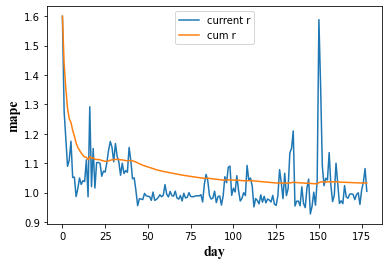

In [71]:
plt.plot(np.arange(fold+1), test_score, np.arange(fold+1), test_score_cum)
plt.legend(['current r', 'cum r'])
plt.xlabel('day', fontsize=14, fontname="Times New Roman", fontweight='bold')
plt.ylabel('mape', fontsize=14, fontname="Times New Roman", fontweight='bold')

test_score.min()

<Axes: title={'center': 'Metric during training'}, xlabel='Iterations', ylabel='l2'>

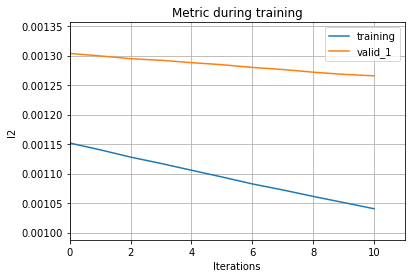

In [68]:
plot_metric(evals, 'l2')

<Axes: title={'center': 'Metric during training'}, xlabel='Iterations', ylabel='mape'>

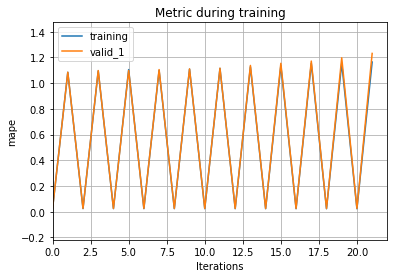

In [70]:
plot_metric(evals, 'mape')

In [73]:
# select important feature
importance_plot = importance.copy()
importance_plot = importance_plot/importance_plot.max()
importance_plot = np.log(importance_plot)+5

feature_gain = importance.sort_values('importance_gain', ascending=False).iloc[:20].index
feature_split = importance_plot.sort_values('importance_split', ascending=False).iloc[:20].index
feature_sel = feature_gain.union(feature_split)
print(f'length of the feature:{len(feature_sel)}')
feature_sel

length of the feature:21


Index(['asset', 'awesome', 'close_ma_diff_10', 'close_ma_diff_20',
       'close_ma_diff_5', 'ht_dcperiod', 'ht_phasor_inphasse',
       'ht_sine_leadsine', 'ht_sine_sine', 'morning_breturn2',
       'morning_breturn5', 'morning_volume_ratio2', 'morning_volume_ratio5',
       'pcf', 'pe', 'return_0', 'rsi', 'tail_breturn2', 'tail_breturn5',
       'tail_volume_ratio2', 'tail_volume_ratio5'],
      dtype='object', name='feature_name')

Text(0.5, 1.0, 'Scaled importance value under log scale')

<Figure size 432x288 with 0 Axes>

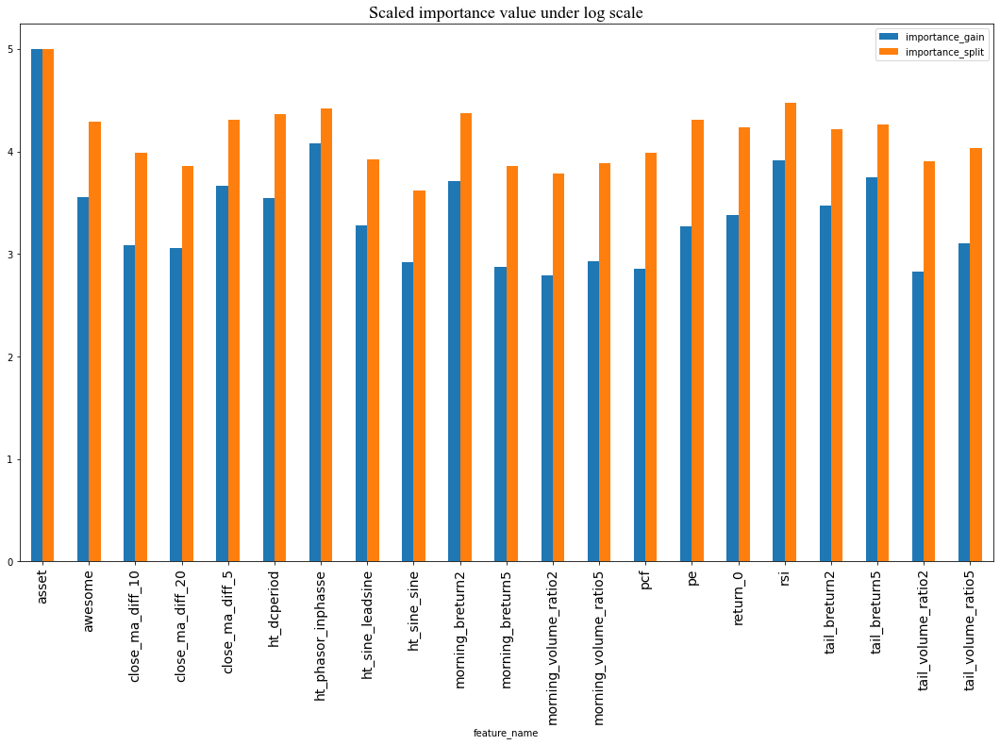

In [74]:
plt.figure(0)
# lgb.plot_importance(model, max_num_features = 15,  figsize=(10, 10), importance_type = 'gain')
importance_plot.loc[feature_sel].plot.bar(rot=0)
fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
plt.xticks(fontsize=14, rotation=90)
plt.title('Scaled importance value under log scale', fontname="Times New Roman", fontsize=18)


<Figure size 432x288 with 0 Axes>

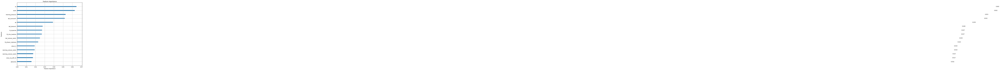

In [78]:
plt.figure(0)
lgb.plot_importance(model, max_num_features = 15,  figsize=(10, 10), importance_type = 'gain')
plt.savefig('importance_gain.png')

In [80]:
lgb_best.keys()

dict_keys(['nthread', 'objective', 'feature_fraction', 'bagging_freq', 'bagging_seed', 'verbosity', 'metric', 'early_stopping_rounds', 'lambda_l1', 'lambda_l2', 'learning_rate', 'max_depth', 'num_leaves', 'subsample'])

In [81]:
keys =['lambda_l1', 'lambda_l2', 'learning_rate', 'max_depth', 'subsample', 'num_leaves']
param_monitor = np.zeros((len(keys),fold))
for j in range(fold):
    current_params = params_best_dict[j]
    for (i,key) in enumerate(keys):
        param_monitor[i, j] = current_params[key]


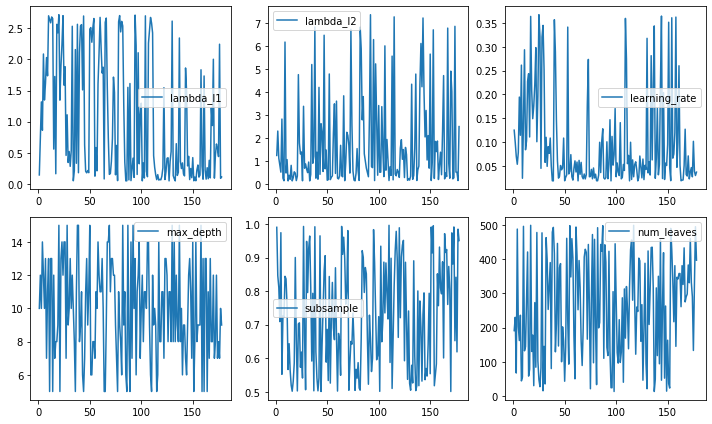

In [82]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(10, 6))  # define the figure and subplots
axes = axes.ravel()  # array to 1D

day = np.arange(1,fold+1)

for i in range(param_monitor.shape[0]):

    axes[i].plot(day, param_monitor[i])
    axes[i].legend([keys[i]])
    i += 1
fig.tight_layout()

In [92]:
# retrain lgbm
target = 'return'
_start = val_split_day - 50
_end = val_split_day + 1

features = list(feature_sel.drop('asset'))

enable_asset = True


train_df = _ds[features + [target]].sel(day=range(_start, val_split_day)).to_dataframe(dim_order=['day', 'asset'])
val_df = _ds[features + [target]].sel(day=slice(val_split_day, _end)).to_dataframe(dim_order=['day', 'asset'])
if enable_asset:
    train_df.reset_index(level='asset', inplace=True)
    val_df.reset_index(level='asset', inplace=True)
train_X, train_y = train_df[features + (['asset'] if enable_asset else [])].copy(), train_df[target].copy()
train_y_binary = (train_y > 0).astype(int)
val_X, val_y = val_df[features + (['asset'] if enable_asset else [])].copy(), val_df[target].copy()
val_y_binary = (val_y > 0).astype(int)

train_data = lgb.Dataset(data=train_X, label=train_y, categorical_feature=categorical_feature, free_raw_data=False)
val_data = lgb.Dataset(data=val_X, label=val_y, categorical_feature=categorical_feature, free_raw_data=False)





In [93]:
lgbm_hyp = {
 'lambda_l1': 1,
 'lambda_l2': 4,
 'learning_rate': 0.1,
 'max_depth': 11,
  'subsample': 0.8,
 'num_leaves': 500,
'num_boost_round': 80}

vals = {}
num_boost_round, lgb_best = arg_aug(lgbm_hyp, handle_int=True)
model = lgb.train(params=lgb_best, train_set=train_data, num_boost_round=num_boost_round,
                  valid_sets=[train_data, val_data], categorical_feature=categorical_feature,
                  callbacks=[early_stopping(50, verbose=False), record_evaluation(evals)])

<Axes: title={'center': 'Metric during training'}, xlabel='Iterations', ylabel='l2'>

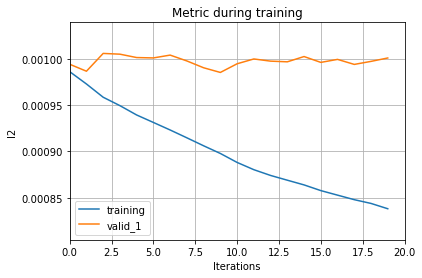

In [94]:
plot_metric(evals, 'l2')

<Axes: title={'center': 'Metric during training'}, xlabel='Iterations', ylabel='mape'>

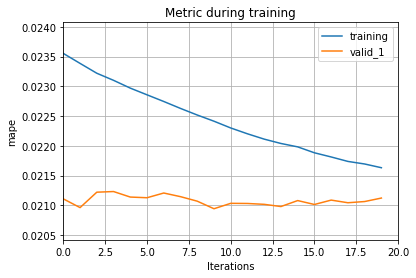

In [95]:
plot_metric(evals, 'mape')

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

<Figure size 432x288 with 0 Axes>

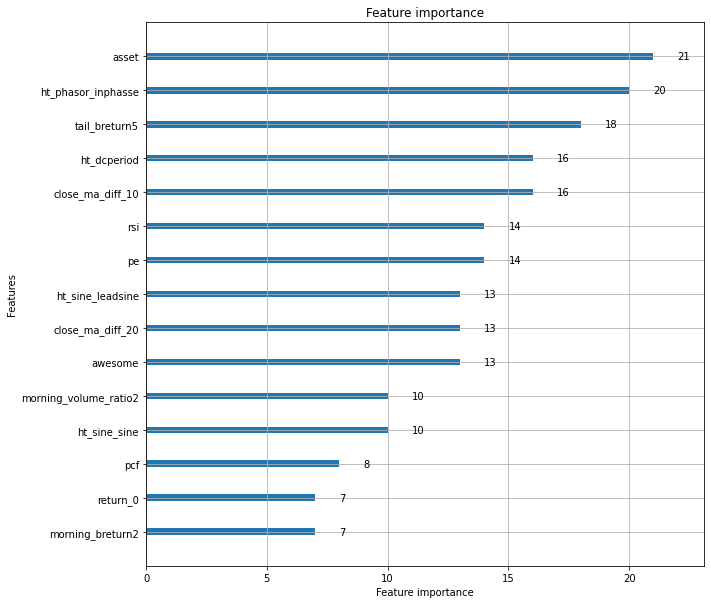

In [97]:
plt.figure(0)
lgb.plot_importance(model, max_num_features = 15,  figsize=(10, 10), importance_type = 'split')

In [98]:

num_days = end_day-start_day
# create a TimeSeriesSplit that predicts return for every trading day
test_fold = TimeSeriesSplit(n_splits=int(num_days/2)-1, max_train_size= 50, test_size=2)
target = 'return'
trange = np.arange(start_day, end_day) # create time range to split

importance = None
warnings.filterwarnings("ignore", category=UserWarning)
# variable to store performance stat
test_score = np.zeros(test_fold.get_n_splits(trange))
test_score_cum = np.zeros(test_fold.get_n_splits(trange))
y_true_cum = np.array([])
y_pred_cum = np.array([])


enable_asset = True
enable_day = False



for fold, (train_day_idx, test_day_idx) in enumerate(tqdm(test_fold.split(trange), total = test_fold.get_n_splits(trange))):

    train_df = _ds[features + [target]].isel(day=train_day_idx).to_dataframe(dim_order=['day', 'asset'])
    test_df = _ds[features + [target]].isel(day=test_day_idx).to_dataframe(dim_order=['day', 'asset'])
    if enable_asset:
        train_df.reset_index(level='asset', inplace=True)
        test_df.reset_index(level='asset', inplace=True)
        # train_df['asset'] = train_df.get_level_values('asset')
        # val_df['asset'] = val_df.get_level_values('asset')
    if enable_day:
        train_df['day'] = train_df.index.get_level_values('day')
        test_df['day'] = test_df.index.get_level_values('day')
        features+=['day']
    train_X, train_y = train_df[features + (['asset'] if enable_asset else [])].copy(), train_df[target].copy()
    train_y_binary = (train_y > 0).astype(int)
    val_X, val_y = test_df[features + (['asset'] if enable_asset else [])].copy(), val_df[target].copy()
    val_y_binary = (val_y > 0).astype(int)

    train_data = lgb.Dataset(data=train_X, label=train_y, categorical_feature=categorical_feature, free_raw_data=False)
    val_data = lgb.Dataset(val_X, label=val_y, categorical_feature=categorical_feature, free_raw_data=False)


    lgbm_hyp = {
     'lambda_l1': 1,
     'lambda_l2': 4,
     'learning_rate': 0.1,
     'max_depth': 11,
      'subsample': 0.8,
     'num_leaves': 500,
    'num_boost_round': 80}


    num_boost_round, lgb_best = arg_aug(lgbm_hyp, handle_int=True)
    model = lgb.train(params=lgb_best, train_set=train_data, num_boost_round=num_boost_round,
                  valid_sets=[train_data, val_data],
                  categorical_feature=categorical_feature,
                 feval=mape_lgbm, #tailor-made metric
                 callbacks=[early_stopping(50, verbose=False),record_evaluation(evals)])

    # record importance feature; if does not exist, create one.
    if importance is None:
        importance = pd.DataFrame({
            'feature_name': model.feature_name(),
            'importance_gain': model.feature_importance(importance_type='gain'),
            'importance_split': model.feature_importance(importance_type='split')
        }).set_index('feature_name')
    else:
        importance_df =pd.DataFrame({
            'feature_name': model.feature_name(),
            'importance_gain': model.feature_importance(importance_type='gain'),
            'importance_split': model.feature_importance(importance_type='split')
        }).set_index('feature_name')
        importance = (importance.add(importance_df))

    test_score[fold] = mape(val_y, model.predict(val_X, num_iteration = model.best_iteration))
    y_true_cum = np.concatenate((y_true_cum, val_y.to_numpy()))
    y_pred_cum= np.concatenate((y_pred_cum, model.predict(val_X, num_iteration = model.best_iteration)))
    test_score_cum[fold] = mape(y_true_cum, y_pred_cum)

100%|██████████| 179/179 [00:08<00:00, 22.26it/s]


0.8584197138090287

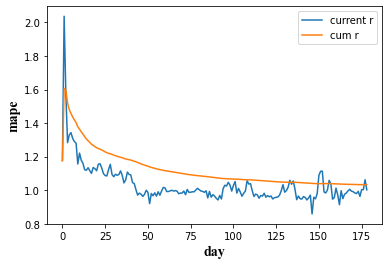

In [99]:
plt.plot(np.arange(fold+1), test_score, np.arange(fold+1), test_score_cum)
plt.legend(['current r', 'cum r'])
plt.xlabel('day', fontsize=14, fontname="Times New Roman", fontweight='bold')
plt.ylabel('mape', fontsize=14, fontname="Times New Roman", fontweight='bold')

test_score.min()

<Axes: title={'center': 'Metric during training'}, xlabel='Iterations', ylabel='l2'>

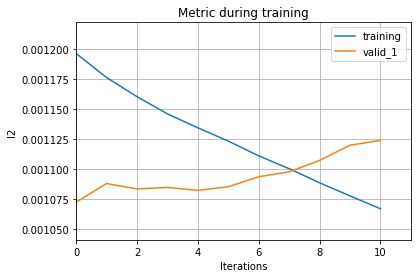

In [100]:
plot_metric(evals, 'l2')

<Axes: title={'center': 'Metric during training'}, xlabel='Iterations', ylabel='mape'>

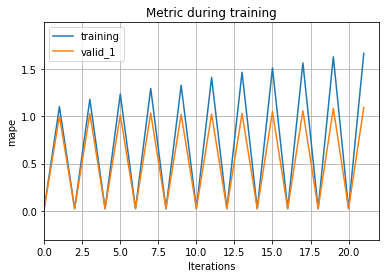

In [101]:
plot_metric(evals, 'mape')

In [102]:
features

['awesome',
 'close_ma_diff_10',
 'close_ma_diff_20',
 'close_ma_diff_5',
 'ht_dcperiod',
 'ht_phasor_inphasse',
 'ht_sine_leadsine',
 'ht_sine_sine',
 'morning_breturn2',
 'morning_breturn5',
 'morning_volume_ratio2',
 'morning_volume_ratio5',
 'pcf',
 'pe',
 'return_0',
 'rsi',
 'tail_breturn2',
 'tail_breturn5',
 'tail_volume_ratio2',
 'tail_volume_ratio5']